In [ ]:
%run scripts/verify_environment.py

verify_environment()

In [2]:
from datetime import datetime
from getpass import getpass

rdm_url = 'http://localhost:5001/'
idp_name_1 = 'FakeCAS'
idp_username_1 = None
idp_password_1 = None
rdm_project_name = 'TEST-NIISTORAGE-{}'.format(datetime.now().strftime('%Y%m%d-%H%M%S'))
default_result_path = None
close_on_fail = False
transition_timeout = 10000

In [3]:
if idp_username_1 is None:
    idp_username_1 = input(prompt=f'Username for {idp_name_1}')
if idp_password_1 is None:
    idp_password_1 = getpass(prompt=f'Password for {idp_username_1}@{idp_name_1}')
(len(idp_username_1), len(idp_password_1))

(29, 13)

In [4]:
import tempfile

work_dir = tempfile.mkdtemp()
if default_result_path is None:
    default_result_path = work_dir
work_dir

'/var/folders/m0/myy2ys0s3cl_73__2gw8fw140000gn/T/tmp7e7f2mgn'

# 複数メタデータの一括設定

- サブシステム名: アドオン
- ページ/アドオン: Metadata
- 機能分類: メタデータ入力
- シナリオ名: 複数メタデータの一括設定
- 用意するテストデータ: URL一覧、アカウント(既存ユーザー1: GRDM)
- 事前条件: 「プロジェクトに対するMetadataアドオンの登録」を実施済みであること

## ウェブブラウザの新規プライベートウィンドウでGRDMトップページを表示する

GRDMトップページが表示されること

In [5]:
import importlib
import pandas as pd

import scripts.playwright
importlib.reload(scripts.playwright)

from scripts.playwright import *
from scripts import grdm

await init_pw_context(close_on_fail=close_on_fail, last_path=default_result_path)

('20250906-060630',
 '/var/folders/m0/myy2ys0s3cl_73__2gw8fw140000gn/T/tmpckkpcidw')

Start epoch: 1757106392.096858 seconds


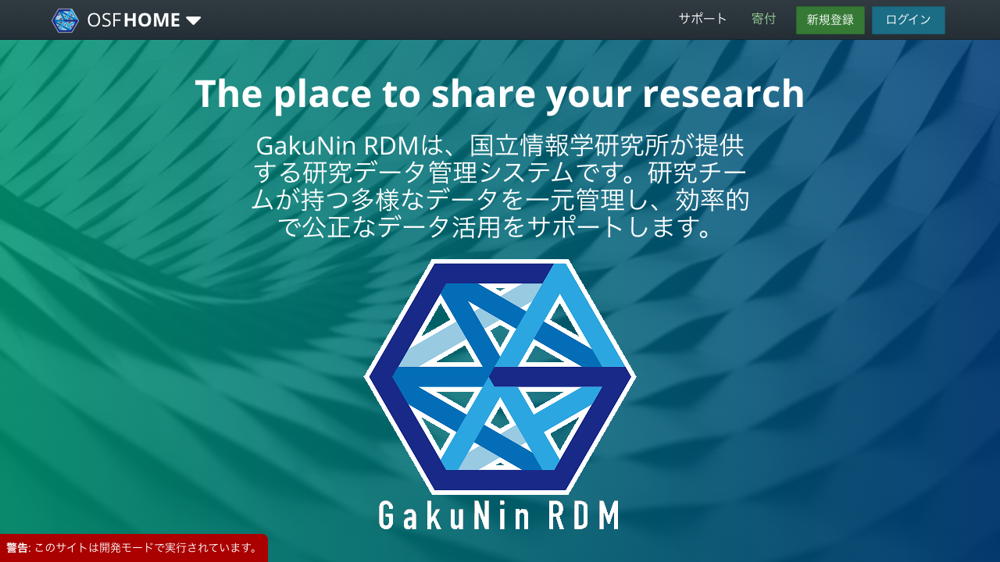

In [6]:
import time

async def _step(page):
    await page.goto(rdm_url)

    # 同意する をクリック
    await page.locator('//button[text() = "同意する"]').click()

    # 同意する が表示されなくなったことを確認
    await expect(page.locator('//button[text() = "同意する"]')).to_have_count(0, timeout=500)

await run_pw(_step)

## ログイン情報を用いてGakuNin RDMにログインする

(IdPに関するログイン情報が与えられた場合、)
GakuNin Embeded DSのプルダウンを展開し、IdPリストから指定されたIdPを選択する。その後、アカウントのID/Passwordを入力して「Login」ボタンを押下する。

(IdPが指定されていない場合、)
CASのログイン操作を実施する。

Start epoch: 1757106395.194953 seconds


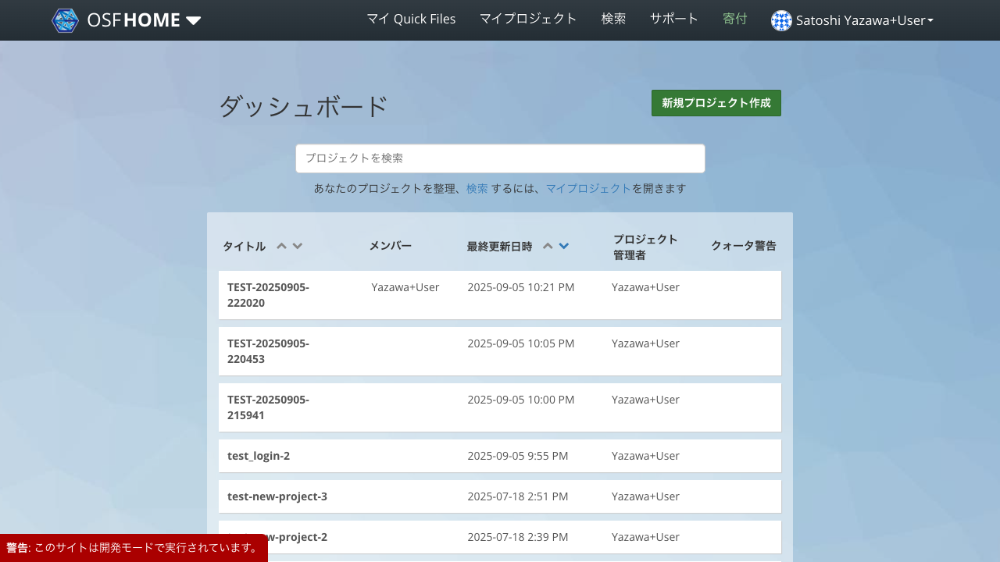

In [7]:
import scripts.grdm
importlib.reload(scripts.grdm)

async def _step(page):
    await scripts.grdm.login(
        page, idp_name_1, idp_username_1, idp_password_1, transition_timeout=transition_timeout
    )

    # GRDMのボタンが表示されることを確認
    await expect(page.locator('//*[text() = "プロジェクト管理者"]')).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## プロジェクト一覧に指定されたタイトルのプロジェクトがない場合、指定された名前のプロジェクトを作成する

プロジェクト一覧に当該プロジェクト名が表示されていない場合、「新規プロジェクト作成」をクリックし、その名前を入力、「作成」をクリックする。

Start epoch: 1757106402.851412 seconds


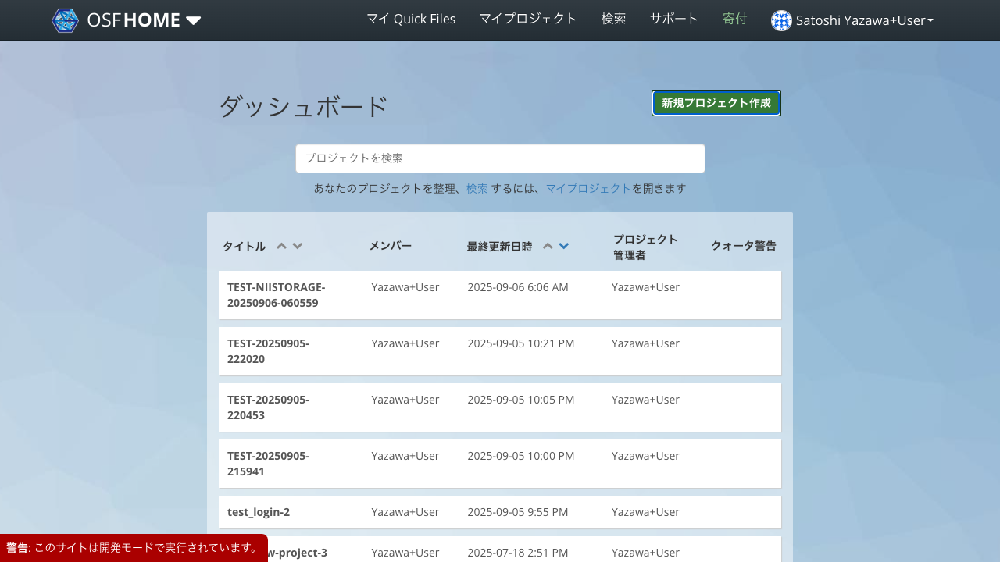

In [8]:
# import scripts.grdm
# importlib.reload(scripts.grdm)

async def _step(page):
    await expect(page.locator('//*[@data-test-create-project-modal-button]')).to_have_count(1)

    await scripts.grdm.ensure_project_exists(page, rdm_project_name, transition_timeout=transition_timeout)
        
await run_pw(_step)

## ダッシュボードのプロジェクト一覧から指定されたプロジェクトをクリックする

Start epoch: 1757106417.963076 seconds


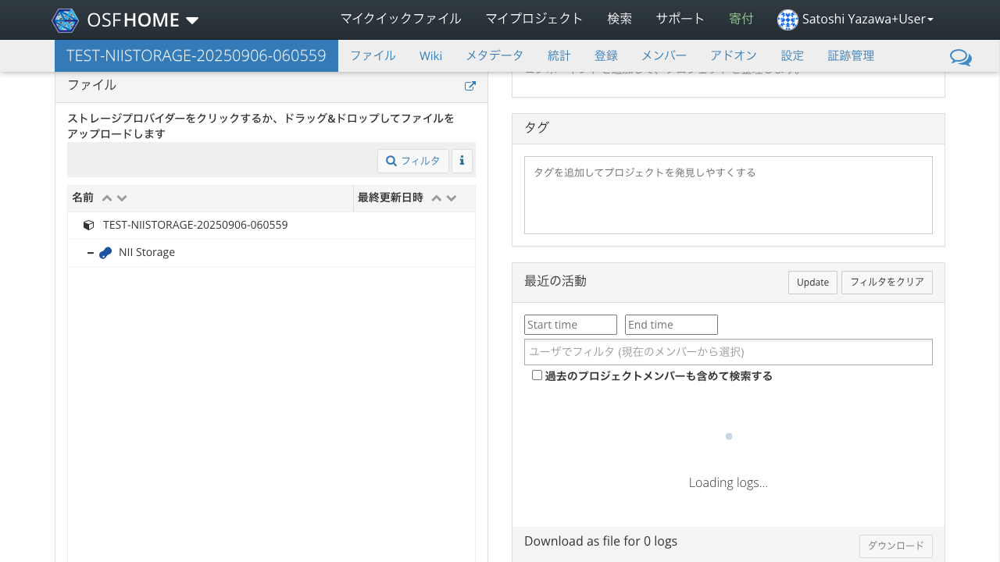

In [9]:
async def _step(page):
    await page.locator(f'//*[@data-test-dashboard-item-title and text()="{rdm_project_name}"]').click()        

    await expect(page.locator('//a[text() = "アドオン"]')).to_be_visible(timeout=transition_timeout)
    await expect(grdm.get_select_expanded_storage_title_locator(page, 'NII Storage')).to_be_visible(timeout=transition_timeout)
    time.sleep(1)

    await page.locator('//h3[text()="最近の活動"]').click()

await run_pw(_step)

## プロジェクトダッシュボードの上部メニューから「アドオン」をクリックする

「アドオンを構成」のパネル内に「Metadata」の行が表示されること

Start epoch: 1757106707.5323 seconds


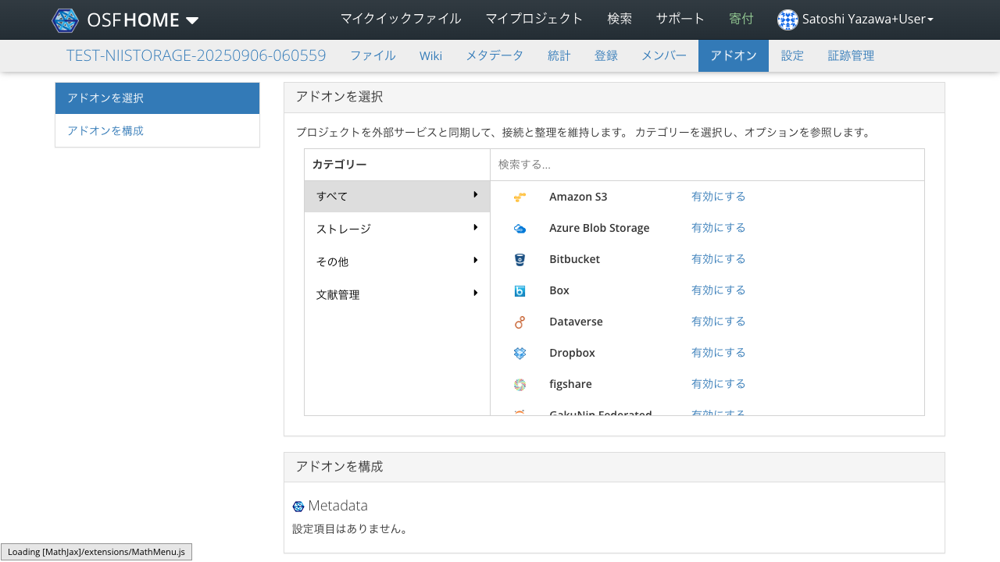

In [13]:
addon_name = 'Metadata'

async def _step(page):
    await page.locator('//a[text() = "アドオン"]').click()

    await expect(page.locator(f'//h4[@class="addon-title"][normalize-space(.)="Metadata"]')).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## プロジェクト名をクリックする

Start epoch: 1757106729.328077 seconds


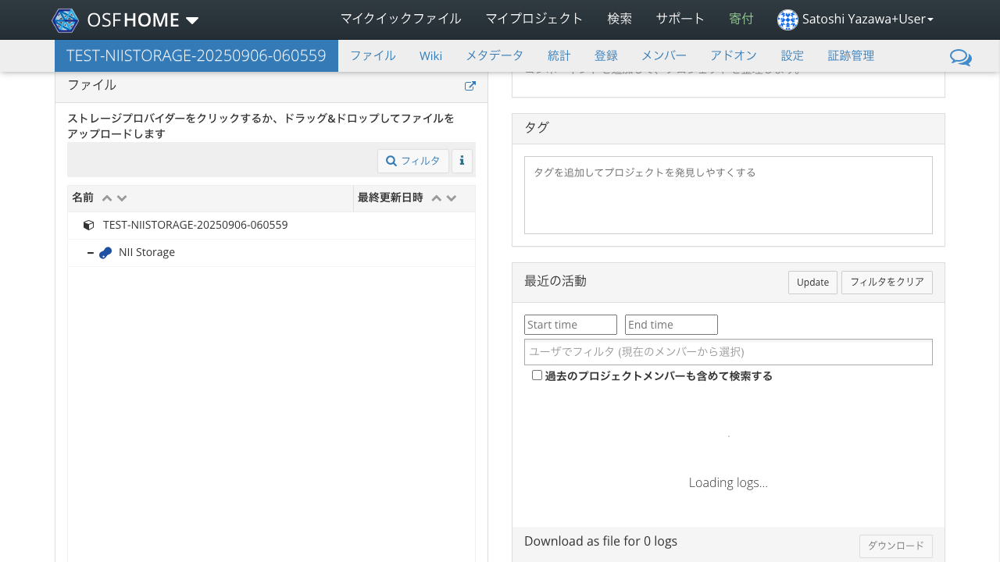

In [14]:
async def _step(page):
    await page.locator(f'//*[contains(@class, "project-title") and contains(text(), "{rdm_project_name}")]').click()        

    await expect(page.locator('//a[text() = "アドオン"]')).to_be_visible(timeout=transition_timeout)
    await expect(grdm.get_select_expanded_storage_title_locator(page, 'NII Storage')).to_be_visible(timeout=transition_timeout)
    time.sleep(1)

    await page.locator('//h3[text()="最近の活動"]').click()

await run_pw(_step)

## 「NII Storage」をクリックする

「メタデータ編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769717.4458113 seconds


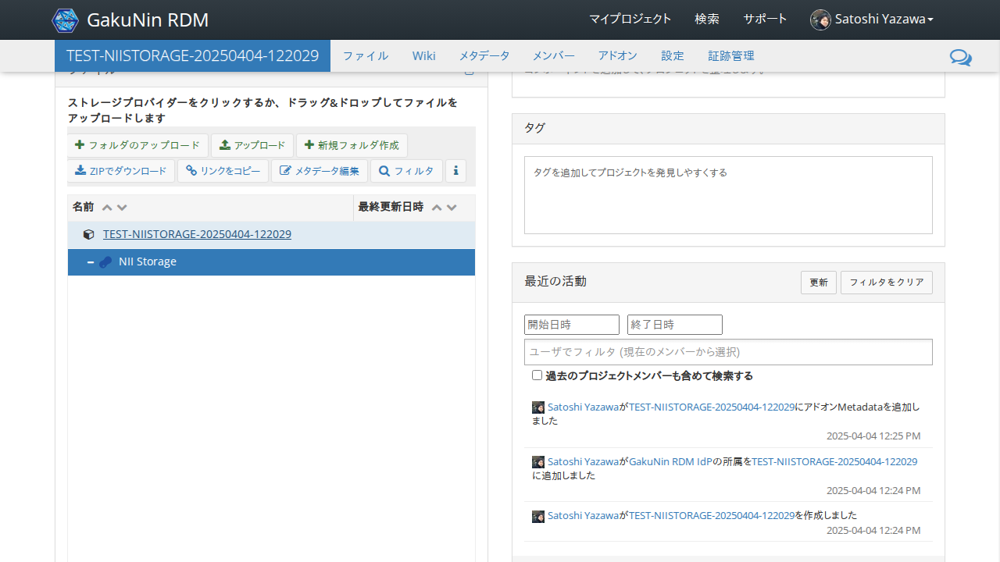

In [24]:
# import scripts.grdm
# importlib.reload(scripts.grdm)

async def _step(page):
    await grdm.get_select_storage_title_locator(page, 'NII Storage').click()
    
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

## 「新規フォルダ作成」をクリックする

フォルダ名入力テキストフィールドが表示されること

Start epoch: 1743769727.1990829 seconds


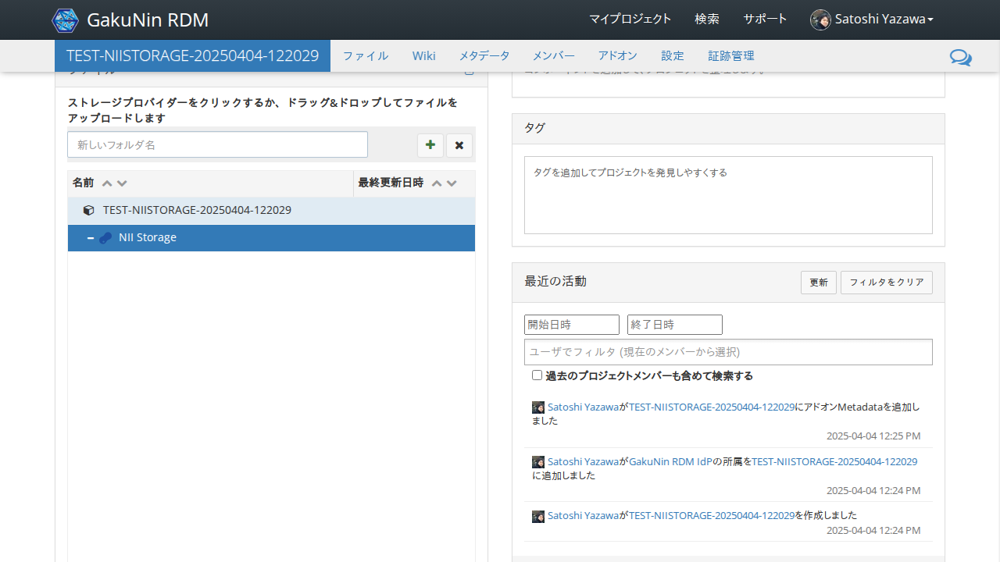

In [25]:
async def _step(page):
    await page.locator('//*[text() = "新規フォルダ作成"]').click()
    
    await expect(page.locator('//input[@id = "createFolderInput"]')).to_be_editable(timeout=transition_timeout)

await run_pw(_step)

## 「TESTMULTIPLE(ENTER)」を入力する

TESTMULTIPLEフォルダが作成されること

Start epoch: 1743769727.426373 seconds


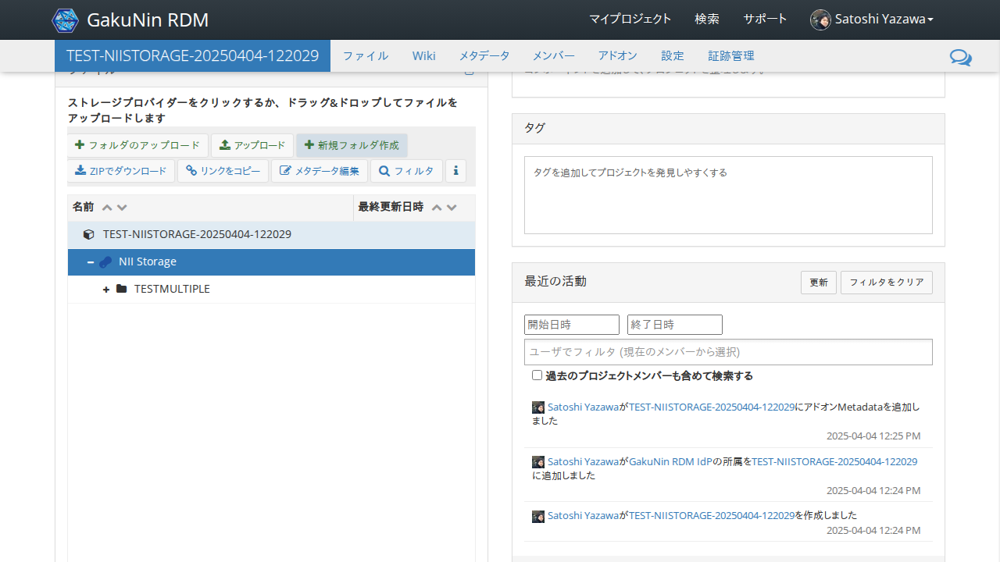

In [26]:
# import scripts.grdm
# importlib.reload(scripts.grdm)

async def _step(page):
    await page.locator('//input[@id = "createFolderInput"]').fill('TESTMULTIPLE')
    await page.keyboard.press('Enter')

    await expect(grdm.get_select_folder_title_locator(page, 'TESTMULTIPLE')).to_be_visible(timeout=30000)

await run_pw(_step)

## 「NII Storage」をクリックする

「メタデータ編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769729.5353608 seconds


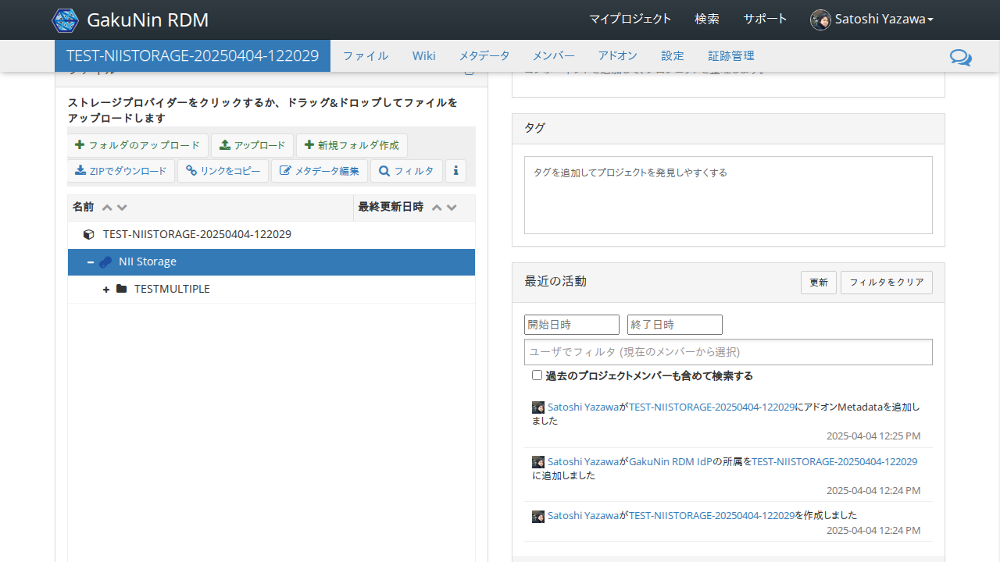

In [27]:
async def _step(page):
    await grdm.get_select_storage_title_locator(page, 'NII Storage').click()
    
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

## ファイルをアップロードする

テスト環境の「サンプル.png」をNII Storage配下にドラッグ＆ドロップする。

In [28]:
await save_screenshot(os.path.join(work_dir, 'サンプル.png'))

'/tmp/tmpbaeuofwa/サンプル.png'

Start epoch: 1743769794.4429238 seconds


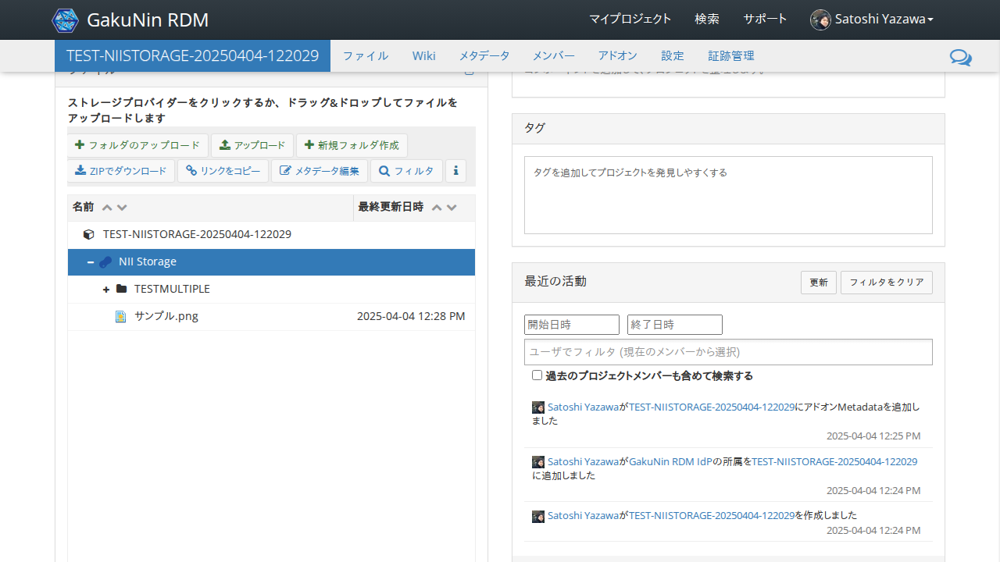

In [31]:
# progress-bar progress-bar-info progress-bar-striped active
# import scripts.grdm
# importlib.reload(scripts.grdm)

async def _step(page):
    dropzone = grdm.get_select_storage_title_xpath('NII Storage')
    await grdm.drop_file(page, dropzone, os.path.join(work_dir, 'サンプル.png'))
    time.sleep(1)

    await expect(page.locator('//*[text() = "サンプル.png"]/../following-sibling::*//*[@role = "progressbar"]')).to_have_count(0, timeout=30000)
    await expect(grdm.get_select_file_title_locator(page, 'サンプル.png')).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## 「サンプル.png」のアイコンをクリックする

「メタデータ編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769811.969032 seconds


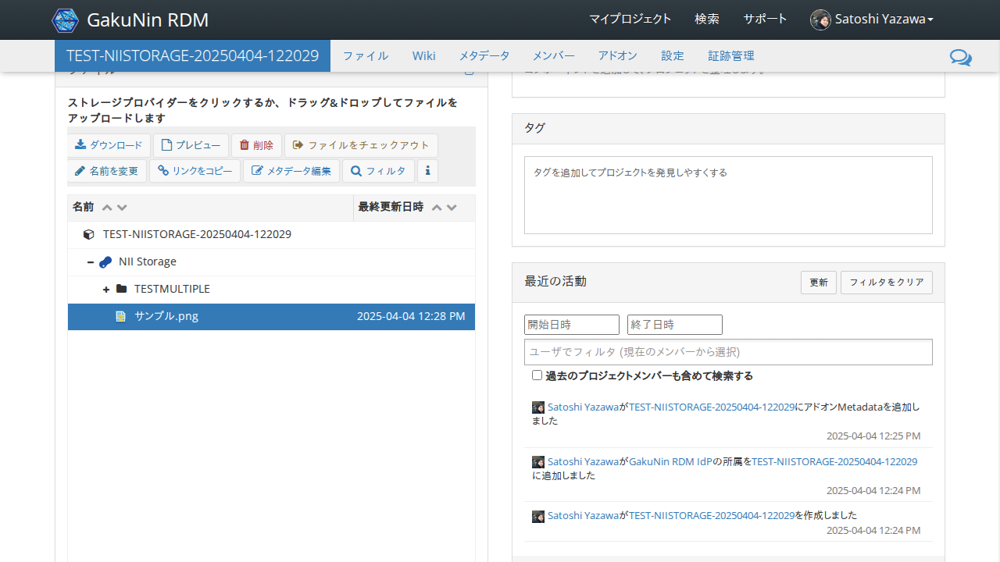

In [32]:
# import scripts.grdm
# importlib.reload(scripts.grdm)

async def _step(page):
    await grdm.get_select_file_extension_locator(page, 'サンプル.png').click()
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

## Shiftキーを押しながら「TESTMULTIPLE」をクリックする

「サンプル.png」と「TESTMULTIPLE」の両方が選択状態になり、「メタデータ複数編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769812.1971855 seconds


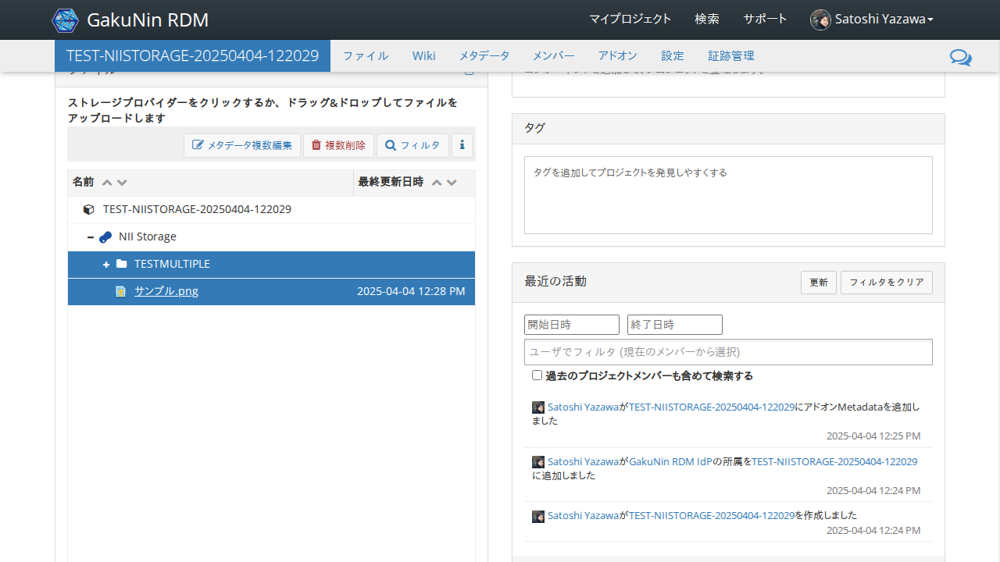

In [33]:
async def _step(page):
    await grdm.get_select_folder_title_locator(page, 'TESTMULTIPLE').click(modifiers=['Shift'])
    await expect(page.locator('//*[text() = "メタデータ複数編集"]')).to_be_enabled(timeout=transition_timeout)
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_have_count(0, timeout=transition_timeout)

await run_pw(_step)

##  「メタデータ複数編集」をクリックする

「ファイルメタデータの複数編集」ダイアログが表示されること

Start epoch: 1743769812.4295511 seconds


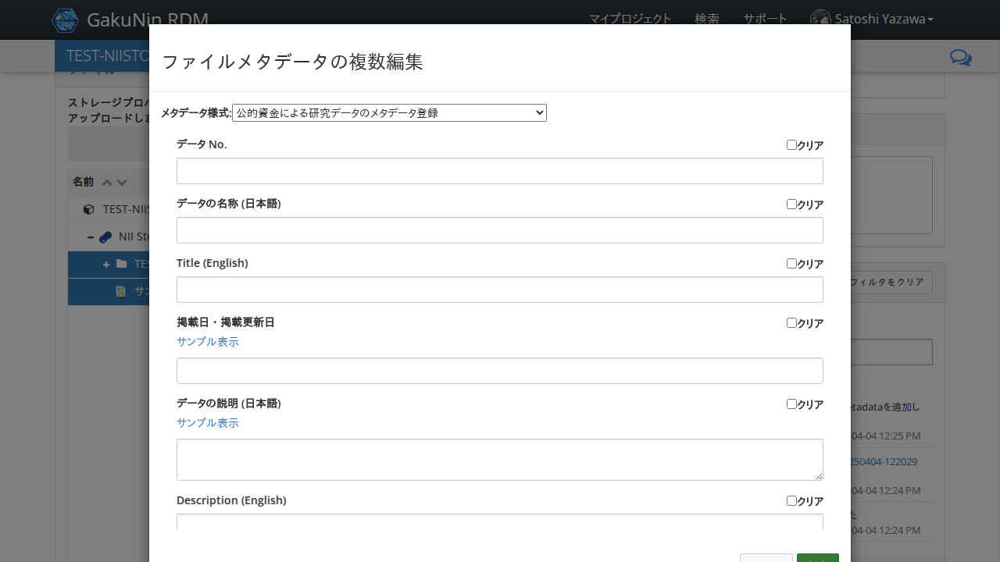

In [34]:
async def _step(page):
    await page.locator('//*[text() = "メタデータ複数編集"]').click()

    await expect(page.locator('//label[contains(text(), "メタデータ様式")]/following-sibling::select')).to_be_editable(timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

##  「メタデータ様式」に「研究成果（公的資金対応）のメタデータ登録」を入力する

「データNo.」フィールドが表示されること

Start epoch: 1743769813.7102065 seconds


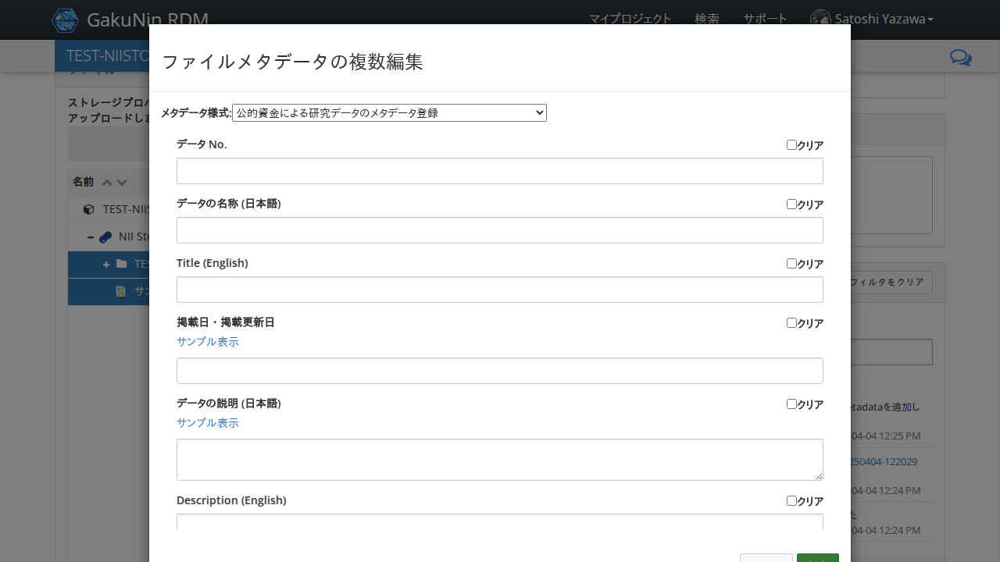

In [35]:
import scripts.metadata_v2025
importlib.reload(scripts.metadata_v2025)
from scripts.metadata_v2025 import FileMetadataForm

async def _step(page):
    await page.locator('//label[contains(text(), "メタデータ様式")]/following-sibling::select').select_option('研究成果（公的資金対応）のメタデータ登録')

    await expect(page.locator('//label[contains(text(), "データ No.")]/../following-sibling::div[1]//input')).to_be_editable(timeout=transition_timeout)

await run_pw(_step)

##  「データ No.」に「0123456789(ENTER)」を入力する

入力した値が表示されること

Start epoch: 1743769813.8873653 seconds


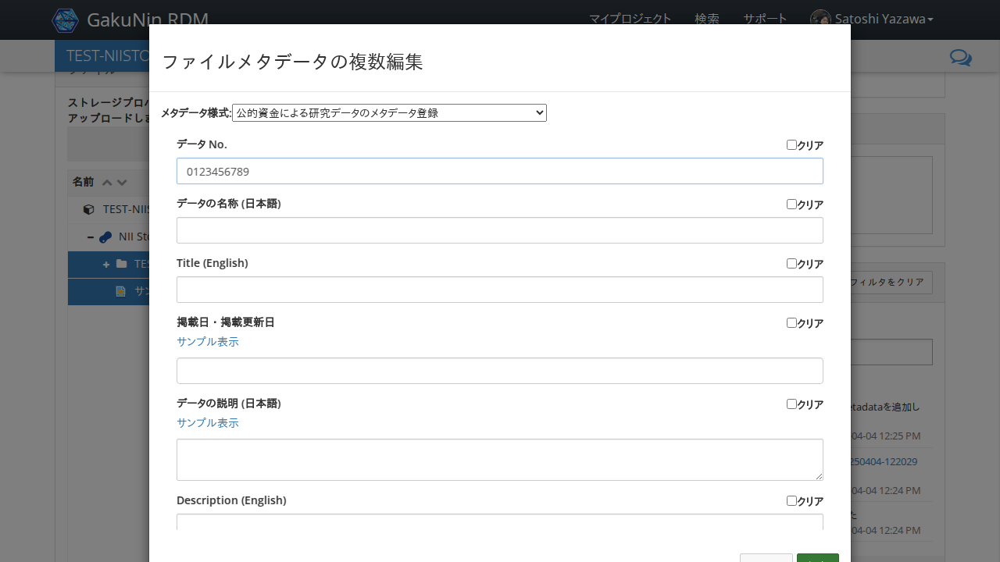

In [36]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データ No.', '0123456789')
    await page.keyboard.press('Enter')

    await expect(form.get_locator('データ No.')).to_have_value('0123456789', timeout=transition_timeout)

await run_pw(_step)


##  「データの名称(日本語)」に「テストデータ」を入力する

入力した値が表示されること

Start epoch: 1743769814.1361964 seconds


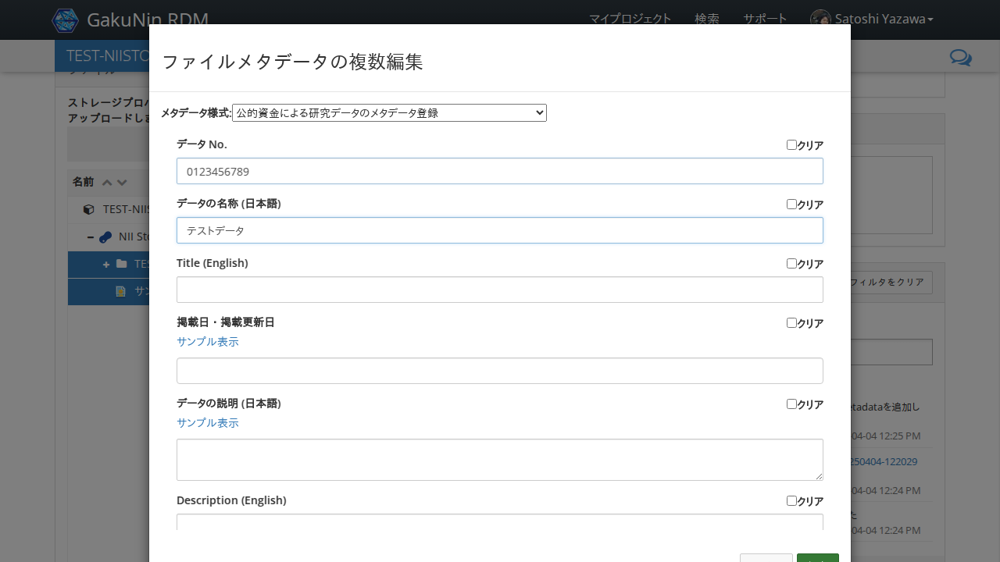

In [37]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データの名称 (日本語)', 'テストデータ')
    await page.keyboard.press('Enter')

    await expect(form.get_locator('データの名称 (日本語)')).to_have_value('テストデータ', timeout=transition_timeout)

await run_pw(_step)


##  「Data title (English)」に「Test Data」を入力する

入力した値が表示されること

Start epoch: 1743769814.4047658 seconds


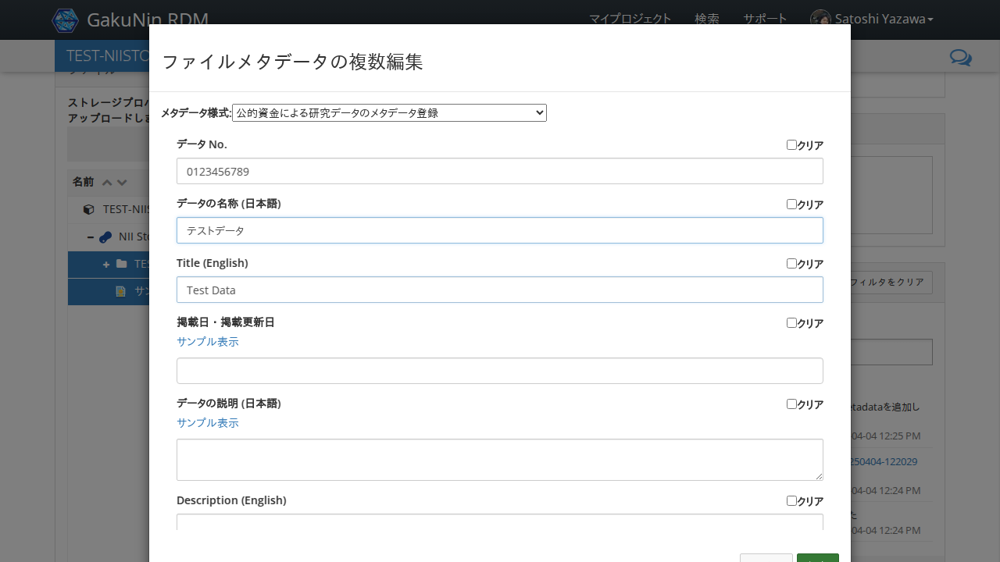

In [38]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('Data title (English)', 'Test Data')
    await page.keyboard.press('Enter')

    await expect(form.get_locator('Data title (English)')).to_have_value('Test Data', timeout=transition_timeout)

await run_pw(_step)


##  「掲載日・掲載更新日」に「2022-05-25」を入力する

入力した値が表示されること

Start epoch: 1743769814.6258087 seconds


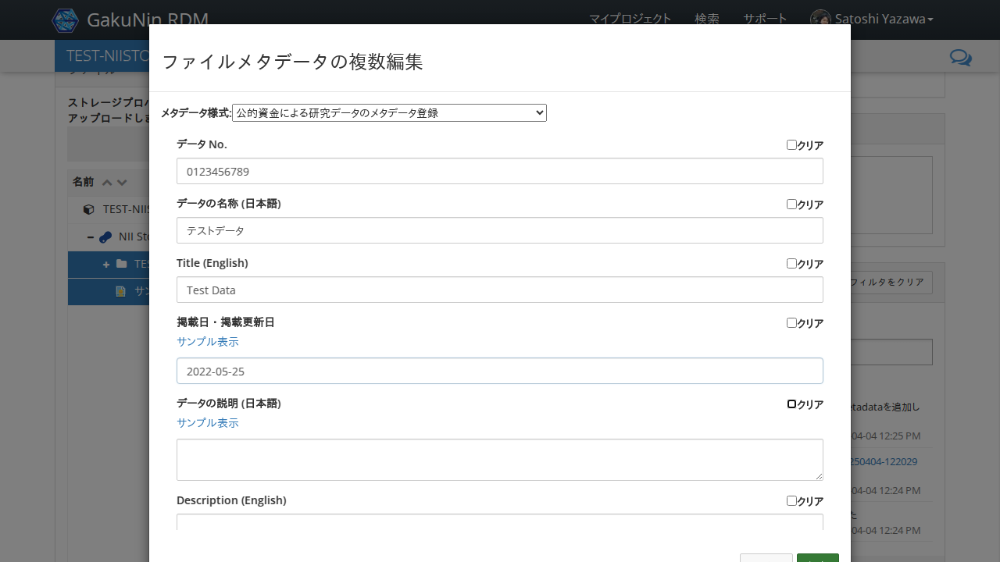

In [39]:
async def _step(page):
    form = FileMetadataForm(page)
    locator = form.get_locator('掲載日・掲載更新日')
    await locator.focus()
    await page.keyboard.type('2022-05-25')
    await page.keyboard.press('Tab')

    await expect(locator).to_have_value('2022-05-25', timeout=transition_timeout)

await run_pw(_step)


##  「データの説明 (日本語)」に「自動テストによって作成されたメタデータです。」を入力する

入力した値が表示されること

Start epoch: 1743769815.0715556 seconds


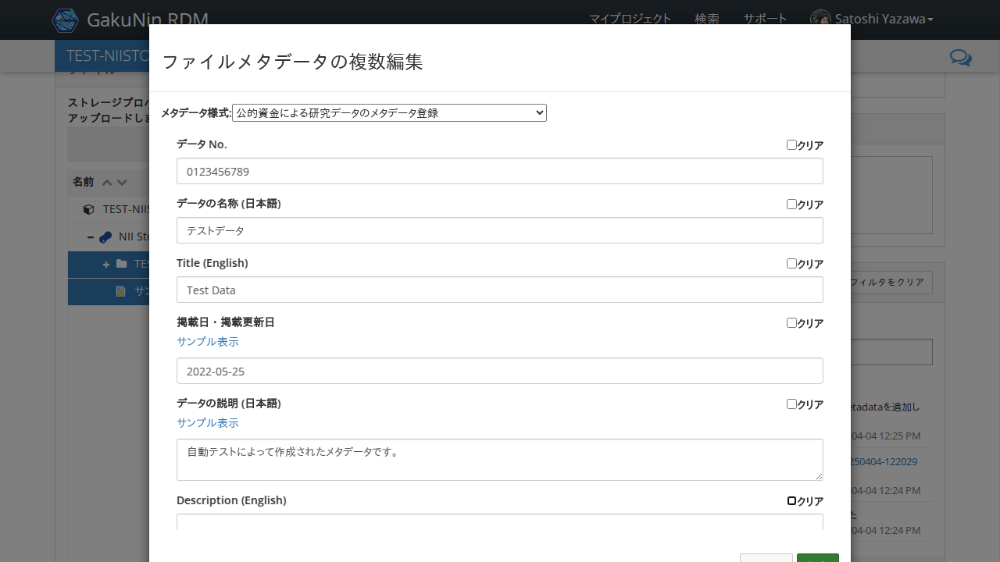

In [40]:
async def _step(page):
    await expect(page.locator('//*[contains(text(), "このフィールドは必須項目です。")]')).to_have_count(0)
    form = FileMetadataForm(page)
    await form.fill('データの説明 (日本語)', '自動テストによって作成されたメタデータです。')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('データの説明 (日本語)')).to_have_value('自動テストによって作成されたメタデータです。', timeout=transition_timeout)

await run_pw(_step)


##  「Description (English)」に「Metadata created by automated testing.」を入力する

入力した値が表示されること

Start epoch: 1743769815.3099527 seconds


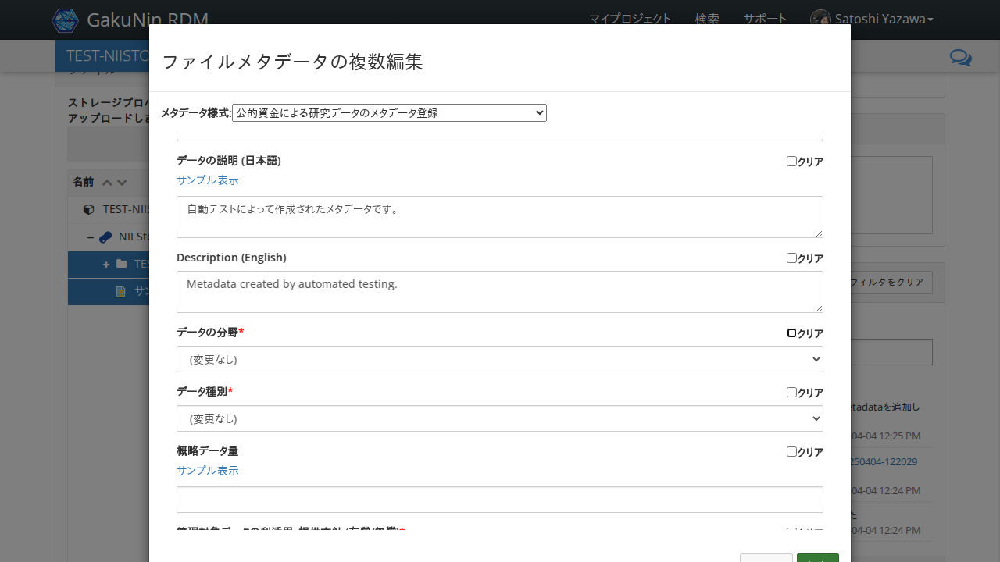

In [41]:
async def _step(page):
    await expect(page.locator('//*[contains(text(), "このフィールドは必須項目です。")]')).to_have_count(0)
    form = FileMetadataForm(page)
    await form.fill('Description (English)', 'Metadata created by automated testing.')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('Description (English)')).to_have_value('Metadata created by automated testing.', timeout=transition_timeout)

await run_pw(_step)


##  「概略データ量」に「1KB」を入力する

入力した値が表示されること

Start epoch: 1743769815.5239933 seconds


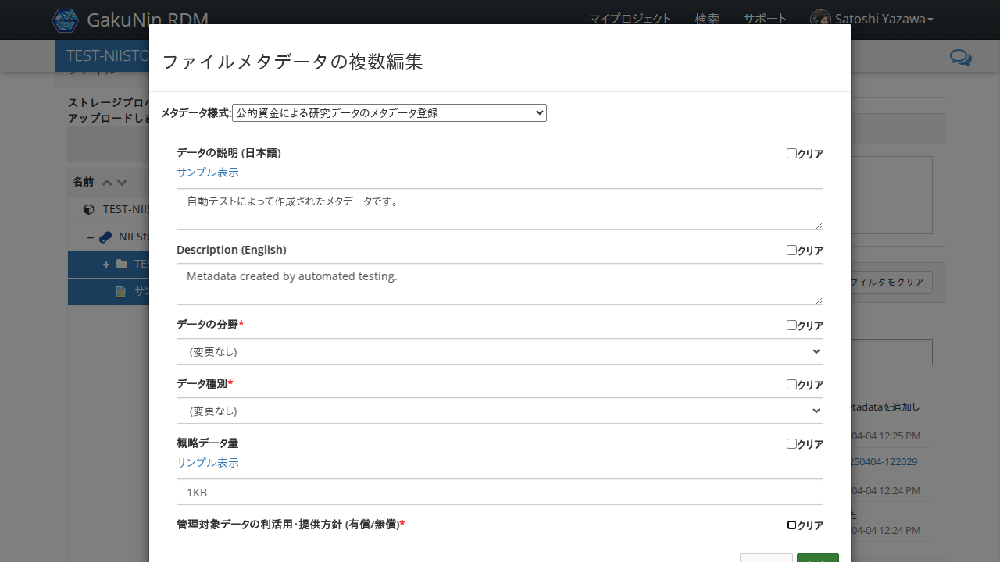

In [42]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('概略データ量', '1KB')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('概略データ量')).to_have_value('1KB', timeout=transition_timeout)

await run_pw(_step)


##  「管理対象データの利活用・提供方針 (有償/無償)」に「無償」を入力する

入力した値が表示されること

Start epoch: 1743769815.760456 seconds


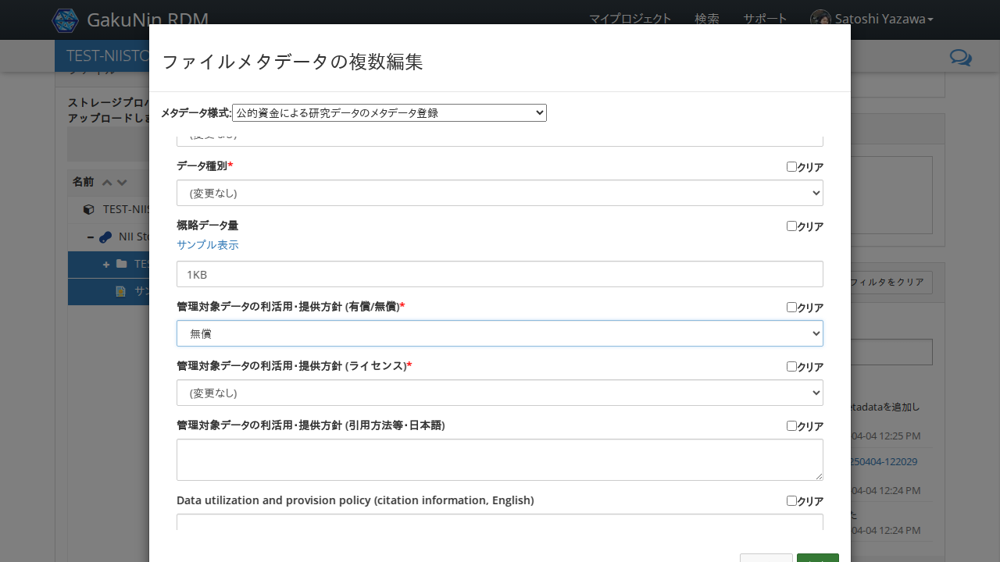

In [43]:
async def _step(page):
    await expect(page.locator('//*[contains(text(), "このフィールドは必須項目です。")]')).to_have_count(0)
    form = FileMetadataForm(page)
    await form.fill('管理対象データの利活用・提供方針 (有償/無償)', '無償')

    await expect(form.get_locator('管理対象データの利活用・提供方針 (有償/無償)').locator('input[type="radio"]:checked').locator('xpath=..')).to_have_text('無償', timeout=transition_timeout)

await run_pw(_step)


##  「管理対象データの利活用・提供方針 (ライセンス)」に「CC BY 4.0 表示 国際」を入力する

選択肢に「CC0 1.0 パブリック・ドメイン提供」がなく(修正前なのでスキップ TODO)、入力した値が表示されること

Start epoch: 1743769874.7669613 seconds


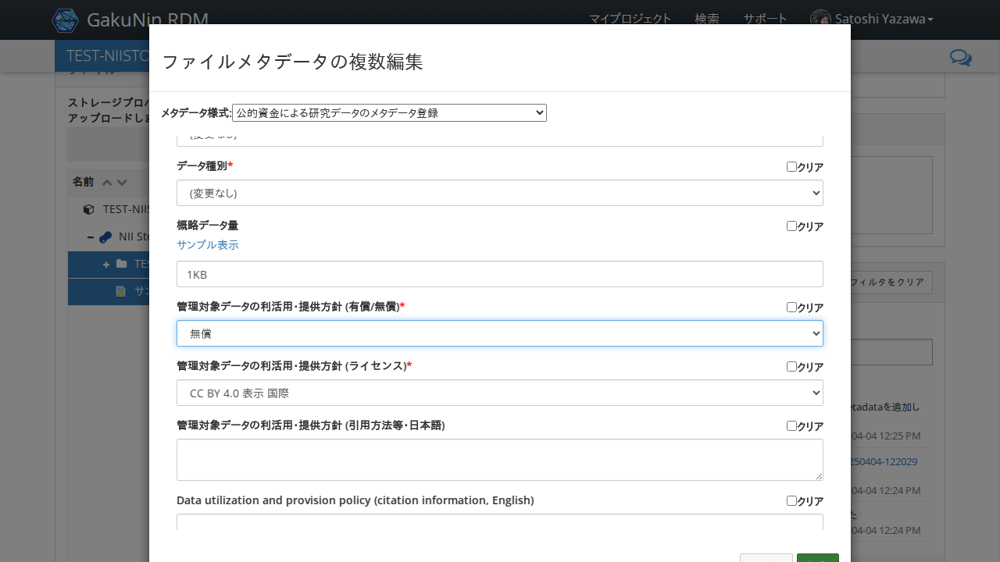

In [46]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('管理対象データの利活用・提供方針 (ライセンス)', 'CC BY 4.0 表示 国際')

    await expect(form.get_locator('管理対象データの利活用・提供方針 (ライセンス)').locator('option:checked')).to_have_text('CC BY 4.0 表示 国際', timeout=transition_timeout)

await run_pw(_step)


##  「管理対象データの利活用・提供方針 (引用方法等・日本語)」に「利用方針をここに記載します。」を入力する

入力した値が表示されること

Start epoch: 1743769889.0566876 seconds


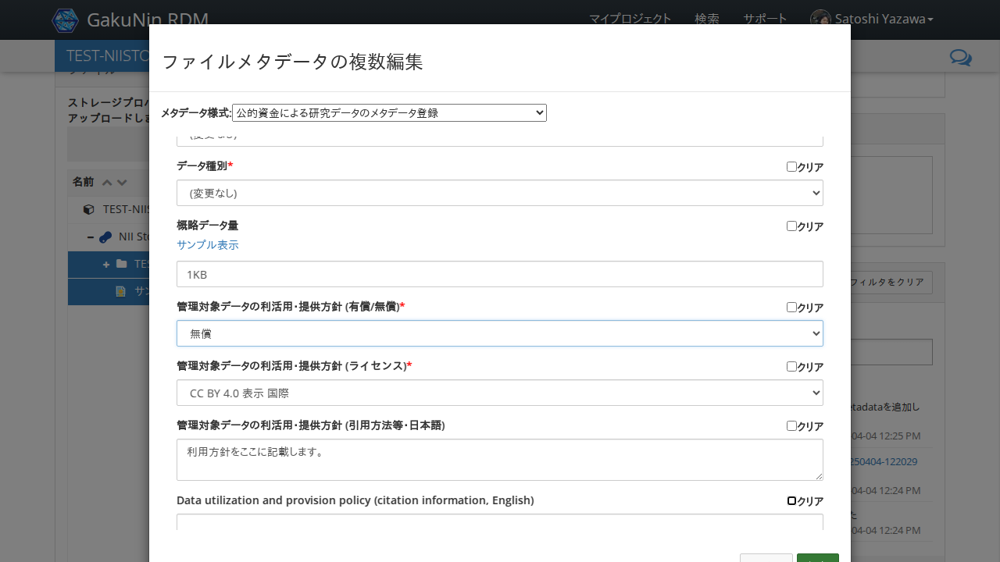

In [47]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('管理対象データの利活用・提供方針 (引用方法等・日本語)', '利用方針をここに記載します。')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('管理対象データの利活用・提供方針 (引用方法等・日本語)')).to_have_value('利用方針をここに記載します。', timeout=transition_timeout)

await run_pw(_step)


##  「Data utilization and provision policy (citation information, English)」に「The policy for use is described here.」を入力する

入力した値が表示されること

Start epoch: 1743769889.3002315 seconds


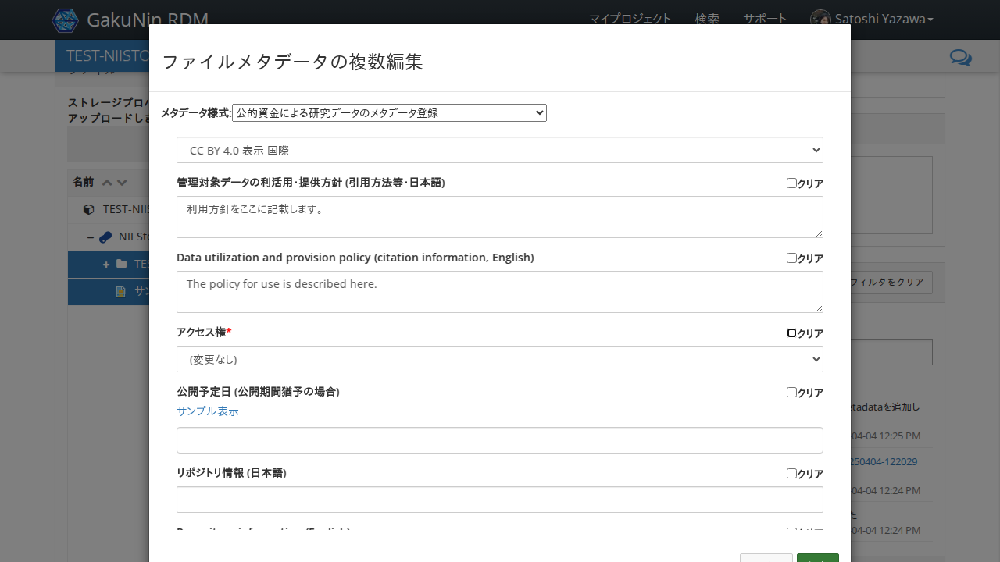

In [48]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('Data utilization and provision policy (citation information, English)', 'The policy for use is described here.')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('Data utilization and provision policy (citation information, English)')).to_have_value('The policy for use is described here.', timeout=transition_timeout)

await run_pw(_step)


##  「アクセス権」に「公開」を入力する

入力した値が表示されること

Start epoch: 1743769889.530607 seconds


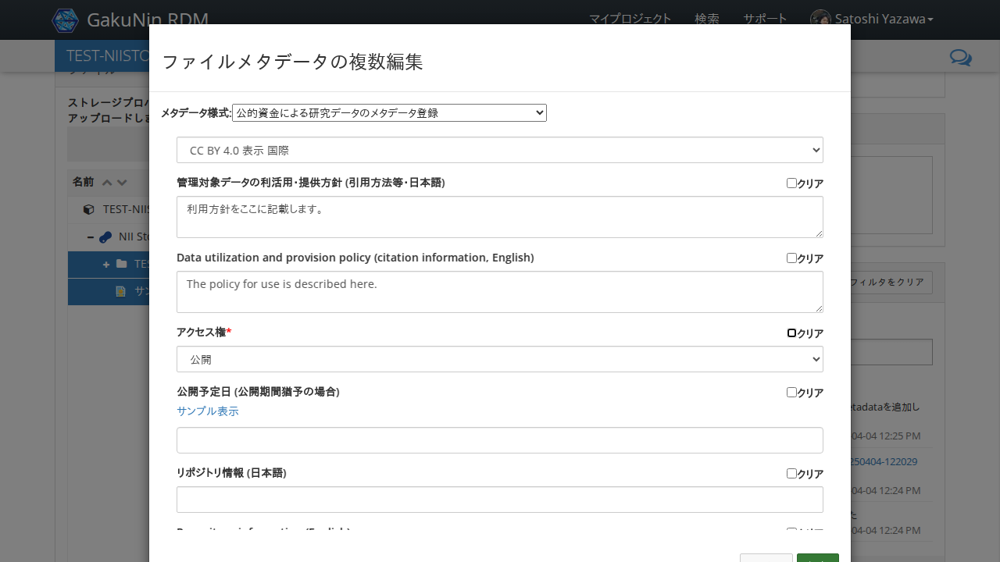

In [49]:
async def _step(page):
    label_text = 'アクセス権'
    await expect(page.locator(f'//label[text() = "{label_text}"]/../../*[contains(text(), "このフィールドは必須項目です。")]')).to_have_count(0, timeout=transition_timeout)
    form = FileMetadataForm(page)
    await form.fill('アクセス権', '公開')

await run_pw(_step)


##  「リポジトリ情報 (日本語)」に「テストリポジトリ」を入力する

入力した値が表示されること

Start epoch: 1743769889.7344873 seconds


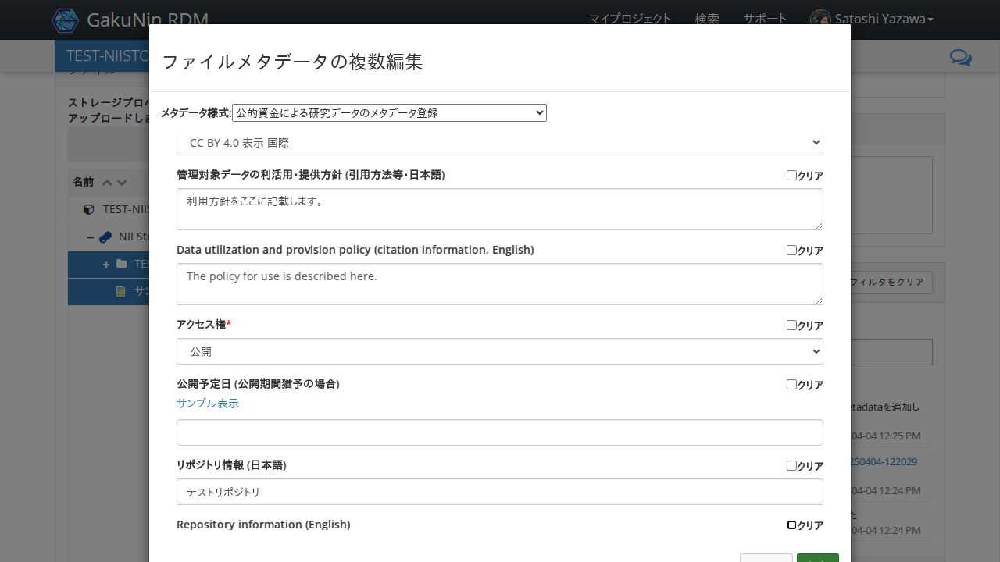

In [50]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('リポジトリ情報 (日本語)', 'テストリポジトリ')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('リポジトリ情報 (日本語)')).to_have_value('テストリポジトリ', timeout=transition_timeout)

await run_pw(_step)


##  「Repository information (English)」に「Test Repository」を入力する

入力した値が表示されること

Start epoch: 1743769889.948848 seconds


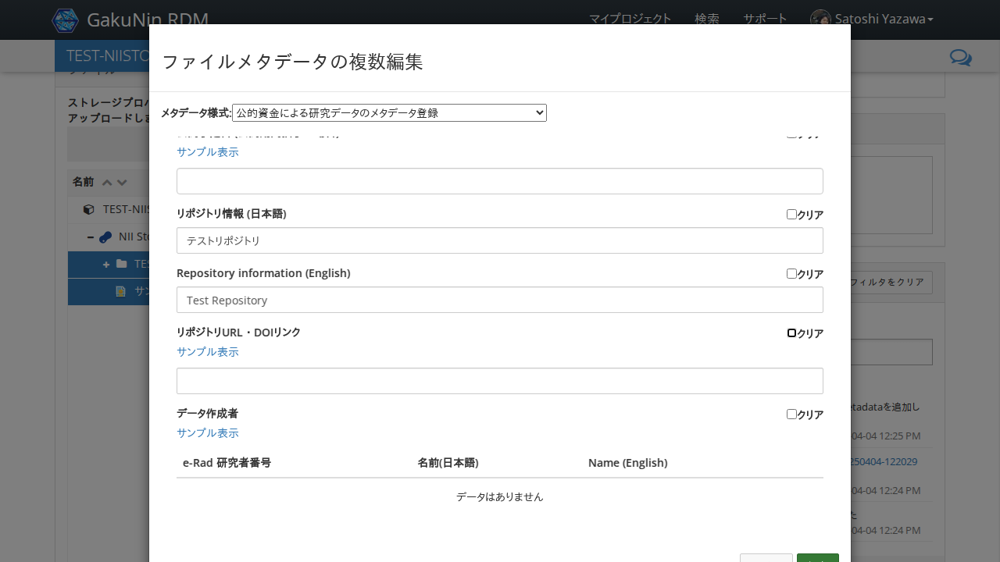

In [51]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('Repository information (English)', 'Test Repository')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('Repository information (English)')).to_have_value('Test Repository', timeout=transition_timeout)

await run_pw(_step)


##  「リポジトリURL・DOIリンク」に「https://test.doi」を入力する

入力した値が表示されること

Start epoch: 1743769890.1625953 seconds


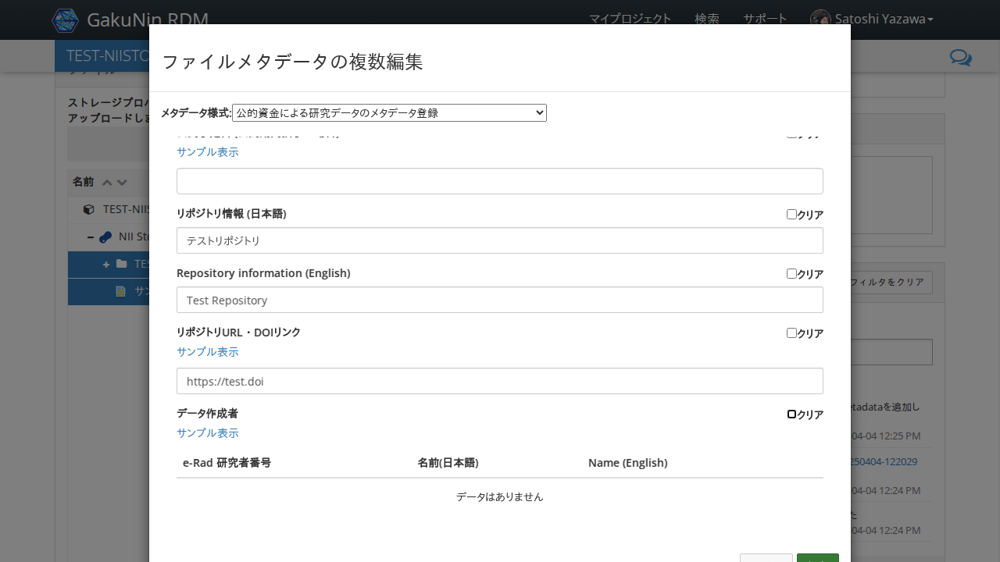

In [52]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('リポジトリURL・DOIリンク', 'https://test.doi')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('リポジトリURL・DOIリンク')).to_have_value('https://test.doi', timeout=transition_timeout)

await run_pw(_step)


##  「データ作成者」の「追加」をクリックする

作成者入力フィールドが表示されること

Start epoch: 1743769890.3858604 seconds


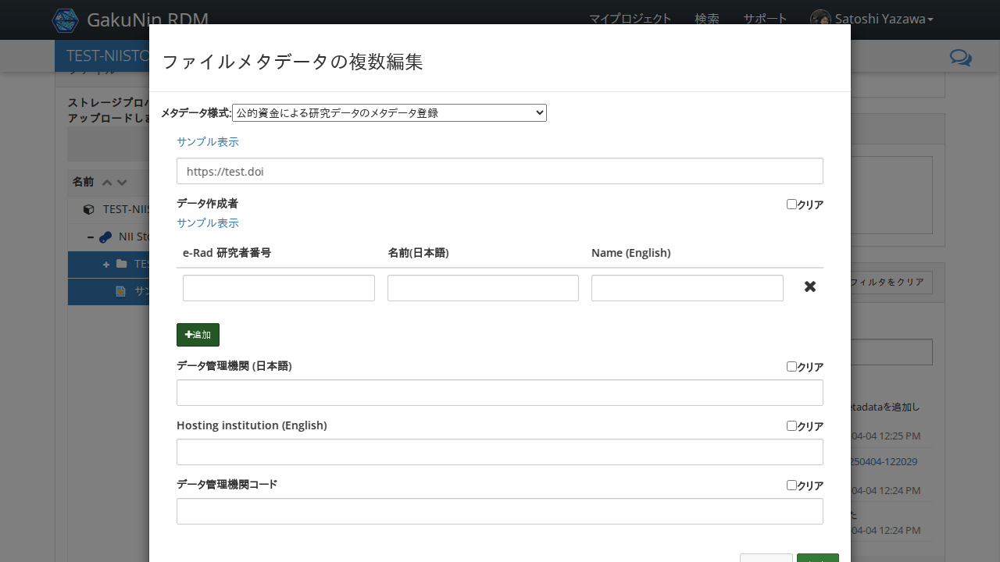

In [53]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill_author({
        'number': '0123456789',
        'name_ja': {'last': '情報', 'middle': '', 'first': '太郎'},
        'name_en': {'last': 'Joho', 'middle': '', 'first': 'Taro'},
        'affiliation_ja': '',
        'affiliation_en': '',
    }, table_label="データ作成者")

await run_pw(_step)


##  「e-Rad研究者番号」に「0123456789」を入力する

フィールドに値が表示されること

Start epoch: 1743769890.630342 seconds


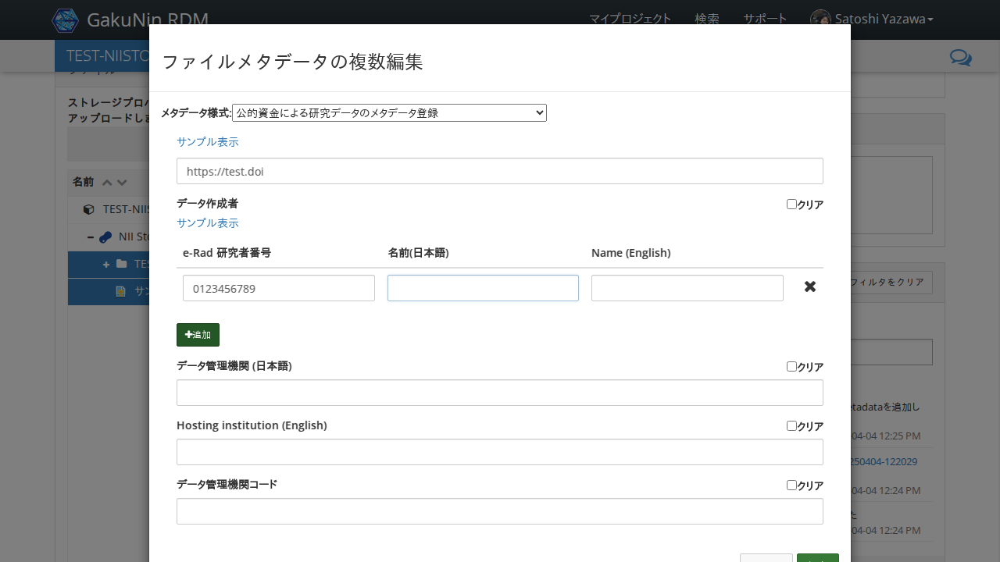

In [54]:
pass  # Handled by cell 67 (fill_author)


##  「名前　(日本語)」に「情報太郎」を入力する

フィールドに値が表示されること

Start epoch: 1743769890.8511808 seconds


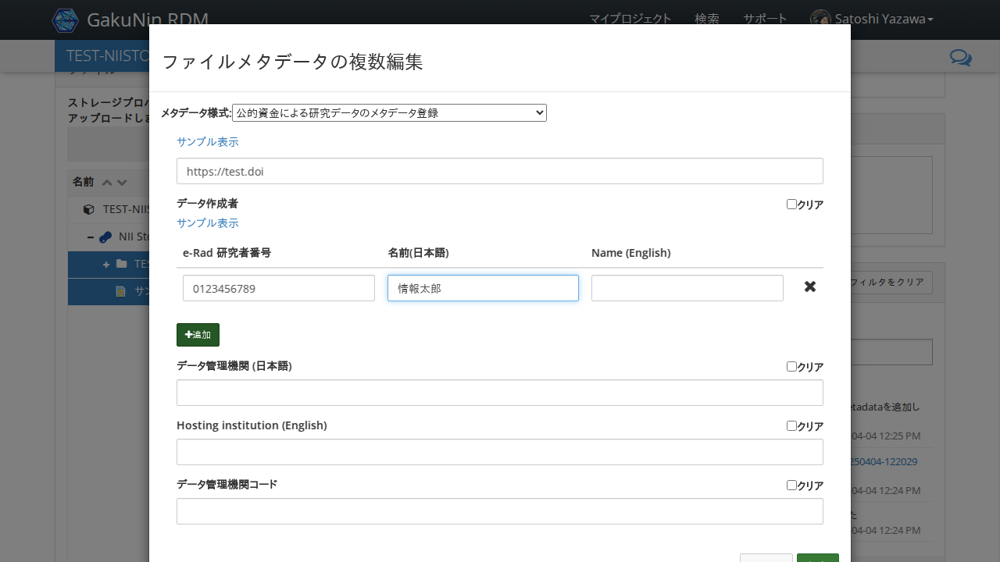

In [55]:
pass  # Handled by cell 67 (fill_author)


##  「名前　(英語)」に「Taro Joho」を入力する

フィールドに値が表示されること

Start epoch: 1743769891.051117 seconds


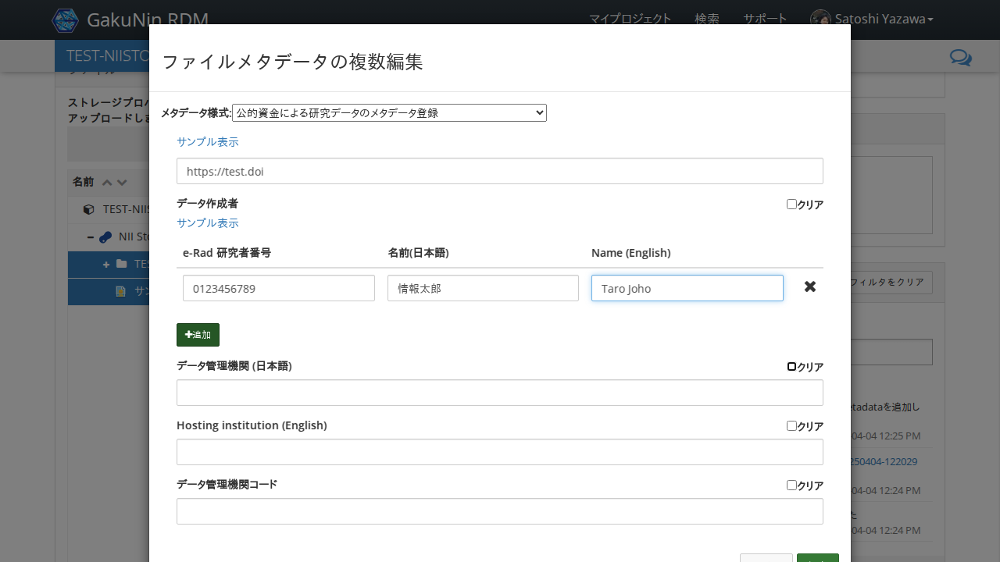

In [56]:
pass  # Handled by cell 67 (fill_author)


##  「データ管理機関 (日本語)」に「国立情報学研究所」を入力する

値が表示されること

Start epoch: 1743769891.2685592 seconds


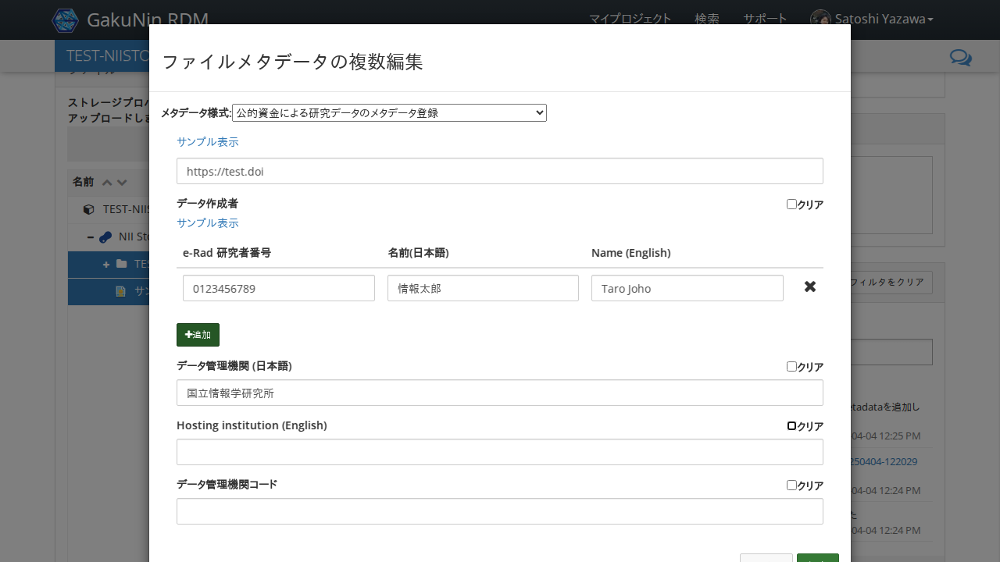

In [57]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データ管理機関 (日本語)', '国立情報学研究所')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('データ管理機関 (日本語)')).to_have_value('国立情報学研究所', timeout=transition_timeout)

await run_pw(_step)


##  「Hosting institution (English)」に「National Institute of Informatics」を入力する

値が表示されること

Start epoch: 1743769891.5073254 seconds


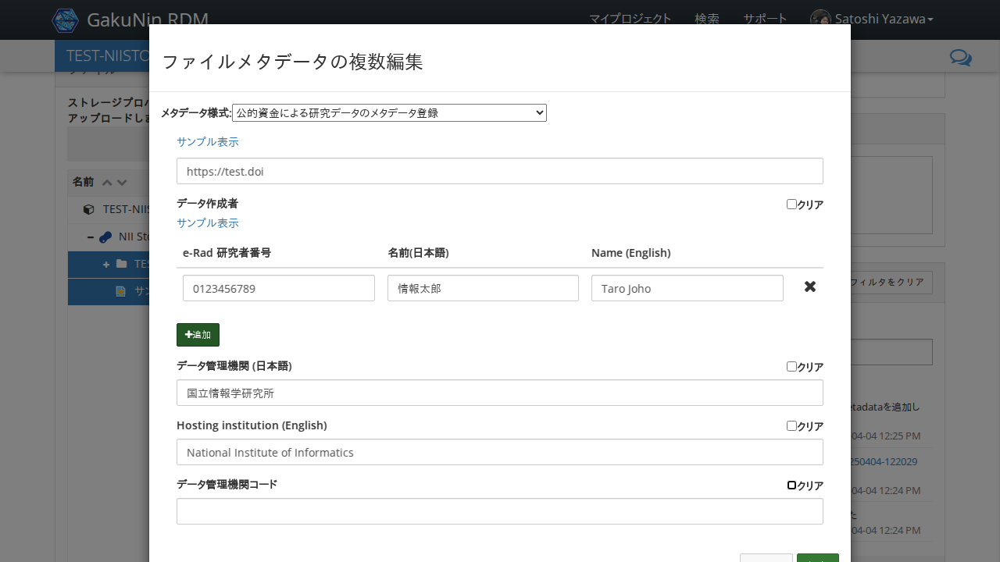

In [58]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('Hosting institution (English)', 'National Institute of Informatics')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('Hosting institution (English)')).to_have_value('National Institute of Informatics', timeout=transition_timeout)

await run_pw(_step)


## 「データ管理機関コード」に「 https://ror.org/DUMMY 」を入力する

値が表示されること

Start epoch: 1743769891.7271318 seconds


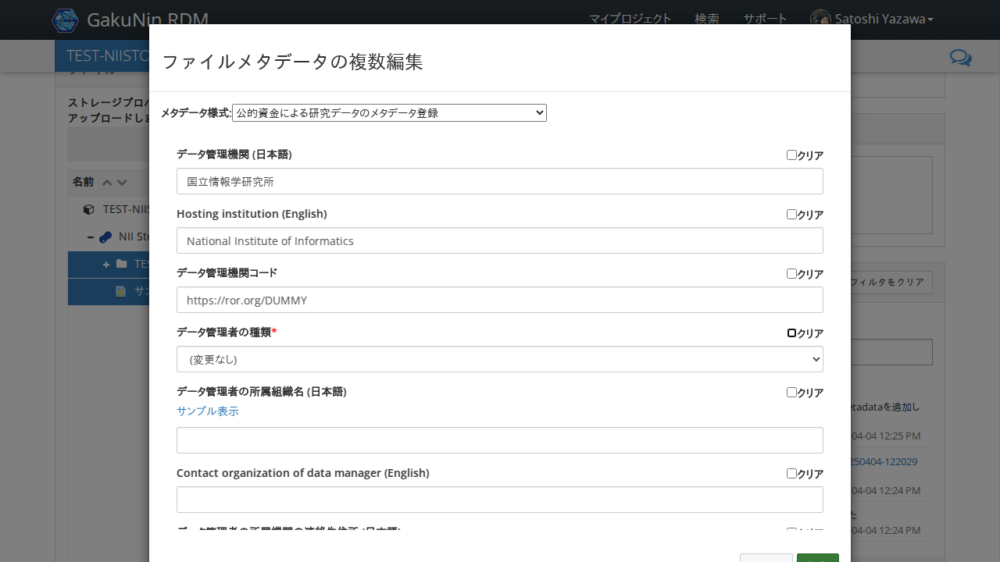

In [59]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データ管理機関コード', 'https://ror.org/DUMMY')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('データ管理機関コード')).to_have_value('https://ror.org/DUMMY', timeout=transition_timeout)

await run_pw(_step)


## 「データ管理者の種類」にて「個人」を選択する

値が表示されること

Start epoch: 1743769891.9497554 seconds


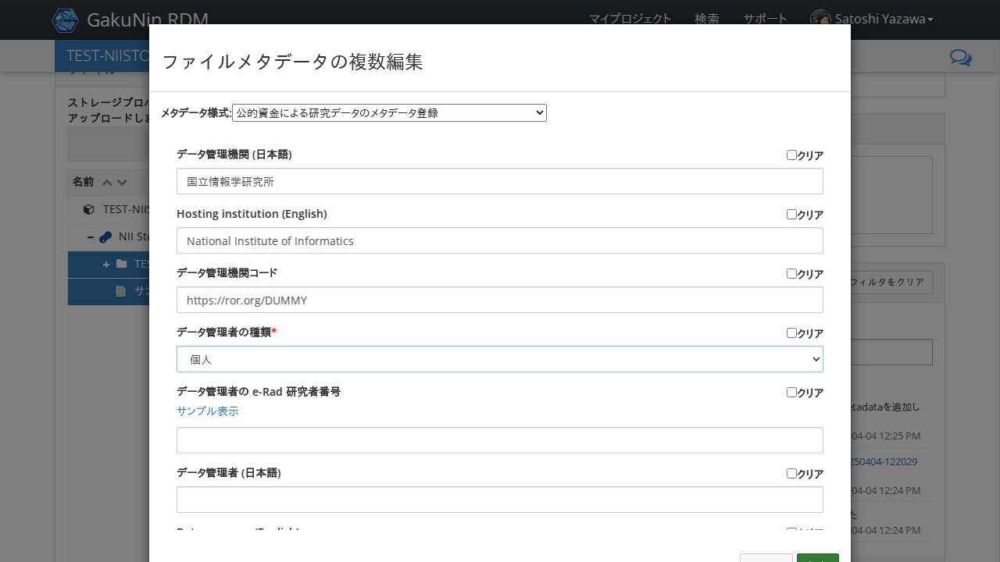

In [60]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データ管理者の種類', '個人')

    await expect(form.get_locator('データ管理者の種類').locator('input[type="radio"]:checked')).to_have_value('individual', timeout=transition_timeout)

await run_pw(_step)


##  「データ管理者の e-Rad 研究者番号」に「0123456789」を入力する

値が表示されること

Start epoch: 1743769892.191567 seconds


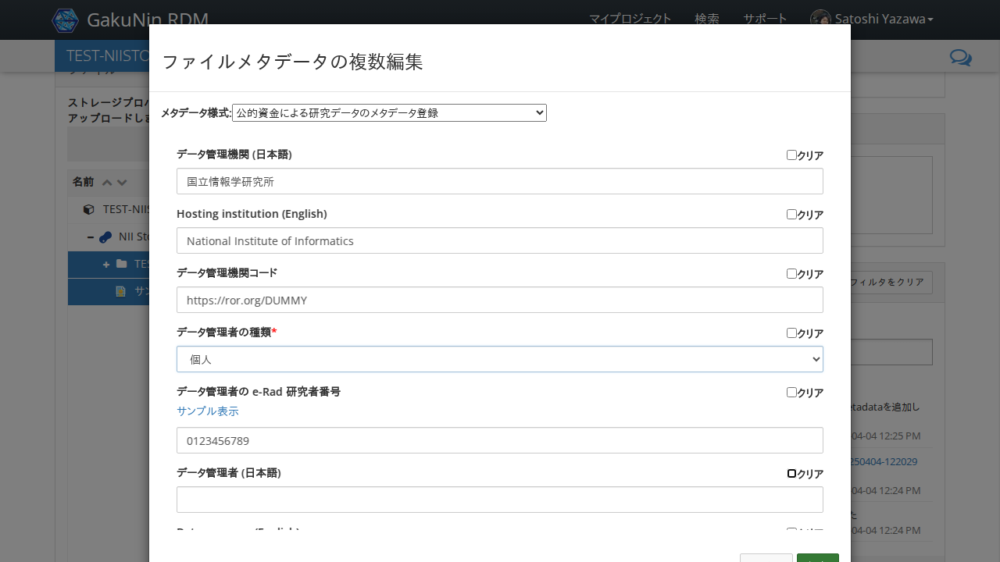

In [61]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データ管理者の e-Rad 研究者番号', '0123456789')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('データ管理者の e-Rad 研究者番号')).to_have_value('0123456789', timeout=transition_timeout)

await run_pw(_step)


##  「データ管理者 (日本語)」に「情報花子」を入力する

値が表示されること

Start epoch: 1743769892.4435325 seconds


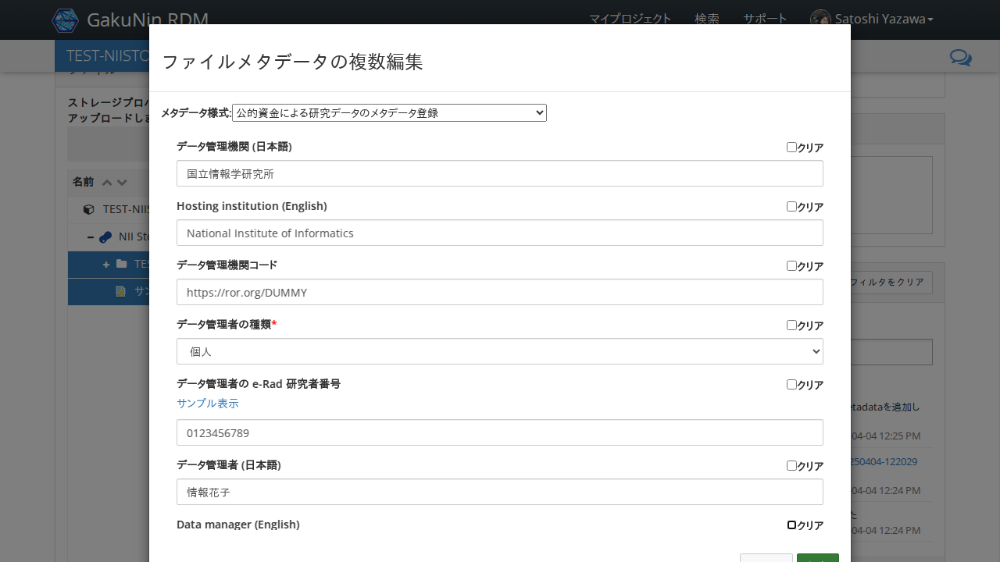

In [62]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill_name('データ管理者 (日本語)', {'last': '情報', 'middle': '', 'first': '花子'})

    name = await form.get_name('データ管理者 (日本語)')
    assert name == {'last': '情報', 'middle': '', 'first': '花子'}, f'Unexpected: {name}'

await run_pw(_step)


##  「Data manager (English)」に「Hanako Joho」を入力する

値が表示されること

Start epoch: 1743769892.6793692 seconds


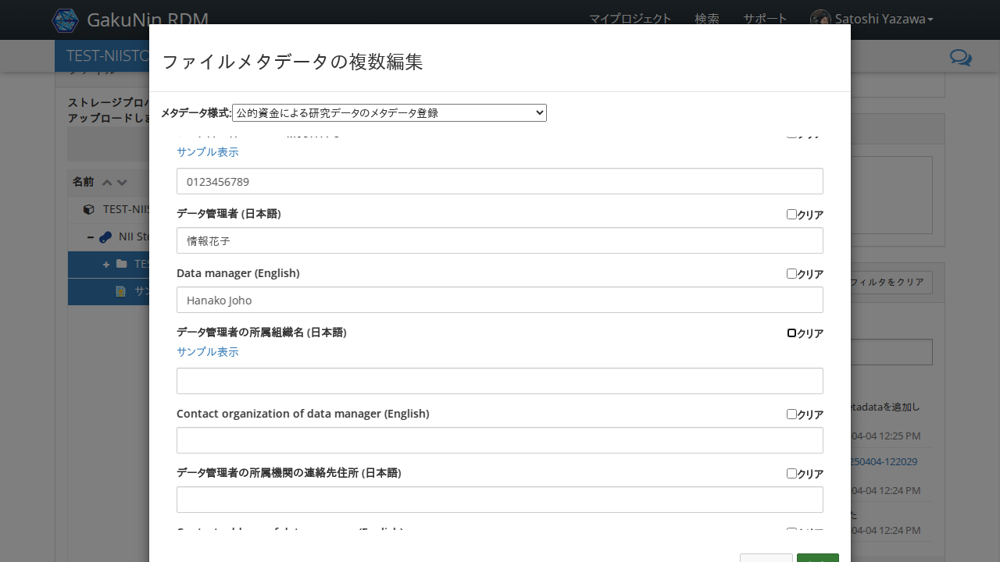

In [63]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill_name('Data manager (English)', {'last': 'Joho', 'middle': '', 'first': 'Hanako'})

    name = await form.get_name('Data manager (English)')
    assert name == {'last': 'Joho', 'middle': '', 'first': 'Hanako'}, f'Unexpected: {name}'

await run_pw(_step)


##  「データ管理者の所属組織名(日本語)」に「テストセンター」を入力する


値が表示されること

Start epoch: 1743769892.888553 seconds


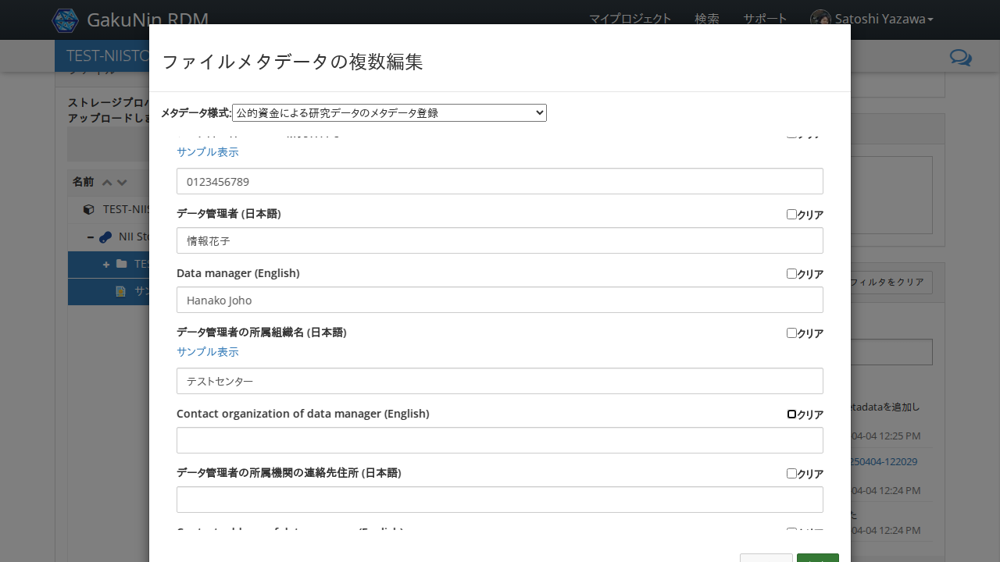

In [64]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データ管理者の所属組織名 (日本語)', 'テストセンター')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('データ管理者の所属組織名 (日本語)')).to_have_value('テストセンター', timeout=transition_timeout)

await run_pw(_step)


## 「Contact organization of data manager (English)」に「Test Center」を入力する

値が表示されること

Start epoch: 1743769893.1245186 seconds


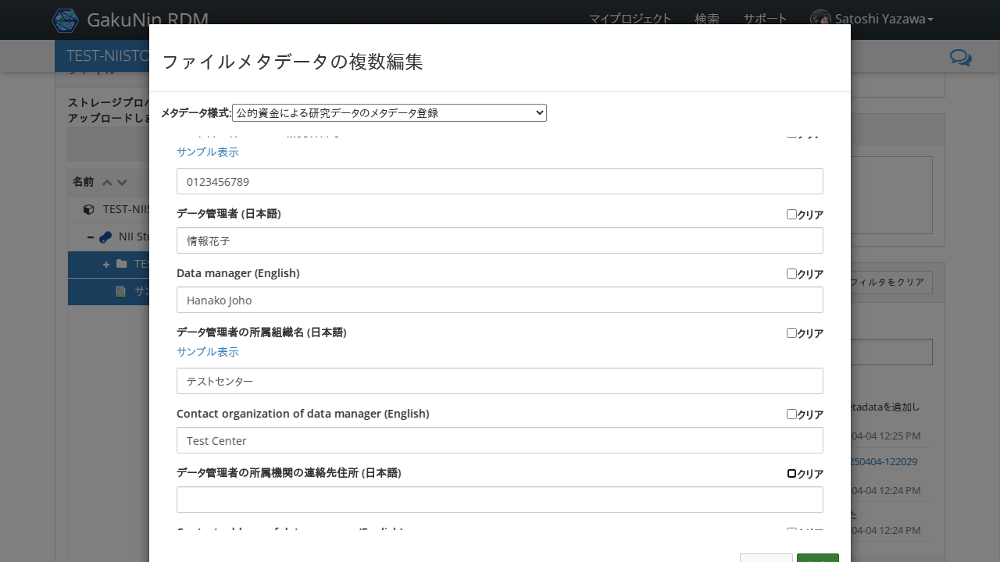

In [65]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('Contact organization of data manager (English)', 'Test Center')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('Contact organization of data manager (English)')).to_have_value('Test Center', timeout=transition_timeout)

await run_pw(_step)


##  「データ管理者の所属機関の連絡先住所 (日本語)」に「テスト住所」を入力する

値が表示されること

Start epoch: 1743769893.3589497 seconds


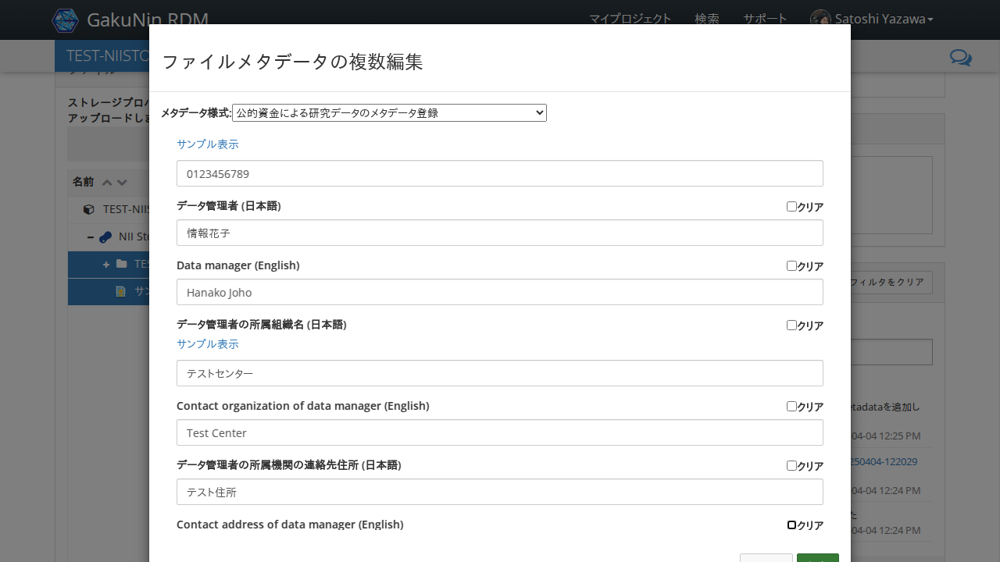

In [66]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データ管理者の所属機関の連絡先住所 (日本語)', 'テスト住所')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('データ管理者の所属機関の連絡先住所 (日本語)')).to_have_value('テスト住所', timeout=transition_timeout)

await run_pw(_step)


##  「Contact address of data manager (English)」に「Test Address」を入力する

値が表示されること

Start epoch: 1743769893.6210568 seconds


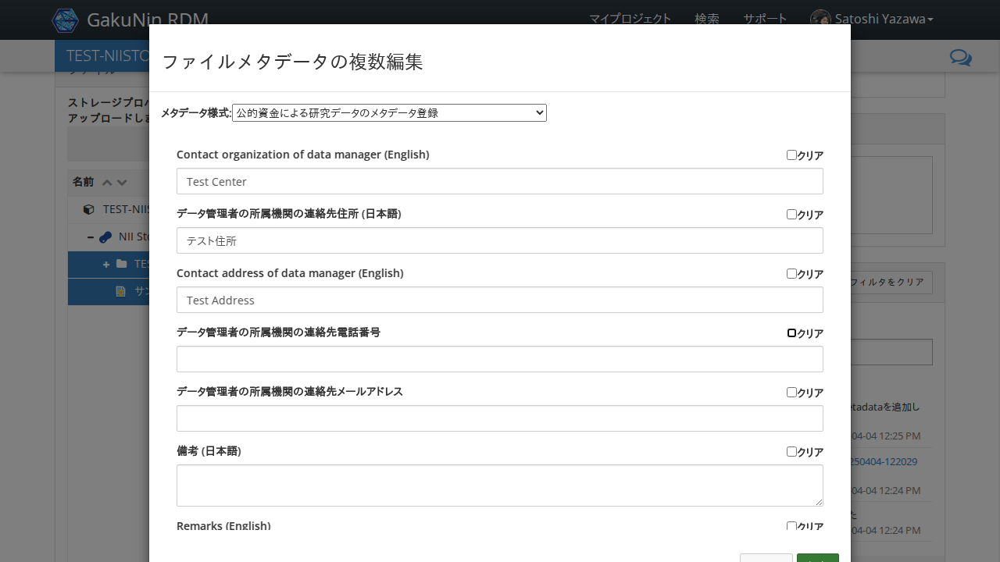

In [67]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('Contact address of data manager (English)', 'Test Address')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('Contact address of data manager (English)')).to_have_value('Test Address', timeout=transition_timeout)

await run_pw(_step)


##  「データ管理者の所属機関の連絡先電話番号」に「000-0000-0000」を入力する

値が表示されること

Start epoch: 1743769893.8635101 seconds


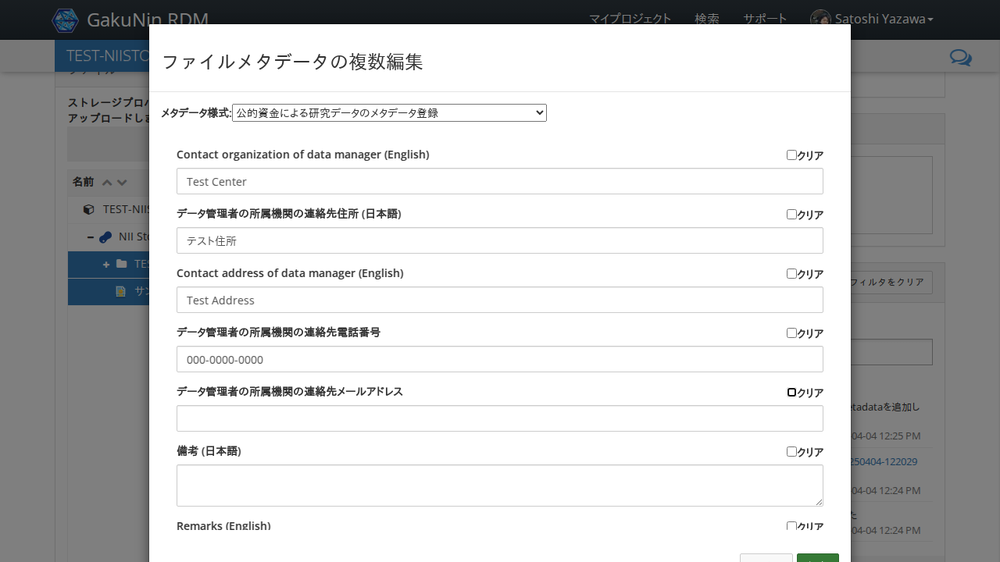

In [68]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データ管理者の所属機関の連絡先電話番号', '000-0000-0000')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('データ管理者の所属機関の連絡先電話番号')).to_have_value('000-0000-0000', timeout=transition_timeout)

await run_pw(_step)


##  「データ管理者の所属機関の連絡先メールアドレス」に「test@example.com」を入力する

値が表示されること

Start epoch: 1743769894.1089406 seconds


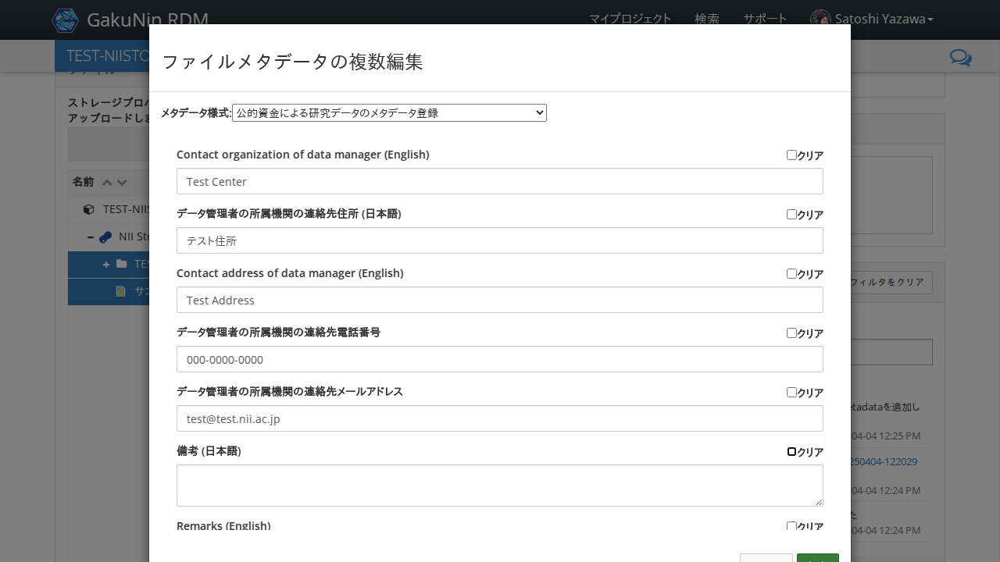

In [69]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('データ管理者の所属機関の連絡先メールアドレス', 'test@test.nii.ac.jp')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('データ管理者の所属機関の連絡先メールアドレス')).to_have_value('test@test.nii.ac.jp', timeout=transition_timeout)

await run_pw(_step)


##  「備考 (日本語)」に「日本語による備考です。」を入力する

値が表示されること

Start epoch: 1743769894.3115234 seconds


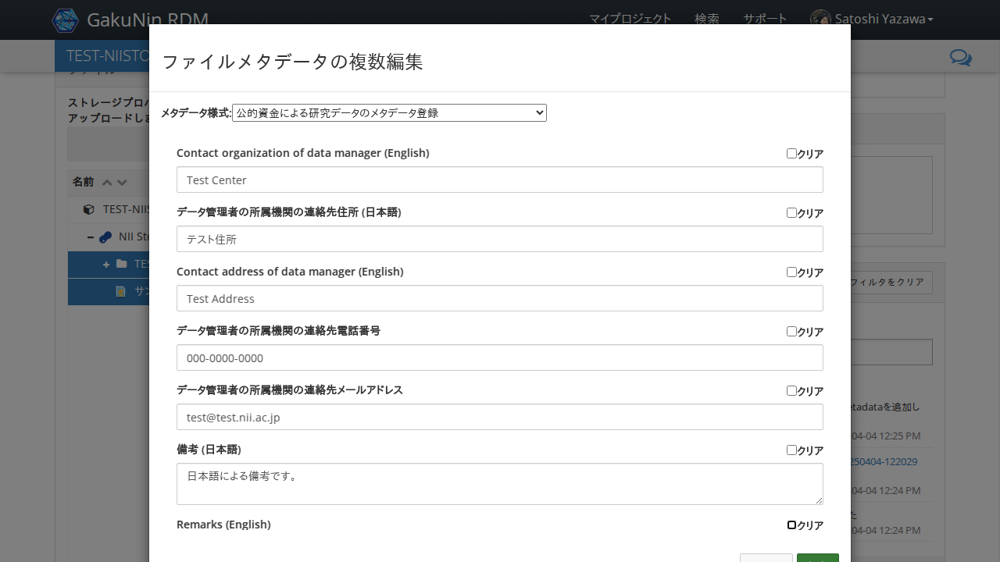

In [70]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('備考 (日本語)', '日本語による備考です。')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('備考 (日本語)')).to_have_value('日本語による備考です。', timeout=transition_timeout)

await run_pw(_step)


##  「Remarks (English)」に「Remarks in English.」を入力する

値が表示されること

Start epoch: 1743769894.5231092 seconds


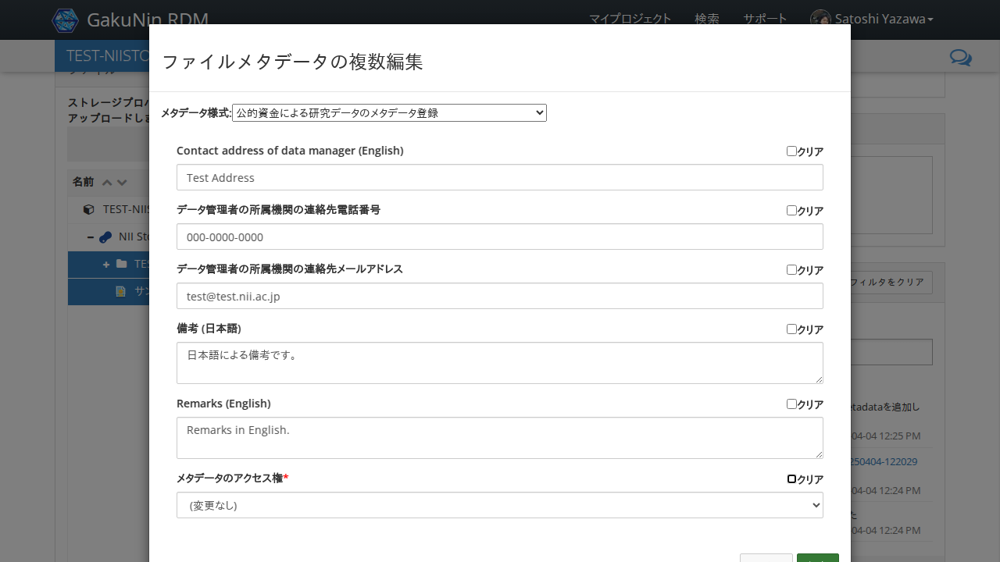

In [71]:
async def _step(page):
    form = FileMetadataForm(page)
    await form.fill('Remarks (English)', 'Remarks in English.')
    await page.keyboard.press('Tab')

    await expect(form.get_locator('Remarks (English)')).to_have_value('Remarks in English.', timeout=transition_timeout)

await run_pw(_step)


## 「保存」をクリックする

ダイアログが非表示になること

Start epoch: 1743769894.966085 seconds


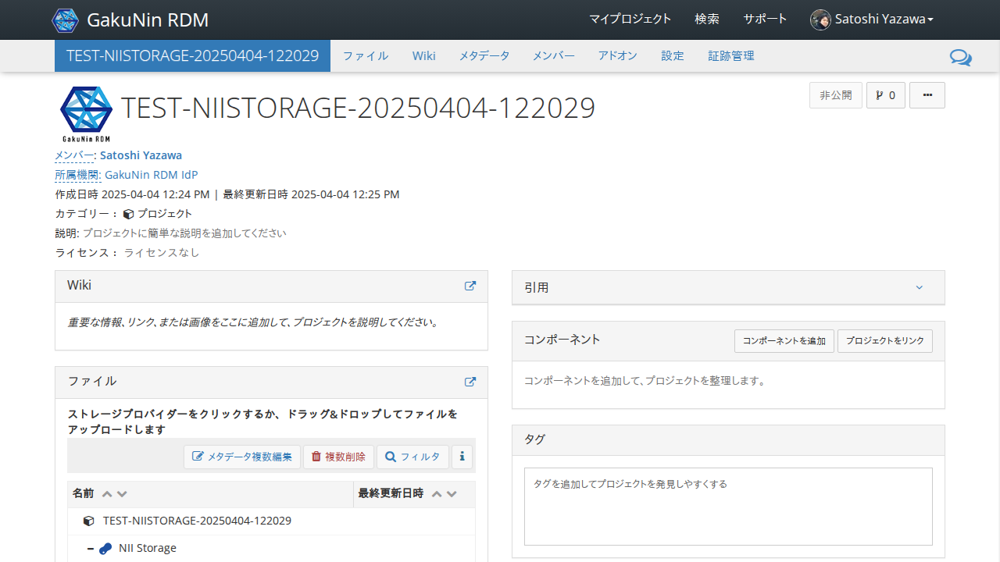

In [73]:
async def _step(page):
    await page.locator('//a[text() = "保存"]').click()
    form = FileMetadataForm(page)
    await expect(form.get_locator('Remarks (English)')).not_to_be_visible(timeout=transition_timeout)

await run_pw(_step)


## 「TESTMULTIPLE」をクリックする

「メタデータ編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769897.0683107 seconds


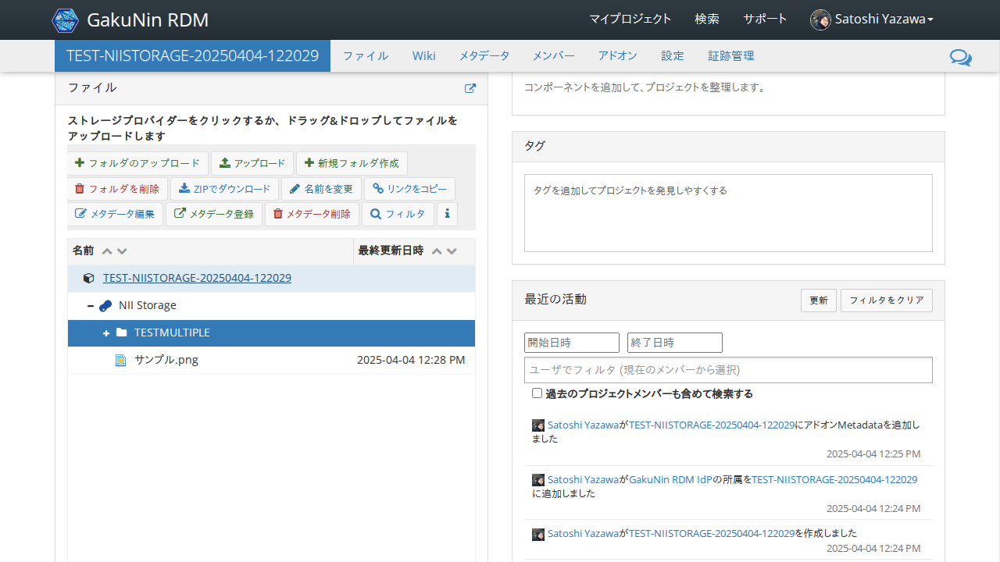

In [74]:
async def _step(page):
    await grdm.get_select_folder_title_locator(page, 'TESTMULTIPLE').click()
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

##  「メタデータ編集」をクリックする

「メタデータ編集」ダイアログが表示され、以下の内容が表示されること。

- データNo. : 0123456789
- データの名称 (日本語) : テストデータ
- Data title (English) : Test Data
- 掲載日・掲載更新日 : 2022-05-25
- データの説明 (日本語) : 自動テストによって作成されたメタデータです。
- Description (English) : Metadata created by automated testing.
- データの分野 : プロジェクトの研究分野
- データ種別 : データセット
- 概略データ量 : 1KB
- 管理対象データの利活用・提供方針 (有償/無償) : 無償
- 管理対象データの利活用・提供方針 (ライセンス) : CC BY 4.0 表示　国際
- 管理対象データの利活用・提供方針 (引用方法等・日本語) : 利用方針をここに記載します。
- Data utilization and provision policy (citation information, English) : The policy for use is described here.
- アクセス権 : 公開
- リポジトリ情報 (日本語) : テストリポジトリ
- Repository information (English) : Test Repository
- リポジトリURL・DOIリンク : https://test.doi
- データ作成者 : e-Rad研究者番号:0123456789, 名前 (日本語):情報太郎, Name (English):Taro Joho
- データ管理機関 (日本語) : 国立情報学研究所
- Hosting institution (English) : National Institute of Informatics
- データ管理機関コード: https://ror.org/DUMMY
- データ管理者の e-Rad 研究者番号 : 0123456789
- データ管理者 (日本語) : 情報花子
- Data manager (English) : Hanako Joho
- データ管理者の所属組織名(日本語): テストセンター
- Contact organization of data manager (English): Test Center
- データ管理者の所属機関の連絡先住所 (日本語) : テスト住所
- Contact address of data manager (English) : Test Address
- データ管理者の所属機関の連絡先電話番号 : 000-0000-0000
- データ管理者の所属機関の連絡先メールアドレス : test@example.com
- 備考 (日本語) : 日本語による備考です。
- Remarks (English) : Remarks in English.


In [ ]:
async def _step(page):
    await page.locator('//*[text() = "メタデータ編集"]').click()

    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "メタデータ様式")]/following-sibling::select[1]')).to_be_editable(timeout=transition_timeout)
    
    # 値のチェック
    expected_texts = [
     {'name': 'データ No.', 'value': '0123456789'},
     {'name': 'データの名称 (日本語)', 'value': 'テストデータ'},
     {'name': 'Data title (English)', 'value': 'Test Data'},
     {'name': '掲載日・掲載更新日', 'value': '2022-05-25'},
     {'name': 'データの説明 (日本語)', 'value': '自動テストによって作成されたメタデータです。'},
     {'name': 'Description (English)',
      'value': 'Metadata created by automated testing.'},
     {'name': 'データの分野', 'value': 'project'}, # プロジェクトの研究分野
     {'name': 'データ種別', 'value': 'dataset'}, # データセット
     {'name': '概略データ量', 'value': '1KB'},
     {'name': '管理対象データの利活用・提供方針 (有償/無償)', 'value': 'free'}, # 無償
     {'name': '管理対象データの利活用・提供方針 (ライセンス)', 'value': 'CCBY'}, # CC BY 4.0 表示\u3000国際
     {'name': '管理対象データの利活用・提供方針 (引用方法等・日本語)', 'value': '利用方針をここに記載します。'},
     {'name': 'Data utilization and provision policy (citation information, English)',
      'value': 'The policy for use is described here.'},
     {'name': 'アクセス権', 'value': 'open access'}, # 公開
     {'name': 'リポジトリ情報 (日本語)', 'value': 'テストリポジトリ'},
     {'name': 'Repository information (English)', 'value': 'Test Repository'},
     {'name': 'リポジトリURL・DOIリンク', 'value': 'https://test.doi'},
     {'name': 'データ作成者',
      'value': {
          'number': '0123456789',
          'name_ja': {'last': '情報', 'middle': '', 'first': '太郎'},
          'name_en': {'last': 'Joho', 'middle': '', 'first': 'Taro'},
          'affiliation_ja': '',
          'affiliation_en': '',
      }},
     {'name': 'データ管理機関 (日本語)', 'value': '国立情報学研究所'},
     {'name': 'Hosting institution (English)',
      'value': 'National Institute of Informatics'},
     {'name': 'データ管理機関コード', 'value': 'https://ror.org/DUMMY'},
     {'name': 'データ管理者の e-Rad 研究者番号', 'value': '0123456789'},
     {'name': 'データ管理者 (日本語)', 'value': {'last': '情報', 'middle': '', 'first': '花子'}},
     {'name': 'Data manager (English)', 'value': {'last': 'Joho', 'middle': '', 'first': 'Hanako'}},
     {'name': 'データ管理者の所属組織名 (日本語)', 'value': 'テストセンター'},
     {'name': 'Contact organization of data manager (English)', 'value': 'Test Center'},
     {'name': 'データ管理者の所属機関の連絡先住所 (日本語)', 'value': 'テスト住所'},
     {'name': 'Contact address of data manager (English)',
      'value': 'Test Address'},
     {'name': 'データ管理者の所属機関の連絡先電話番号', 'value': '000-0000-0000'},
     {'name': 'データ管理者の所属機関の連絡先メールアドレス', 'value': 'test@test.nii.ac.jp'},
     {'name': '備考 (日本語)', 'value': '日本語による備考です。'},
     {'name': 'Remarks (English)', 'value': 'Remarks in English.'}]
    dialog = page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    for t in expected_texts:
        name = t['name']
        value = t['value']
        print(name)
        await form.scroll_to(name)
        if isinstance(value, dict) and 'last' in value:
            actual = await form.get_name(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict) and 'number' in value:
            actual = await form.get_author(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict):
            for key in value.keys():
                cell_value = await form.get_table_cell(name, key[0], key[1])
                assert cell_value == value[key], f'{name} {key}: expected {value[key]!r}, got {cell_value!r}'
            continue
        actual = await form.get(name)
        assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
    time.sleep(1)
    
await run_pw(_step)

## 「閉じる」をクリックする

ダイアログが非表示になること

Start epoch: 1743769899.3871384 seconds


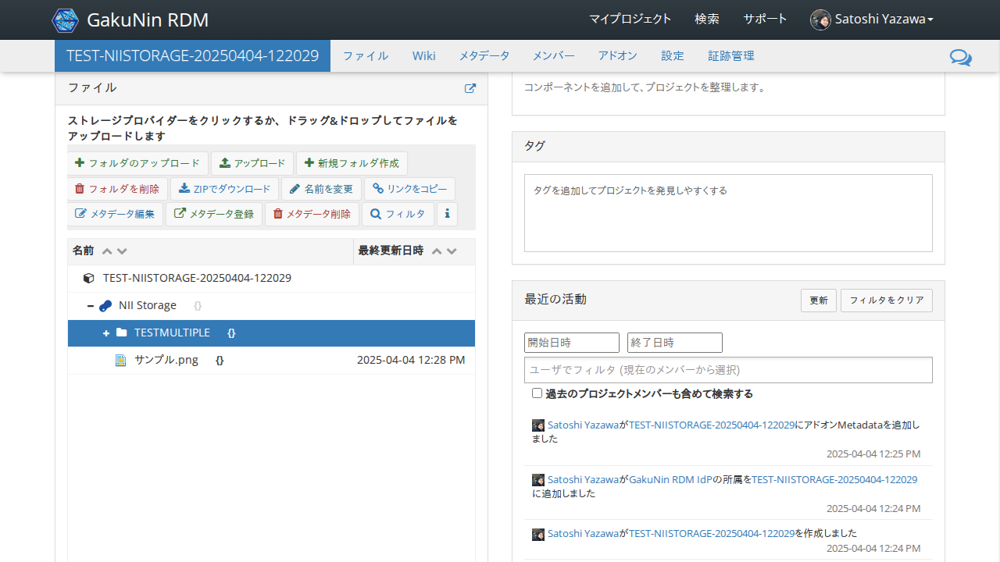

In [76]:
async def _step(page):
    await page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//a[text() = "閉じる"]').click()
    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "Remarks (English)")]/../following-sibling::textarea[1]')).not_to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## 「サンプル.png」のアイコンをクリックする

「メタデータ編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769899.9838793 seconds


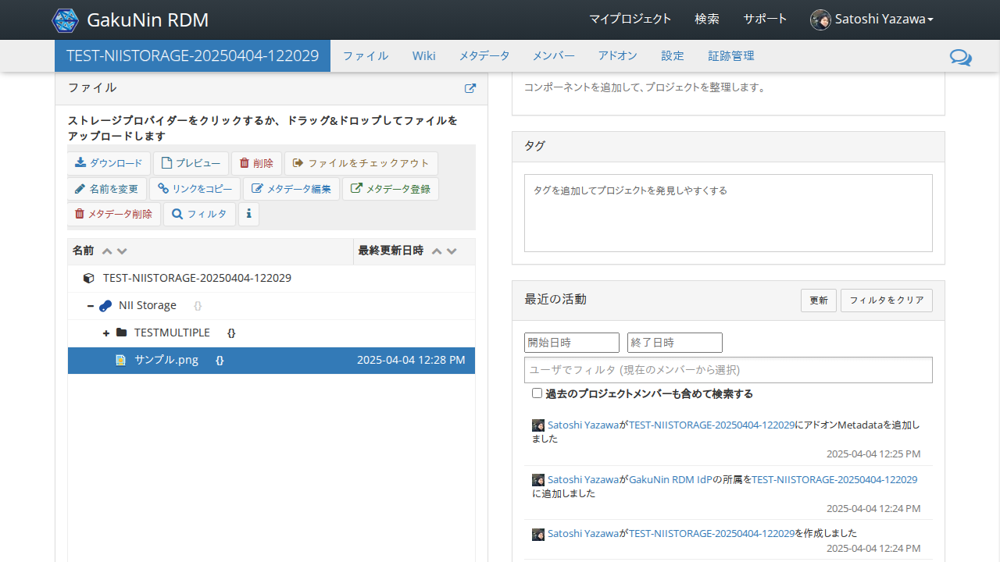

In [77]:
async def _step(page):
    await grdm.get_select_file_extension_locator(page, 'サンプル.png').click()
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

##  「メタデータ編集」をクリックする

「メタデータ編集」ダイアログが表示され、以下の内容が表示されること。

- データNo. : 0123456789
- データの名称 (日本語) : テストデータ
- Data title (English) : Test Data
- 掲載日・掲載更新日 : 2022-05-25
- データの説明 (日本語) : 自動テストによって作成されたメタデータです。
- Description (English) : Metadata created by automated testing.
- データの分野 : プロジェクトの研究分野
- データ種別 : データセット
- 概略データ量 : 1KB
- 管理対象データの利活用・提供方針 (有償/無償) : 無償
- 管理対象データの利活用・提供方針 (ライセンス) : CC BY 4.0 表示　国際
- 管理対象データの利活用・提供方針 (引用方法等・日本語) : 利用方針をここに記載します。
- Data utilization and provision policy (citation information, English) : The policy for use is described here.
- アクセス権 : 公開
- リポジトリ情報 (日本語) : テストリポジトリ
- Repository information (English) : Test Repository
- リポジトリURL・DOIリンク : https://test.doi
- データ作成者 : e-Rad研究者番号:0123456789, 名前 (日本語):情報太郎, Name (English):Taro Joho
- データ管理機関 (日本語) : 国立情報学研究所
- Hosting institution (English) : National Institute of Informatics
- データ管理機関コード: https://ror.org/DUMMY
- データ管理者の e-Rad 研究者番号 : 0123456789
- データ管理者 (日本語) : 情報花子
- Data manager (English) : Hanako Joho
- データ管理者の所属組織名(日本語): テストセンター
- Contact organization of data manager (English): Test Center
- データ管理者の所属機関の連絡先住所 (日本語) : テスト住所
- Contact address of data manager (English) : Test Address
- データ管理者の所属機関の連絡先電話番号 : 000-0000-0000
- データ管理者の所属機関の連絡先メールアドレス : test@example.com
- 備考 (日本語) : 日本語による備考です。
- Remarks (English) : Remarks in English.


In [ ]:
# edit_metadata_button.click()

# find_element_by_xpath_with_retry(driver, '//label[contains(text(), "データ No.")]/../following-sibling::div//input')

# time.sleep(5)

# # 値のチェック
# expected_texts = [{'name': 'データ No.', 'value': '0123456789'},
#  {'name': 'データの名称 (日本語)', 'value': 'テストデータ'},
#  {'name': 'Data title (English)', 'value': 'Test Data'},
#  {'name': '掲載日・掲載更新日', 'value': '2022-05-25'},
#  {'name': 'データの説明 (日本語)', 'value': '自動テストによって作成されたメタデータです。'},
#  {'name': 'Description (English)',
#   'value': 'Metadata created by automated testing.'},
#  {'name': 'データの分野', 'value': ''}, # プロジェクトの研究分野
#  {'name': 'データ種別', 'value': ''}, # データセット
#  {'name': '概略データ量', 'value': '1KB'},
#  {'name': '管理対象データの利活用・提供方針 (有償/無償)', 'value': 'free'}, # 無償
#  {'name': '管理対象データの利活用・提供方針 (ライセンス)', 'value': 'CCBY'}, # CC BY 4.0 表示\u3000国際
#  {'name': '管理対象データの利活用・提供方針 (引用方法等・日本語)', 'value': '利用方針をここに記載します。'},
#  {'name': 'Data utilization and provision policy (citation information, English)',
#   'value': 'The policy for use is described here.'},
#  {'name': 'アクセス権', 'value': 'open access'}, # 公開
#  {'name': 'リポジトリ情報 (日本語)', 'value': 'テストリポジトリ'},
#  {'name': 'Repository information (English)', 'value': 'Test Repository'},
#  {'name': 'リポジトリURL・DOIリンク', 'value': 'https://test.doi'},
#  {'name': 'データ作成者',
#   'value': {
#       (0, 0): '0123456789',
#       (0, 1): '情報太郎',
#       (0, 2): 'Taro Joho',
#   }},
#  {'name': 'データ管理機関 (日本語)', 'value': '国立情報学研究所'},
#  {'name': 'Hosting institution (English)',
#   'value': 'National Institute of Informatics'},
#  {'name': 'データ管理機関コード', 'value': 'https://ror.org/DUMMY'},
#  {'name': 'データ管理者の e-Rad 研究者番号', 'value': '0123456789'},
#  {'name': 'データ管理者 (日本語)', 'value': {'last': '情報', 'middle': '', 'first': '花子'}},
#  {'name': 'Data manager (English)', 'value': {'last': 'Joho', 'middle': '', 'first': 'Hanako'}},
#  {'name': 'データ管理者の所属組織名 (日本語)', 'value': 'テストセンター'},
#  {'name': 'Contact organization of data manager (English)', 'value': 'Test Center'},
#  {'name': 'データ管理者の所属機関の連絡先住所 (日本語)', 'value': 'テスト住所'},
#  {'name': 'Contact address of data manager (English)',
#   'value': 'Test Address'},
#  {'name': 'データ管理者の所属機関の連絡先電話番号', 'value': '000-0000-0000'},
#  {'name': 'データ管理者の所属機関の連絡先メールアドレス', 'value': 'test@test.nii.ac.jp'},
#  {'name': '備考 (日本語)', 'value': '日本語による備考です。'},
#  {'name': 'Remarks (English)', 'value': 'Remarks in English.'}]
# for t in expected_texts:
#     name = t['name']
#     value = t['value']
#     print(name)
#     element = find_element_by_xpath_with_retry(driver, f'//label[contains(text(), "{name}")]/../..')
#     if isinstance(value, dict):
#         for key in value.keys():
#             table = ''
#             top = key[0]
#             for i, index in enumerate(key[1:]):
#                 tr_index = (top if i == 0 else 0) + 1
#                 td_index = index + 1
#                 table += f'//tbody/tr[{tr_index}]/td[{td_index}]'
#             input_element = element.find_element(By.XPATH, f'.{table}//input')
#             assert input_element.get_attribute('value') == value[key]
#         continue
#     try:
#         input_element = element.find_element(By.XPATH, f'.//input[contains(@class, "form-control")]')
#         assert input_element.get_attribute('value') == value
#     except NoSuchElementException as e:
#         try:
#             textarea_element = element.find_element(By.XPATH, f'.//textarea[contains(@class, "form-control")]')
#             assert textarea_element.get_attribute('value') == value, (textarea_element.get_attribute('value'), value)
#         except NoSuchElementException as e:
#             try:
#                 select_element = element.find_element(By.XPATH, f'.//select[contains(@class, "form-control")]')
#                 assert select_element.get_attribute('value') == value, (select_element.get_attribute('value'), value)
#             except NoSuchElementException as e:
#                 print('No such element')

async def _step(page):
    await page.locator('//*[text() = "メタデータ編集"]').click()

    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "メタデータ様式")]/following-sibling::select[1]')).to_be_editable(timeout=transition_timeout)
    
    # 値のチェック
    expected_texts = [
     {'name': 'データ No.', 'value': '0123456789'},
     {'name': 'データの名称 (日本語)', 'value': 'テストデータ'},
     {'name': 'Data title (English)', 'value': 'Test Data'},
     {'name': '掲載日・掲載更新日', 'value': '2022-05-25'},
     {'name': 'データの説明 (日本語)', 'value': '自動テストによって作成されたメタデータです。'},
     {'name': 'Description (English)',
      'value': 'Metadata created by automated testing.'},
     {'name': 'データの分野', 'value': 'project'}, # プロジェクトの研究分野
     {'name': 'データ種別', 'value': 'dataset'}, # データセット
     {'name': '概略データ量', 'value': '1KB'},
     {'name': '管理対象データの利活用・提供方針 (有償/無償)', 'value': 'free'}, # 無償
     {'name': '管理対象データの利活用・提供方針 (ライセンス)', 'value': 'CCBY'}, # CC BY 4.0 表示\u3000国際
     {'name': '管理対象データの利活用・提供方針 (引用方法等・日本語)', 'value': '利用方針をここに記載します。'},
     {'name': 'Data utilization and provision policy (citation information, English)',
      'value': 'The policy for use is described here.'},
     {'name': 'アクセス権', 'value': 'open access'}, # 公開
     {'name': 'リポジトリ情報 (日本語)', 'value': 'テストリポジトリ'},
     {'name': 'Repository information (English)', 'value': 'Test Repository'},
     {'name': 'リポジトリURL・DOIリンク', 'value': 'https://test.doi'},
     {'name': 'データ作成者',
      'value': {
          'number': '0123456789',
          'name_ja': {'last': '情報', 'middle': '', 'first': '太郎'},
          'name_en': {'last': 'Joho', 'middle': '', 'first': 'Taro'},
          'affiliation_ja': '',
          'affiliation_en': '',
      }},
     {'name': 'データ管理機関 (日本語)', 'value': '国立情報学研究所'},
     {'name': 'Hosting institution (English)',
      'value': 'National Institute of Informatics'},
     {'name': 'データ管理機関コード', 'value': 'https://ror.org/DUMMY'},
     {'name': 'データ管理者の e-Rad 研究者番号', 'value': '0123456789'},
     {'name': 'データ管理者 (日本語)', 'value': {'last': '情報', 'middle': '', 'first': '花子'}},
     {'name': 'Data manager (English)', 'value': {'last': 'Joho', 'middle': '', 'first': 'Hanako'}},
     {'name': 'データ管理者の所属組織名 (日本語)', 'value': 'テストセンター'},
     {'name': 'Contact organization of data manager (English)', 'value': 'Test Center'},
     {'name': 'データ管理者の所属機関の連絡先住所 (日本語)', 'value': 'テスト住所'},
     {'name': 'Contact address of data manager (English)',
      'value': 'Test Address'},
     {'name': 'データ管理者の所属機関の連絡先電話番号', 'value': '000-0000-0000'},
     {'name': 'データ管理者の所属機関の連絡先メールアドレス', 'value': 'test@test.nii.ac.jp'},
     {'name': '備考 (日本語)', 'value': '日本語による備考です。'},
     {'name': 'Remarks (English)', 'value': 'Remarks in English.'}]
    dialog = page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    for t in expected_texts:
        name = t['name']
        value = t['value']
        print(name)
        await form.scroll_to(name)
        if isinstance(value, dict) and 'last' in value:
            actual = await form.get_name(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict) and 'number' in value:
            actual = await form.get_author(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict):
            for key in value.keys():
                cell_value = await form.get_table_cell(name, key[0], key[1])
                assert cell_value == value[key], f'{name} {key}: expected {value[key]!r}, got {cell_value!r}'
            continue
        actual = await form.get(name)
        assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
    time.sleep(1)
    
await run_pw(_step)

##  「データ No.」に「0123456789_r1(ENTER)」を入力する

値が表示されること

Start epoch: 1743769902.3451843 seconds


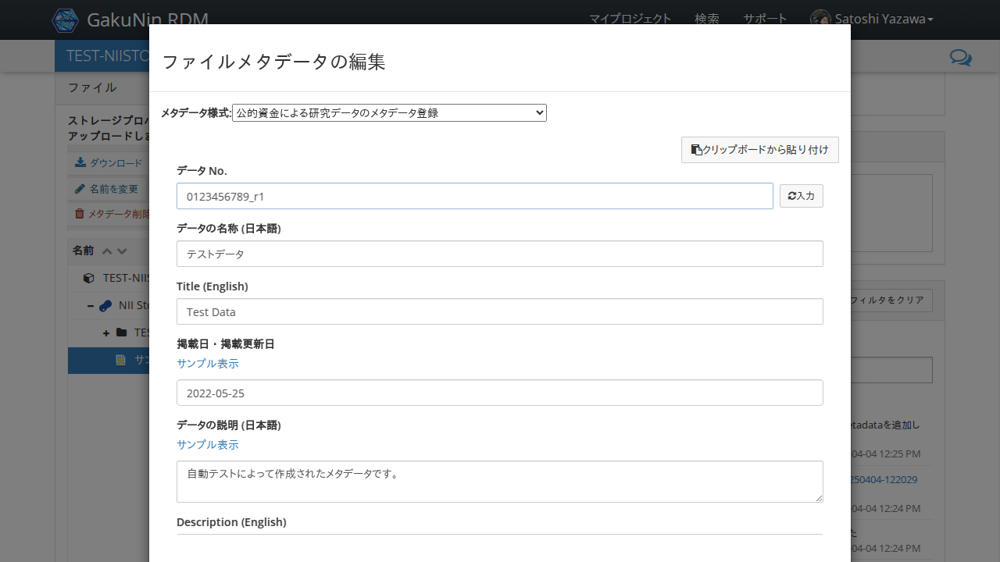

In [79]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    await form.fill('データ No.', '0123456789_r1')
    await page.keyboard.press('Enter')

    await expect(form.get_locator('データ No.')).to_have_value('0123456789_r1', timeout=transition_timeout)

await run_pw(_step)


##  「データの名称(日本語)」に「テストデータ Rev.1」を入力する

値が表示されること

Start epoch: 1743769902.5686457 seconds


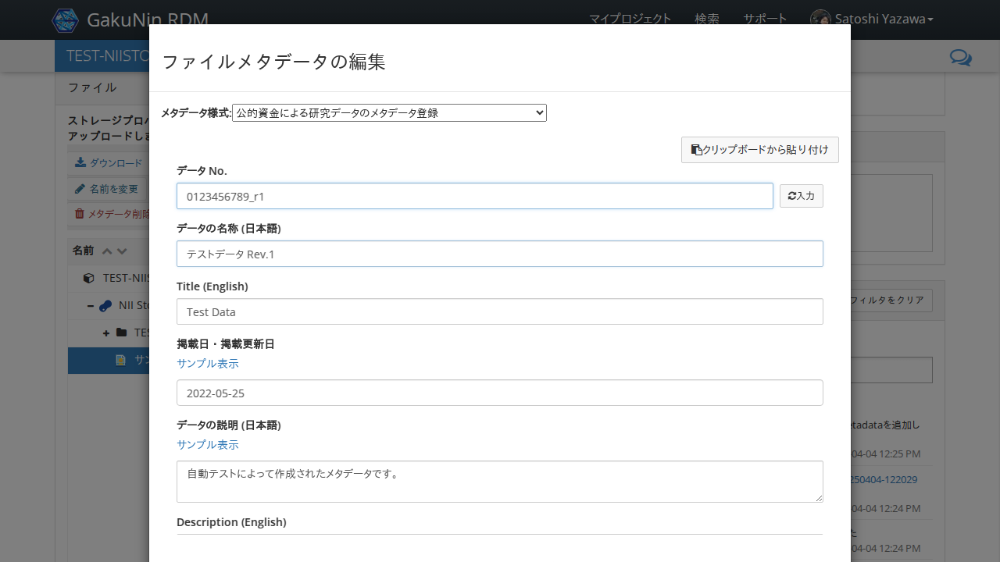

In [80]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    await form.fill('データの名称 (日本語)', 'テストデータ Rev.1')
    await page.keyboard.press('Enter')

    await expect(form.get_locator('データの名称 (日本語)')).to_have_value('テストデータ Rev.1', timeout=transition_timeout)

await run_pw(_step)


##  「Data title (English)」に「Test Data Rev.1」を入力する

値が表示されること

Start epoch: 1743769902.7932267 seconds


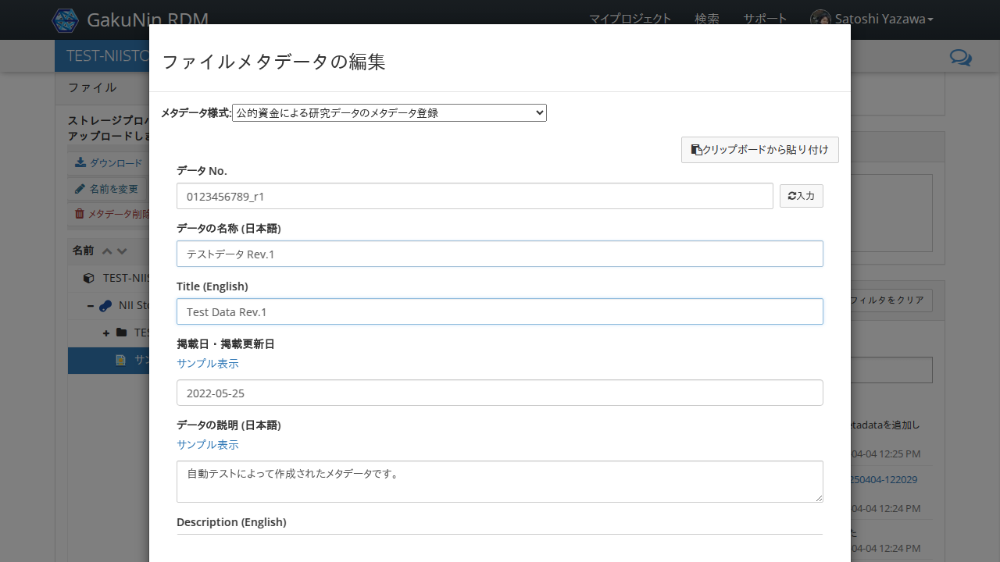

In [81]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    await form.fill('Data title (English)', 'Test Data Rev.1')
    await page.keyboard.press('Enter')

    await expect(form.get_locator('Data title (English)')).to_have_value('Test Data Rev.1', timeout=transition_timeout)

await run_pw(_step)


## 「保存」をクリックする

ダイアログが非表示になること

Start epoch: 1743769903.0172217 seconds


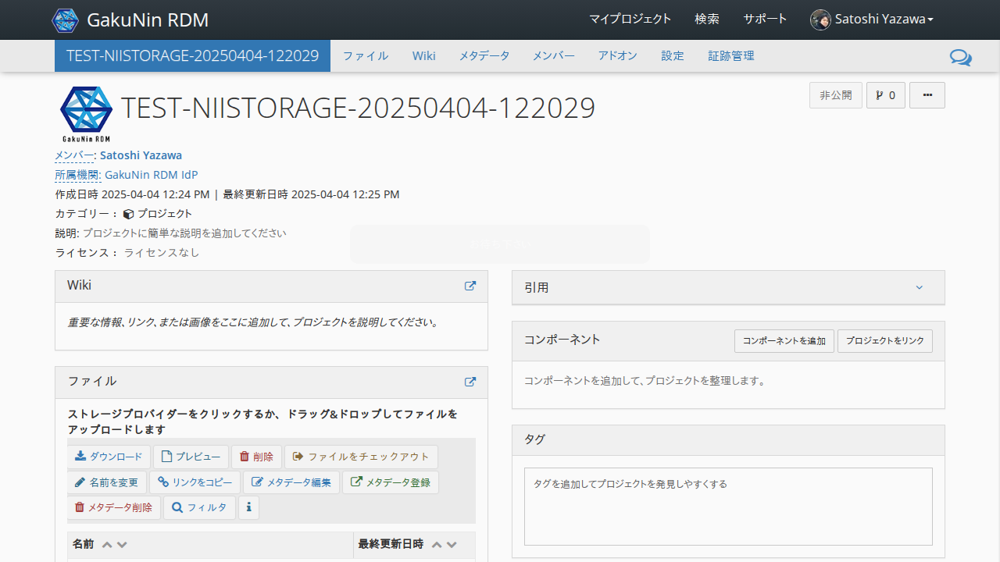

In [82]:
async def _step(page):
    await page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//a[text() = "保存"]').click()
    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "Remarks (English)")]/../following-sibling::textarea[1]')).not_to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## Shiftキーを押しながら「TESTMULTIPLE」をクリックする

「サンプル.png」と「TESTMULTIPLE」の両方が選択状態になり、「メタデータ複数編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769904.1635063 seconds


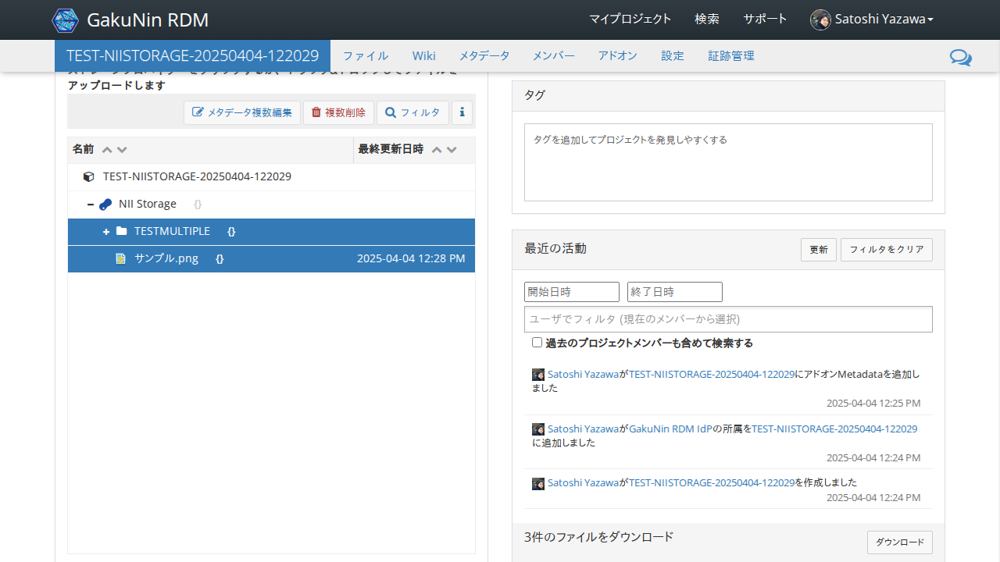

In [83]:
async def _step(page):
    await grdm.get_select_folder_title_locator(page, 'TESTMULTIPLE').click(modifiers=['Shift'])
    await expect(page.locator('//*[text() = "メタデータ複数編集"]')).to_be_enabled(timeout=transition_timeout)
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_have_count(0, timeout=transition_timeout)

await run_pw(_step)

##  「メタデータ複数編集」をクリックする

「ファイルメタデータの複数編集」ダイアログが表示されること

Start epoch: 1743769904.3909557 seconds


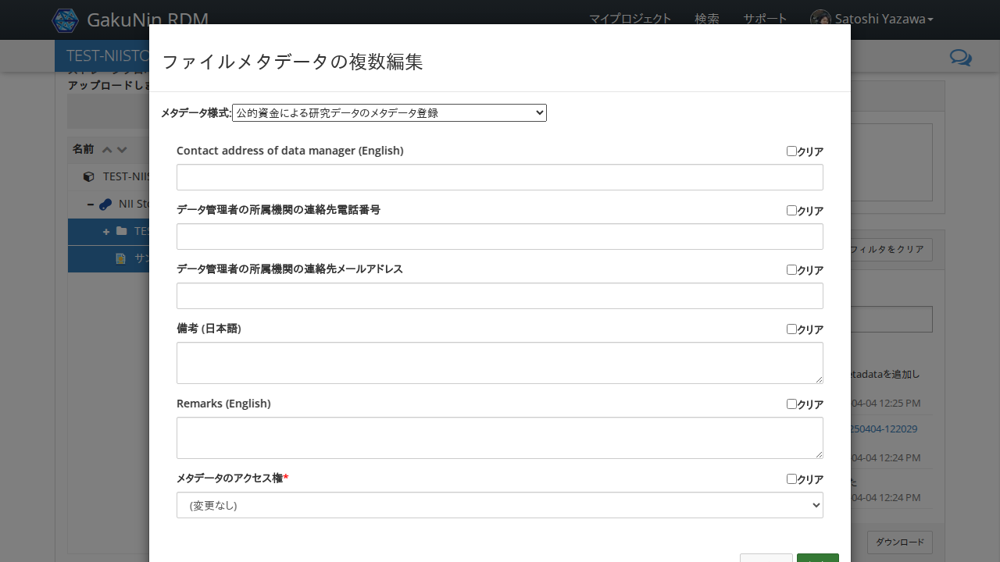

In [84]:
async def _step(page):
    await page.locator('//*[text() = "メタデータ複数編集"]').click()

    await expect(page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..//label[contains(text(), "メタデータ様式")]/following-sibling::select')).to_be_editable(timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## 「保存」をクリックする

ダイアログが非表示になること

Start epoch: 1743769905.6609383 seconds


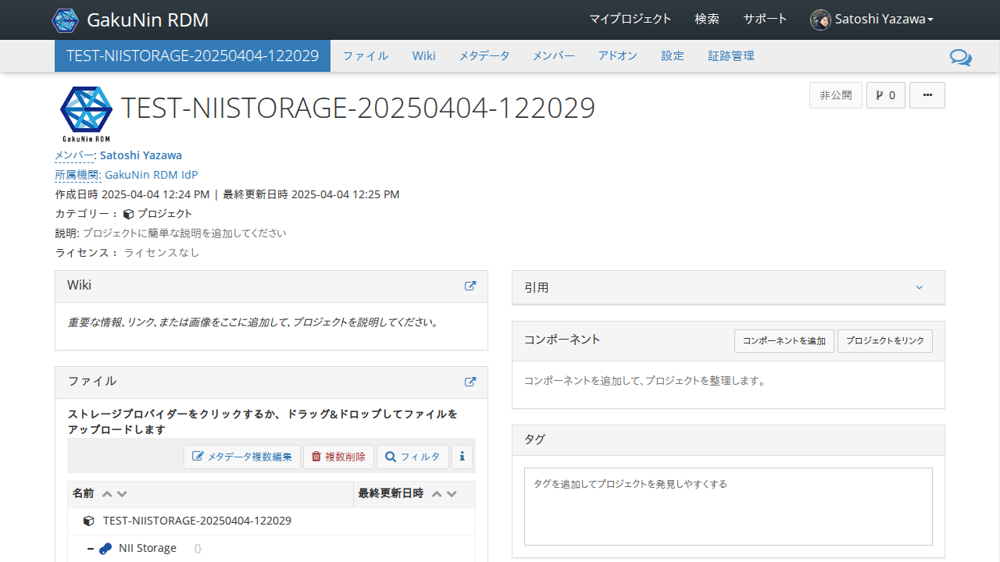

In [85]:
async def _step(page):
    await page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..//a[text() = "保存"]').click()
    await expect(page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..//label[contains(text(), "Remarks (English)")]/../following-sibling::textarea[1]')).not_to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## 「TESTMULTIPLE」をクリックする

「メタデータ編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769907.7878041 seconds


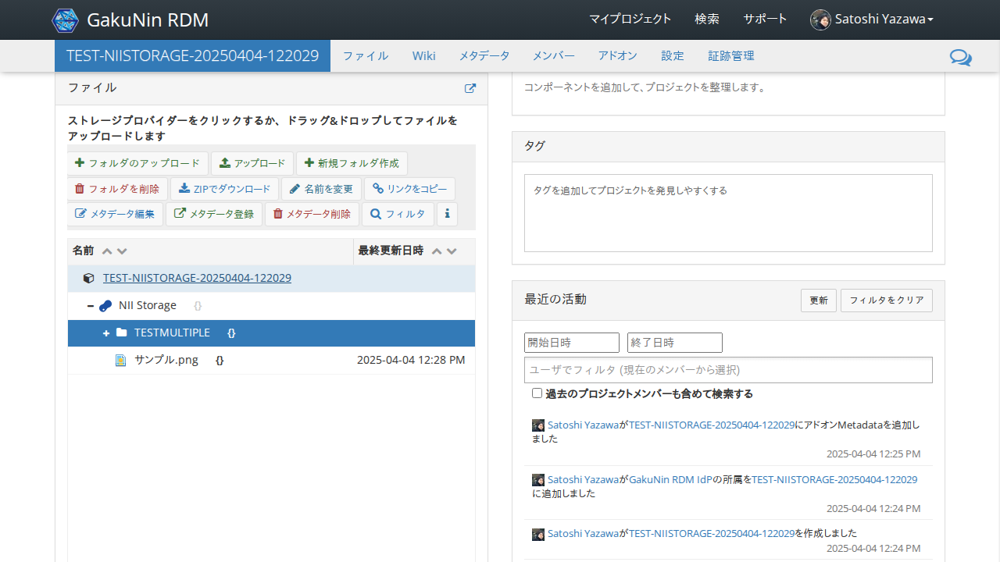

In [86]:
async def _step(page):
    await grdm.get_select_folder_title_locator(page, 'TESTMULTIPLE').click()
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

##  「メタデータ編集」をクリックする

「メタデータ編集」ダイアログが表示され、以下の内容が表示されること。

- データNo. : 0123456789
- データの名称 (日本語) : テストデータ
- Data title (English) : Test Data
- 掲載日・掲載更新日 : 2022-05-25
- データの説明 (日本語) : 自動テストによって作成されたメタデータです。
- Description (English) : Metadata created by automated testing.
- データの分野 : プロジェクトの研究分野
- データ種別 : データセット
- 概略データ量 : 1KB
- 管理対象データの利活用・提供方針 (有償/無償) : 無償
- 管理対象データの利活用・提供方針 (ライセンス) : CC BY 4.0 表示　国際
- 管理対象データの利活用・提供方針 (引用方法等・日本語) : 利用方針をここに記載します。
- Data utilization and provision policy (citation information, English) : The policy for use is described here.
- アクセス権 : 公開
- リポジトリ情報 (日本語) : テストリポジトリ
- Repository information (English) : Test Repository
- リポジトリURL・DOIリンク : https://test.doi
- データ作成者 : e-Rad研究者番号:0123456789, 名前 (日本語):情報太郎, Name (English):Taro Joho
- データ管理機関 (日本語) : 国立情報学研究所
- Hosting institution (English) : National Institute of Informatics
- データ管理機関コード: https://ror.org/DUMMY
- データ管理者の e-Rad 研究者番号 : 0123456789
- データ管理者 (日本語) : 情報花子
- Data manager (English) : Hanako Joho
- データ管理者の所属組織名(日本語): テストセンター
- Contact organization of data manager (English): Test Center
- データ管理者の所属機関の連絡先住所 (日本語) : テスト住所
- Contact address of data manager (English) : Test Address
- データ管理者の所属機関の連絡先電話番号 : 000-0000-0000
- データ管理者の所属機関の連絡先メールアドレス : test@example.com
- 備考 (日本語) : 日本語による備考です。
- Remarks (English) : Remarks in English.


In [ ]:
# edit_metadata_button.click()

# find_element_by_xpath_with_retry(driver, '//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "データ No.")]/../following-sibling::div//input')

# time.sleep(5)

# # 値のチェック
# expected_texts = [{'name': 'データ No.', 'value': '0123456789'},
#  {'name': 'データの名称 (日本語)', 'value': 'テストデータ'},
#  {'name': 'Data title (English)', 'value': 'Test Data'},
#  {'name': '掲載日・掲載更新日', 'value': '2022-05-25'},
#  {'name': 'データの説明 (日本語)', 'value': '自動テストによって作成されたメタデータです。'},
#  {'name': 'Description (English)',
#   'value': 'Metadata created by automated testing.'},
#  {'name': 'データの分野', 'value': 'project'}, # プロジェクトの研究分野
#  {'name': 'データ種別', 'value': 'dataset'}, # データセット
#  {'name': '概略データ量', 'value': '1KB'},
#  {'name': '管理対象データの利活用・提供方針 (有償/無償)', 'value': 'free'}, # 無償
#  {'name': '管理対象データの利活用・提供方針 (ライセンス)', 'value': 'CCBY'}, # CC BY 4.0 表示\u3000国際
#  {'name': '管理対象データの利活用・提供方針 (引用方法等・日本語)', 'value': '利用方針をここに記載します。'},
#  {'name': 'Data utilization and provision policy (citation information, English)',
#   'value': 'The policy for use is described here.'},
#  {'name': 'アクセス権', 'value': 'open access'}, # 公開
#  {'name': 'リポジトリ情報 (日本語)', 'value': 'テストリポジトリ'},
#  {'name': 'Repository information (English)', 'value': 'Test Repository'},
#  {'name': 'リポジトリURL・DOIリンク', 'value': 'https://test.doi'},
#  {'name': 'データ作成者',
#   'value': {
#       (0, 0): '0123456789',
#       (0, 1): '情報太郎',
#       (0, 2): 'Taro Joho',
#   }},
#  {'name': 'データ管理機関 (日本語)', 'value': '国立情報学研究所'},
#  {'name': 'Hosting institution (English)',
#   'value': 'National Institute of Informatics'},
#  {'name': 'データ管理機関コード', 'value': 'https://ror.org/DUMMY'},
#  {'name': 'データ管理者の e-Rad 研究者番号', 'value': '0123456789'},
#  {'name': 'データ管理者 (日本語)', 'value': {'last': '情報', 'middle': '', 'first': '花子'}},
#  {'name': 'Data manager (English)', 'value': {'last': 'Joho', 'middle': '', 'first': 'Hanako'}},
#  {'name': 'データ管理者の所属組織名 (日本語)', 'value': 'テストセンター'},
#  {'name': 'Contact organization of data manager (English)', 'value': 'Test Center'},
#  {'name': 'データ管理者の所属機関の連絡先住所 (日本語)', 'value': 'テスト住所'},
#  {'name': 'Contact address of data manager (English)',
#   'value': 'Test Address'},
#  {'name': 'データ管理者の所属機関の連絡先電話番号', 'value': '000-0000-0000'},
#  {'name': 'データ管理者の所属機関の連絡先メールアドレス', 'value': 'test@test.nii.ac.jp'},
#  {'name': '備考 (日本語)', 'value': '日本語による備考です。'},
#  {'name': 'Remarks (English)', 'value': 'Remarks in English.'}]

async def _step(page):
    await page.locator('//*[text() = "メタデータ編集"]').click()

    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "メタデータ様式")]/following-sibling::select[1]')).to_be_editable(timeout=transition_timeout)
    
    # 値のチェック
    expected_texts = [
     {'name': 'データ No.', 'value': '0123456789'},
     {'name': 'データの名称 (日本語)', 'value': 'テストデータ'},
     {'name': 'Data title (English)', 'value': 'Test Data'},
     {'name': '掲載日・掲載更新日', 'value': '2022-05-25'},
     {'name': 'データの説明 (日本語)', 'value': '自動テストによって作成されたメタデータです。'},
     {'name': 'Description (English)',
      'value': 'Metadata created by automated testing.'},
     {'name': 'データの分野', 'value': 'project'}, # プロジェクトの研究分野
     {'name': 'データ種別', 'value': 'dataset'}, # データセット
     {'name': '概略データ量', 'value': '1KB'},
     {'name': '管理対象データの利活用・提供方針 (有償/無償)', 'value': 'free'}, # 無償
     {'name': '管理対象データの利活用・提供方針 (ライセンス)', 'value': 'CCBY'}, # CC BY 4.0 表示\u3000国際
     {'name': '管理対象データの利活用・提供方針 (引用方法等・日本語)', 'value': '利用方針をここに記載します。'},
     {'name': 'Data utilization and provision policy (citation information, English)',
      'value': 'The policy for use is described here.'},
     {'name': 'アクセス権', 'value': 'open access'}, # 公開
     {'name': 'リポジトリ情報 (日本語)', 'value': 'テストリポジトリ'},
     {'name': 'Repository information (English)', 'value': 'Test Repository'},
     {'name': 'リポジトリURL・DOIリンク', 'value': 'https://test.doi'},
     {'name': 'データ作成者',
      'value': {
          'number': '0123456789',
          'name_ja': {'last': '情報', 'middle': '', 'first': '太郎'},
          'name_en': {'last': 'Joho', 'middle': '', 'first': 'Taro'},
          'affiliation_ja': '',
          'affiliation_en': '',
      }},
     {'name': 'データ管理機関 (日本語)', 'value': '国立情報学研究所'},
     {'name': 'Hosting institution (English)',
      'value': 'National Institute of Informatics'},
     {'name': 'データ管理機関コード', 'value': 'https://ror.org/DUMMY'},
     {'name': 'データ管理者の e-Rad 研究者番号', 'value': '0123456789'},
     {'name': 'データ管理者 (日本語)', 'value': {'last': '情報', 'middle': '', 'first': '花子'}},
     {'name': 'Data manager (English)', 'value': {'last': 'Joho', 'middle': '', 'first': 'Hanako'}},
     {'name': 'データ管理者の所属組織名 (日本語)', 'value': 'テストセンター'},
     {'name': 'Contact organization of data manager (English)', 'value': 'Test Center'},
     {'name': 'データ管理者の所属機関の連絡先住所 (日本語)', 'value': 'テスト住所'},
     {'name': 'Contact address of data manager (English)',
      'value': 'Test Address'},
     {'name': 'データ管理者の所属機関の連絡先電話番号', 'value': '000-0000-0000'},
     {'name': 'データ管理者の所属機関の連絡先メールアドレス', 'value': 'test@test.nii.ac.jp'},
     {'name': '備考 (日本語)', 'value': '日本語による備考です。'},
     {'name': 'Remarks (English)', 'value': 'Remarks in English.'}]
    dialog = page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    for t in expected_texts:
        name = t['name']
        value = t['value']
        print(name)
        await form.scroll_to(name)
        if isinstance(value, dict) and 'last' in value:
            actual = await form.get_name(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict) and 'number' in value:
            actual = await form.get_author(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict):
            for key in value.keys():
                cell_value = await form.get_table_cell(name, key[0], key[1])
                assert cell_value == value[key], f'{name} {key}: expected {value[key]!r}, got {cell_value!r}'
            continue
        actual = await form.get(name)
        assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
    time.sleep(1)
    
await run_pw(_step)

## 「閉じる」をクリックする

ダイアログが非表示になること

Start epoch: 1743769910.135663 seconds


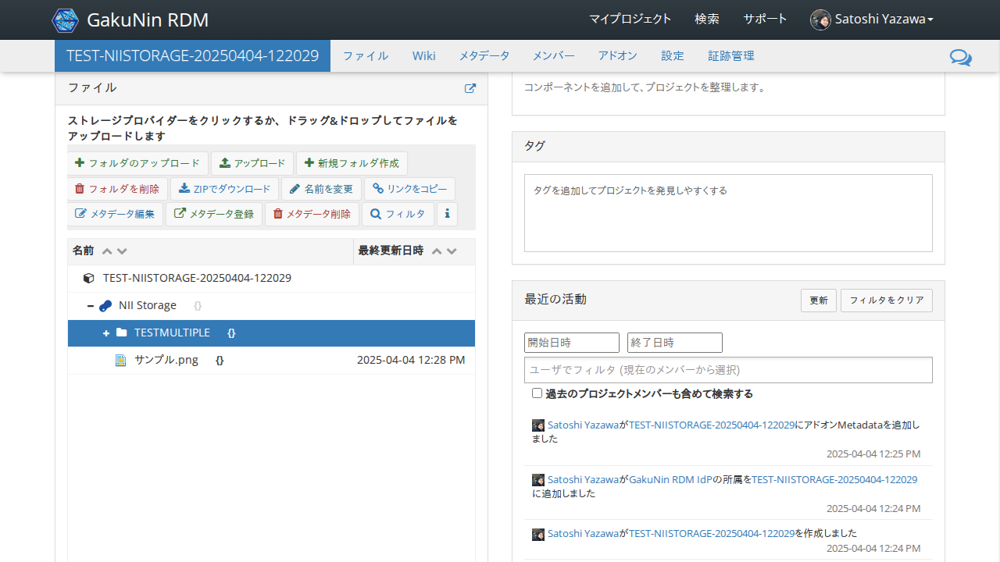

In [88]:
async def _step(page):
    await page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//a[text() = "閉じる"]').click()
    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "Remarks (English)")]/../following-sibling::textarea[1]')).not_to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## 「サンプル.png」のアイコンをクリックする

「メタデータ編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769910.73583 seconds


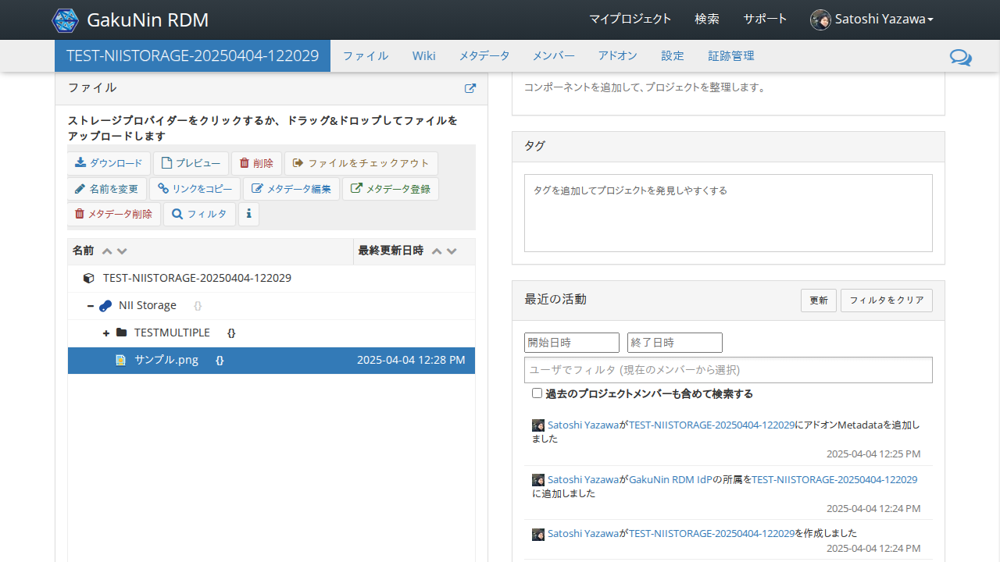

In [89]:
async def _step(page):
    await grdm.get_select_file_extension_locator(page, 'サンプル.png').click()
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

##  「メタデータ編集」をクリックする

「メタデータ編集」ダイアログが表示され、以下の内容が表示されること。

- データNo. : 0123456789_r1
- データの名称 (日本語) : テストデータ Rev.1
- Data title (English) : Test Data Rev.1
- 掲載日・掲載更新日 : 2022-05-25
- データの説明 (日本語) : 自動テストによって作成されたメタデータです。
- Description (English) : Metadata created by automated testing.
- データの分野 : プロジェクトの研究分野
- データ種別 : データセット
- 概略データ量 : 1KB
- 管理対象データの利活用・提供方針 (有償/無償) : 無償
- 管理対象データの利活用・提供方針 (ライセンス) : CC BY 4.0 表示　国際
- 管理対象データの利活用・提供方針 (引用方法等・日本語) : 利用方針をここに記載します。
- Data utilization and provision policy (citation information, English) : The policy for use is described here.
- アクセス権 : 公開
- リポジトリ情報 (日本語) : テストリポジトリ
- Repository information (English) : Test Repository
- リポジトリURL・DOIリンク : https://test.doi
- データ作成者 : e-Rad研究者番号:0123456789, 名前 (日本語):情報太郎, Name (English):Taro Joho
- データ管理機関 (日本語) : 国立情報学研究所
- Hosting institution (English) : National Institute of Informatics
- データ管理機関コード: https://ror.org/DUMMY
- データ管理者の e-Rad 研究者番号 : 0123456789
- データ管理者 (日本語) : 情報花子
- Data manager (English) : Hanako Joho
- データ管理者の所属組織名(日本語): テストセンター
- Contact organization of data manager (English): Test Center
- データ管理者の所属機関の連絡先住所 (日本語) : テスト住所
- Contact address of data manager (English) : Test Address
- データ管理者の所属機関の連絡先電話番号 : 000-0000-0000
- データ管理者の所属機関の連絡先メールアドレス : test@example.com
- 備考 (日本語) : 日本語による備考です。
- Remarks (English) : Remarks in English.


In [ ]:
# edit_metadata_button.click()

# find_element_by_xpath_with_retry(driver, '//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "データ No.")]/../following-sibling::div//input')

# time.sleep(5)

# # 値のチェック
# expected_texts = [{'name': 'データ No.', 'value': '0123456789_r1'},
#  {'name': 'データの名称 (日本語)', 'value': 'テストデータ Rev.1'},
#  {'name': 'Data title (English)', 'value': 'Test Data Rev.1'},
#  {'name': '掲載日・掲載更新日', 'value': '2022-05-25'},
#  {'name': 'データの説明 (日本語)', 'value': '自動テストによって作成されたメタデータです。'},
#  {'name': 'Description (English)',
#   'value': 'Metadata created by automated testing.'},
#  {'name': 'データの分野', 'value': 'project'}, # プロジェクトの研究分野
#  {'name': 'データ種別', 'value': 'dataset'}, # データセット
#  {'name': '概略データ量', 'value': '1KB'},
#  {'name': '管理対象データの利活用・提供方針 (有償/無償)', 'value': 'free'}, # 無償
#  {'name': '管理対象データの利活用・提供方針 (ライセンス)', 'value': 'CCBY'}, # CC BY 4.0 表示\u3000国際
#  {'name': '管理対象データの利活用・提供方針 (引用方法等・日本語)', 'value': '利用方針をここに記載します。'},
#  {'name': 'Data utilization and provision policy (citation information, English)',
#   'value': 'The policy for use is described here.'},
#  {'name': 'アクセス権', 'value': 'open access'}, # 公開
#  {'name': 'リポジトリ情報 (日本語)', 'value': 'テストリポジトリ'},
#  {'name': 'Repository information (English)', 'value': 'Test Repository'},
#  {'name': 'リポジトリURL・DOIリンク', 'value': 'https://test.doi'},
#  {'name': 'データ作成者',
#   'value': {
#       (0, 0): '0123456789',
#       (0, 1): '情報太郎',
#       (0, 2): 'Taro Joho',
#   }},
#  {'name': 'データ管理機関 (日本語)', 'value': '国立情報学研究所'},
#  {'name': 'Hosting institution (English)',
#   'value': 'National Institute of Informatics'},
#  {'name': 'データ管理機関コード', 'value': 'https://ror.org/DUMMY'},
#  {'name': 'データ管理者の e-Rad 研究者番号', 'value': '0123456789'},
#  {'name': 'データ管理者 (日本語)', 'value': {'last': '情報', 'middle': '', 'first': '花子'}},
#  {'name': 'Data manager (English)', 'value': {'last': 'Joho', 'middle': '', 'first': 'Hanako'}},
#  {'name': 'データ管理者の所属組織名 (日本語)', 'value': 'テストセンター'},
#  {'name': 'Contact organization of data manager (English)', 'value': 'Test Center'},
#  {'name': 'データ管理者の所属機関の連絡先住所 (日本語)', 'value': 'テスト住所'},
#  {'name': 'Contact address of data manager (English)',
#   'value': 'Test Address'},
#  {'name': 'データ管理者の所属機関の連絡先電話番号', 'value': '000-0000-0000'},
#  {'name': 'データ管理者の所属機関の連絡先メールアドレス', 'value': 'test@test.nii.ac.jp'},
#  {'name': '備考 (日本語)', 'value': '日本語による備考です。'},
#  {'name': 'Remarks (English)', 'value': 'Remarks in English.'}]


async def _step(page):
    await page.locator('//*[text() = "メタデータ編集"]').click()

    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "メタデータ様式")]/following-sibling::select[1]')).to_be_editable(timeout=transition_timeout)
    
    # 値のチェック
    expected_texts = [
     {'name': 'データ No.', 'value': '0123456789_r1'},
     {'name': 'データの名称 (日本語)', 'value': 'テストデータ Rev.1'},
     {'name': 'Data title (English)', 'value': 'Test Data Rev.1'},
     {'name': '掲載日・掲載更新日', 'value': '2022-05-25'},
     {'name': 'データの説明 (日本語)', 'value': '自動テストによって作成されたメタデータです。'},
     {'name': 'Description (English)',
      'value': 'Metadata created by automated testing.'},
     {'name': 'データの分野', 'value': 'project'}, # プロジェクトの研究分野
     {'name': 'データ種別', 'value': 'dataset'}, # データセット
     {'name': '概略データ量', 'value': '1KB'},
     {'name': '管理対象データの利活用・提供方針 (有償/無償)', 'value': 'free'}, # 無償
     {'name': '管理対象データの利活用・提供方針 (ライセンス)', 'value': 'CCBY'}, # CC BY 4.0 表示\u3000国際
     {'name': '管理対象データの利活用・提供方針 (引用方法等・日本語)', 'value': '利用方針をここに記載します。'},
     {'name': 'Data utilization and provision policy (citation information, English)',
      'value': 'The policy for use is described here.'},
     {'name': 'アクセス権', 'value': 'open access'}, # 公開
     {'name': 'リポジトリ情報 (日本語)', 'value': 'テストリポジトリ'},
     {'name': 'Repository information (English)', 'value': 'Test Repository'},
     {'name': 'リポジトリURL・DOIリンク', 'value': 'https://test.doi'},
     {'name': 'データ作成者',
      'value': {
          'number': '0123456789',
          'name_ja': {'last': '情報', 'middle': '', 'first': '太郎'},
          'name_en': {'last': 'Joho', 'middle': '', 'first': 'Taro'},
          'affiliation_ja': '',
          'affiliation_en': '',
      }},
     {'name': 'データ管理機関 (日本語)', 'value': '国立情報学研究所'},
     {'name': 'Hosting institution (English)',
      'value': 'National Institute of Informatics'},
     {'name': 'データ管理機関コード', 'value': 'https://ror.org/DUMMY'},
     {'name': 'データ管理者の e-Rad 研究者番号', 'value': '0123456789'},
     {'name': 'データ管理者 (日本語)', 'value': {'last': '情報', 'middle': '', 'first': '花子'}},
     {'name': 'Data manager (English)', 'value': {'last': 'Joho', 'middle': '', 'first': 'Hanako'}},
     {'name': 'データ管理者の所属組織名 (日本語)', 'value': 'テストセンター'},
     {'name': 'Contact organization of data manager (English)', 'value': 'Test Center'},
     {'name': 'データ管理者の所属機関の連絡先住所 (日本語)', 'value': 'テスト住所'},
     {'name': 'Contact address of data manager (English)',
      'value': 'Test Address'},
     {'name': 'データ管理者の所属機関の連絡先電話番号', 'value': '000-0000-0000'},
     {'name': 'データ管理者の所属機関の連絡先メールアドレス', 'value': 'test@test.nii.ac.jp'},
     {'name': '備考 (日本語)', 'value': '日本語による備考です。'},
     {'name': 'Remarks (English)', 'value': 'Remarks in English.'}]
    dialog = page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    for t in expected_texts:
        name = t['name']
        value = t['value']
        print(name)
        await form.scroll_to(name)
        if isinstance(value, dict) and 'last' in value:
            actual = await form.get_name(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict) and 'number' in value:
            actual = await form.get_author(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict):
            for key in value.keys():
                cell_value = await form.get_table_cell(name, key[0], key[1])
                assert cell_value == value[key], f'{name} {key}: expected {value[key]!r}, got {cell_value!r}'
            continue
        actual = await form.get(name)
        assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
    time.sleep(1)
    
await run_pw(_step)

## 「閉じる」をクリックする

ダイアログが非表示になること

Start epoch: 1743769913.0365264 seconds


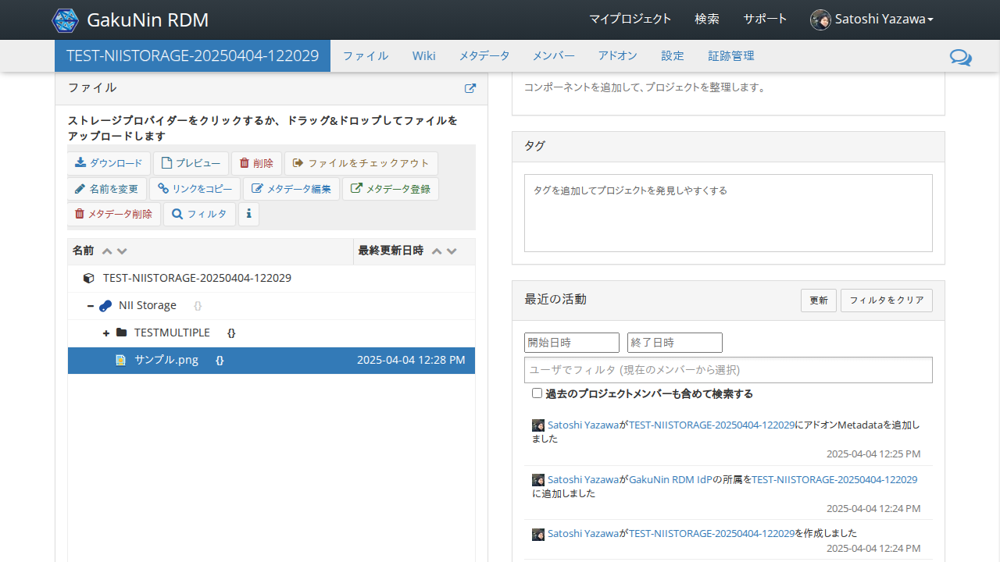

In [91]:
async def _step(page):
    await page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//a[text() = "閉じる"]').click()
    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "Remarks (English)")]/../following-sibling::textarea[1]')).not_to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## Shiftキーを押しながら「TESTMULTIPLE」をクリックする

「サンプル.png」と「TESTMULTIPLE」の両方が選択状態になり、「メタデータ複数編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769913.6242068 seconds


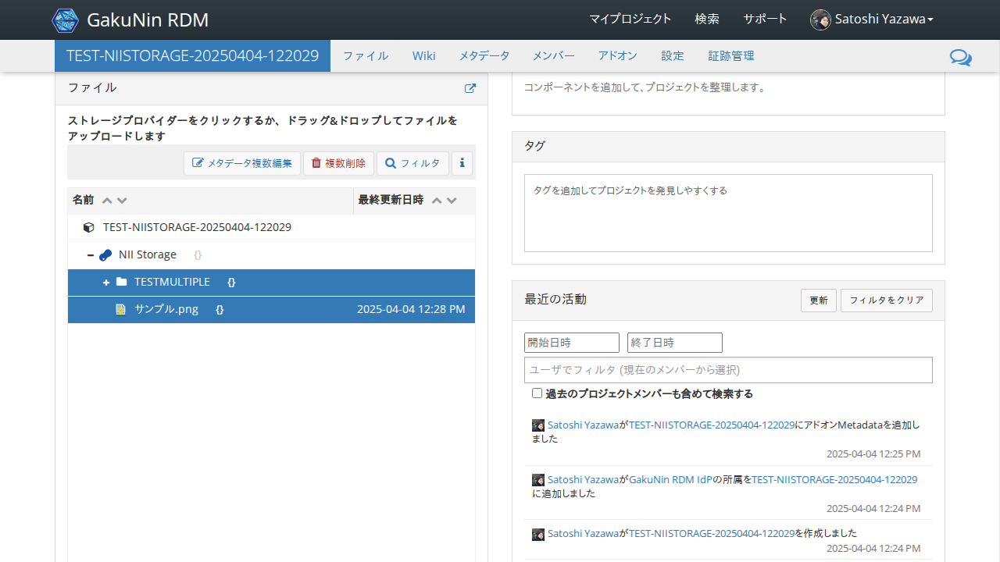

In [92]:
async def _step(page):
    await grdm.get_select_folder_title_locator(page, 'TESTMULTIPLE').click(modifiers=['Shift'])
    await expect(page.locator('//*[text() = "メタデータ複数編集"]')).to_be_enabled(timeout=transition_timeout)
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_have_count(0, timeout=transition_timeout)

await run_pw(_step)

##  「メタデータ複数編集」をクリックする

「ファイルメタデータの複数編集」ダイアログが表示されること

Start epoch: 1743769913.872199 seconds


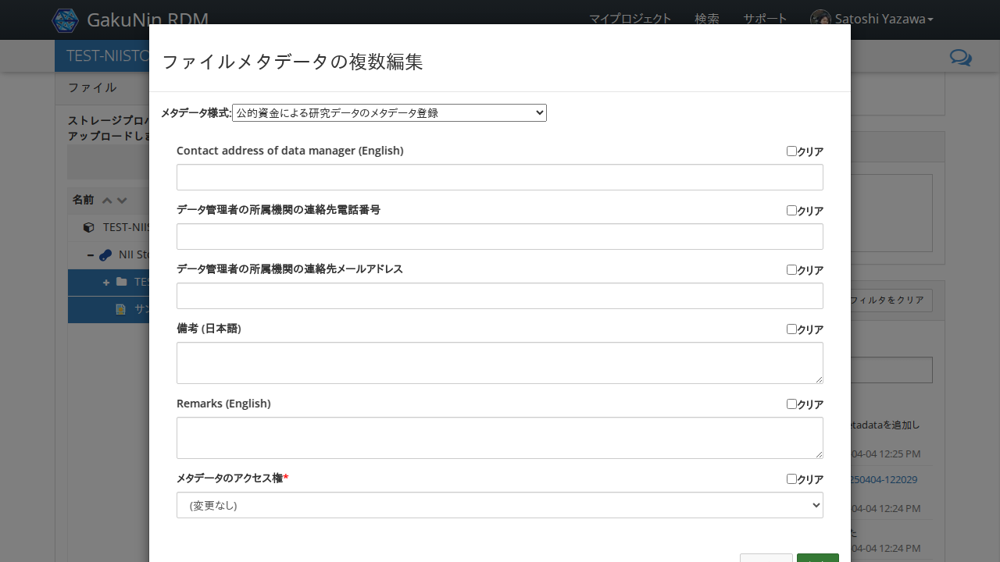

In [93]:
async def _step(page):
    await page.locator('//*[text() = "メタデータ複数編集"]').click()

    await expect(page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..//label[contains(text(), "メタデータ様式")]/following-sibling::select')).to_be_editable(timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

##  「データ No.」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769915.151122 seconds


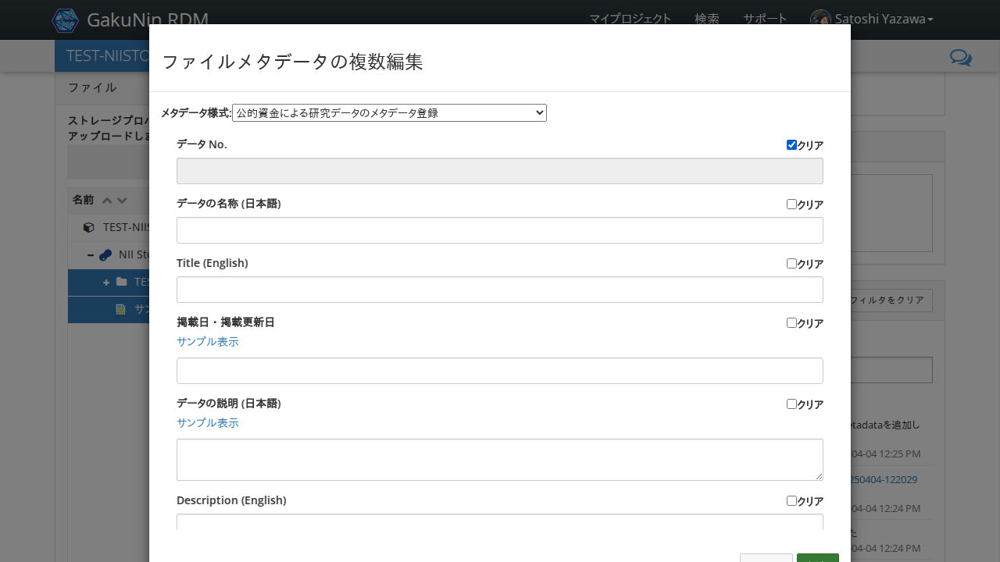

In [94]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ No.')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ No.', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データの名称(日本語)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769915.382914 seconds


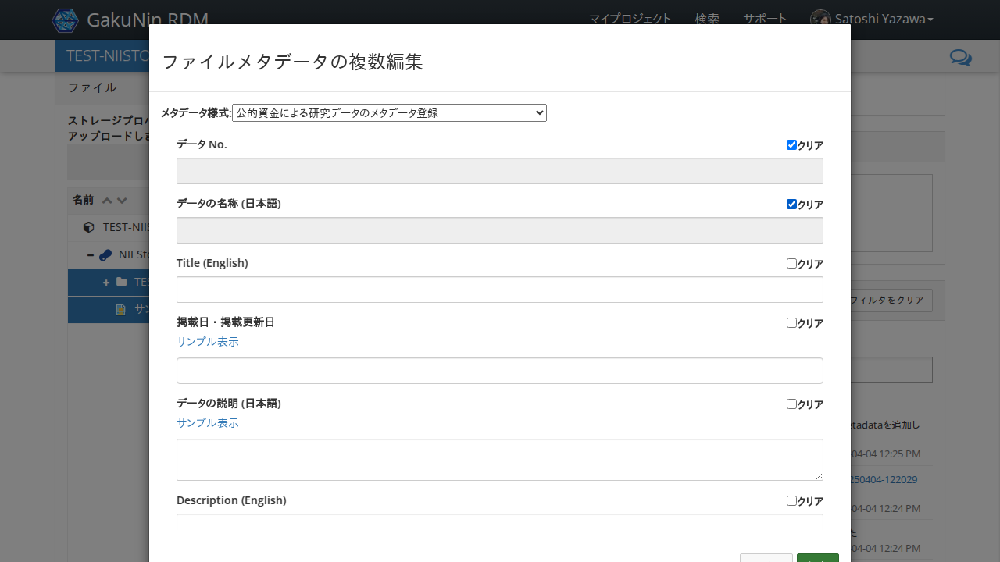

In [95]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データの名称 (日本語)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データの名称 (日本語)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「Data title (English)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769915.6106443 seconds


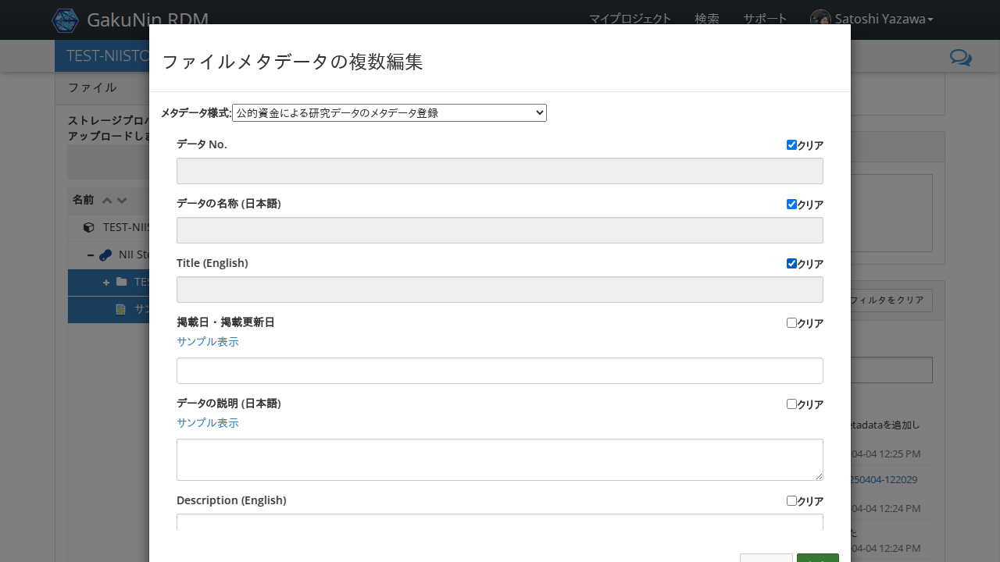

In [96]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('Data title (English)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('Data title (English)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「掲載日・掲載更新日」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769915.8595397 seconds


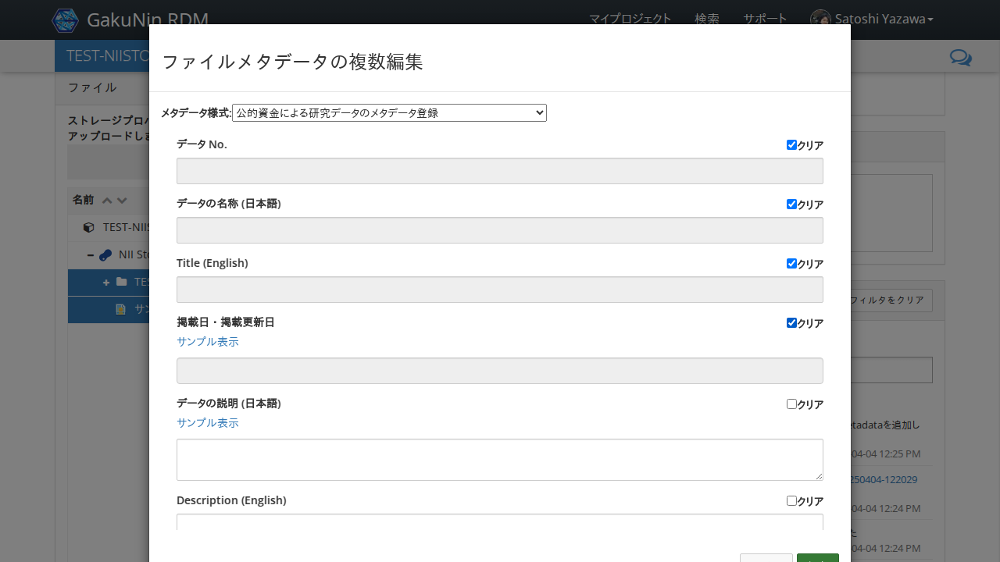

In [97]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('掲載日・掲載更新日')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('掲載日・掲載更新日', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データの説明 (日本語)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769916.073117 seconds


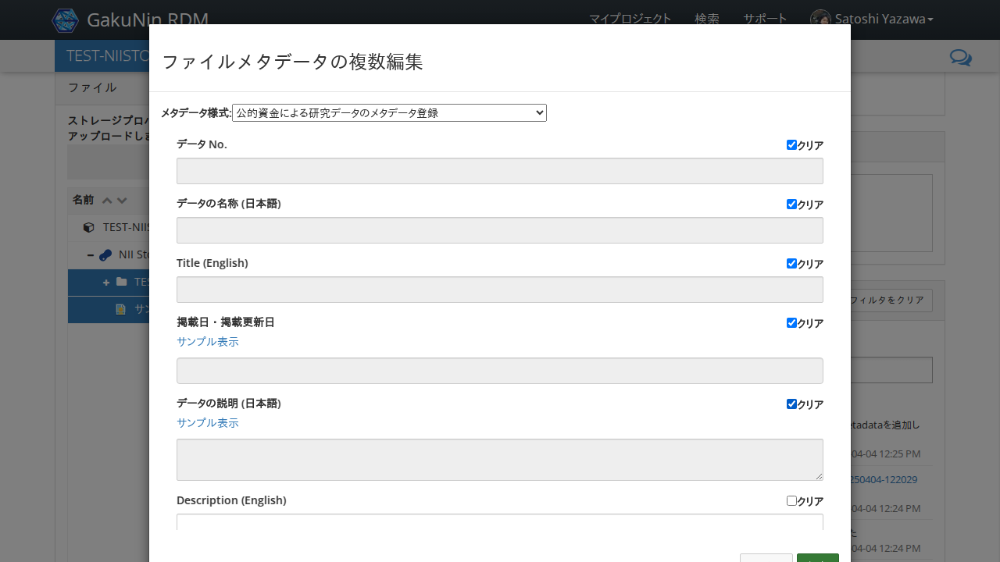

In [98]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データの説明 (日本語)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データの説明 (日本語)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「Description (English)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769916.3031526 seconds


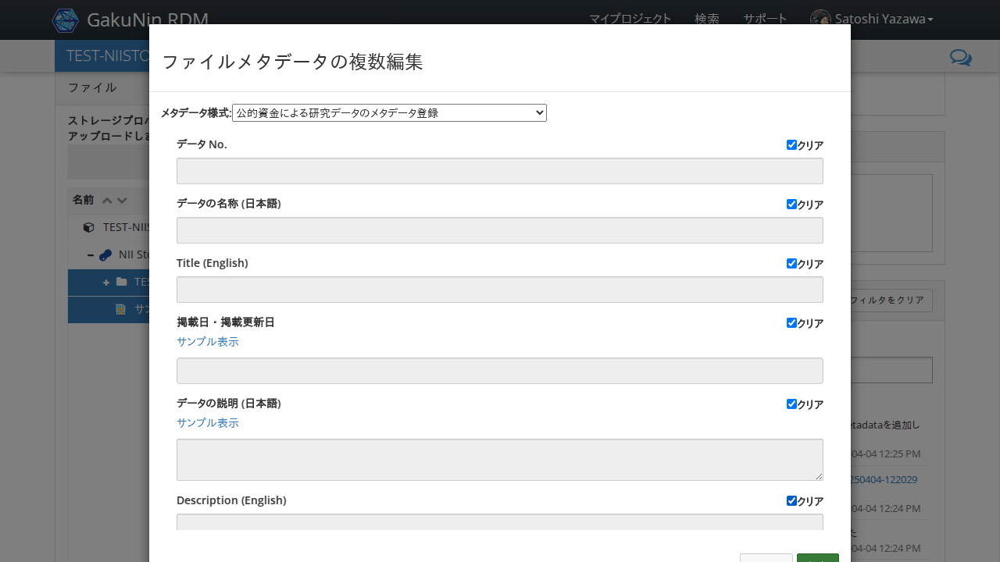

In [99]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('Description (English)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('Description (English)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データの分野」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769916.5334315 seconds


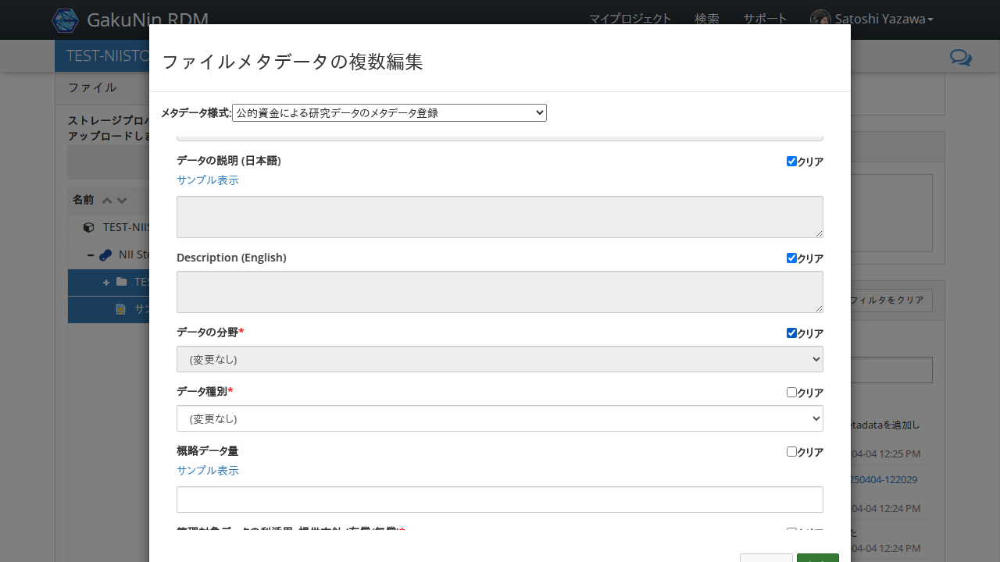

In [100]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データの分野')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データの分野', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データ種別」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769916.7798364 seconds


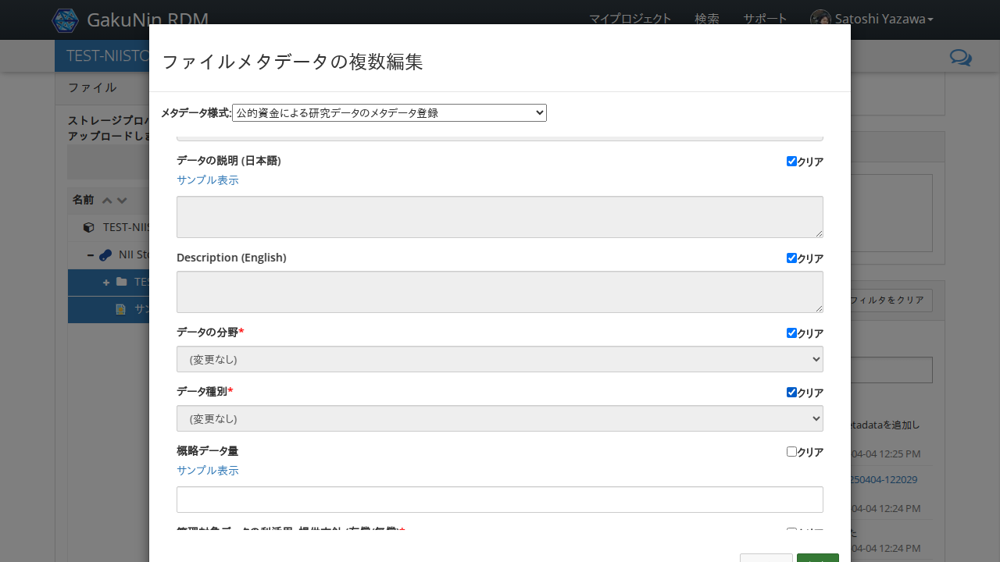

In [101]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ種別')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ種別', expect, timeout=transition_timeout)

await run_pw(_step)

##  「概略データ量」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769917.0315278 seconds


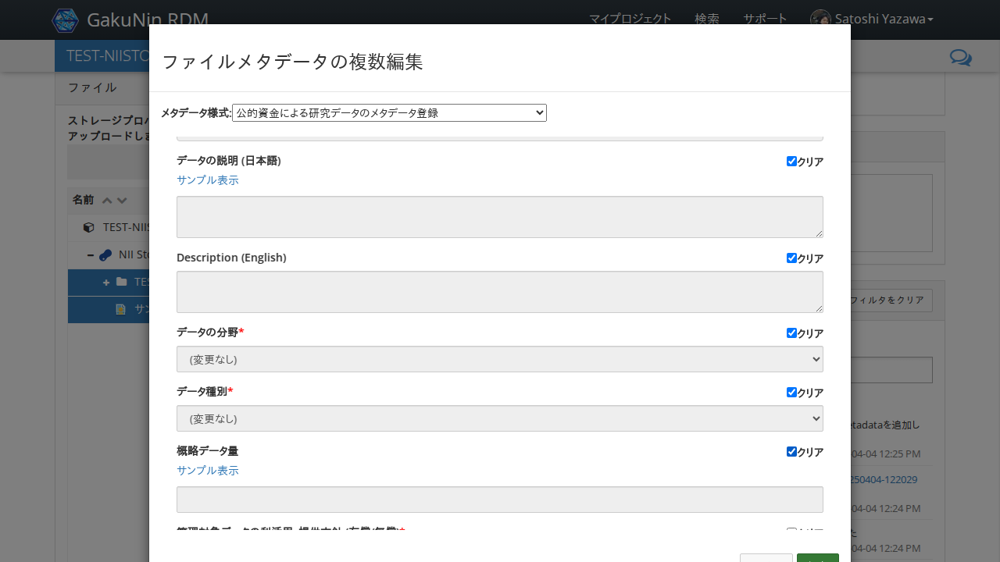

In [102]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('概略データ量')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('概略データ量', expect, timeout=transition_timeout)

await run_pw(_step)

##  「管理対象データの利活用・提供方針 (有償/無償)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769917.2807167 seconds


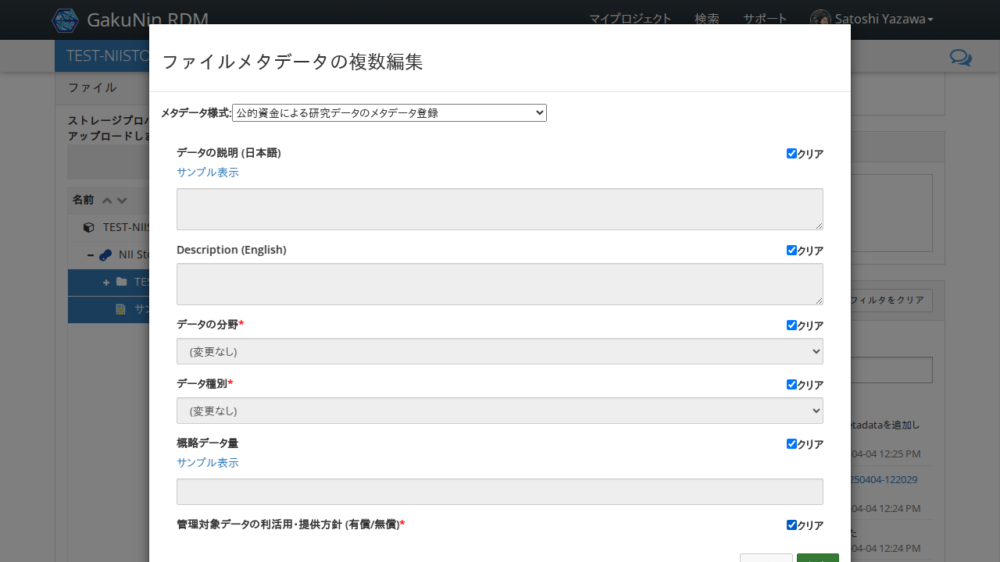

In [103]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('管理対象データの利活用・提供方針 (有償/無償)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('管理対象データの利活用・提供方針 (有償/無償)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「管理対象データの利活用・提供方針 (ライセンス)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769917.5197074 seconds


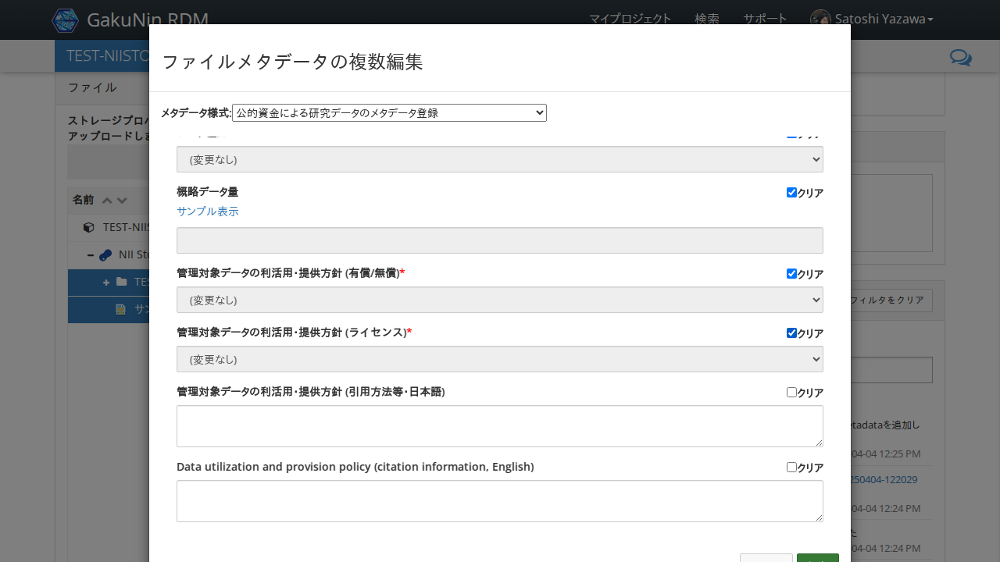

In [104]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('管理対象データの利活用・提供方針 (ライセンス)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('管理対象データの利活用・提供方針 (ライセンス)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「管理対象データの利活用・提供方針 (引用方法等・日本語)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769917.7581758 seconds


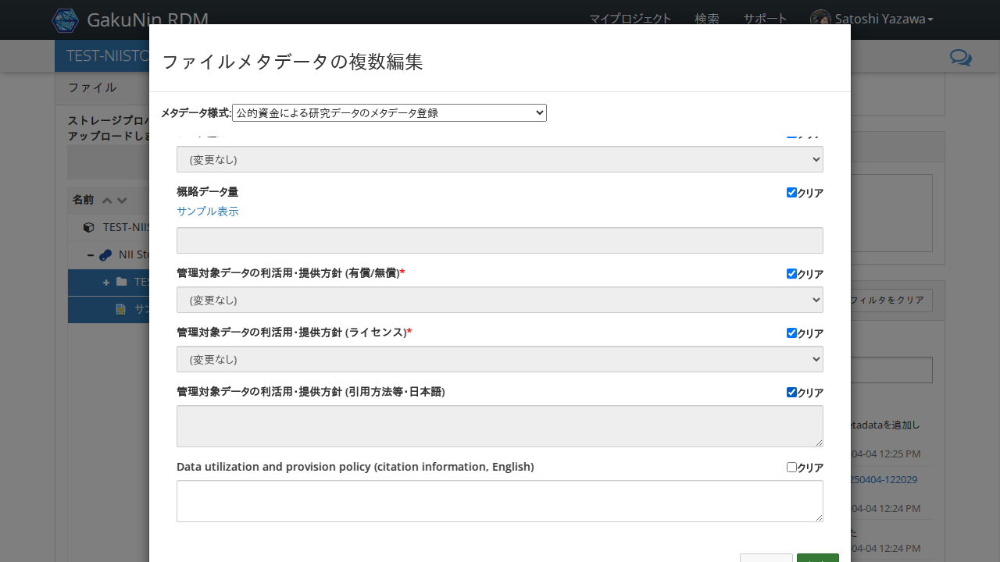

In [105]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('管理対象データの利活用・提供方針 (引用方法等・日本語)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('管理対象データの利活用・提供方針 (引用方法等・日本語)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「Data utilization and provision policy (citation information, English)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769917.9868102 seconds


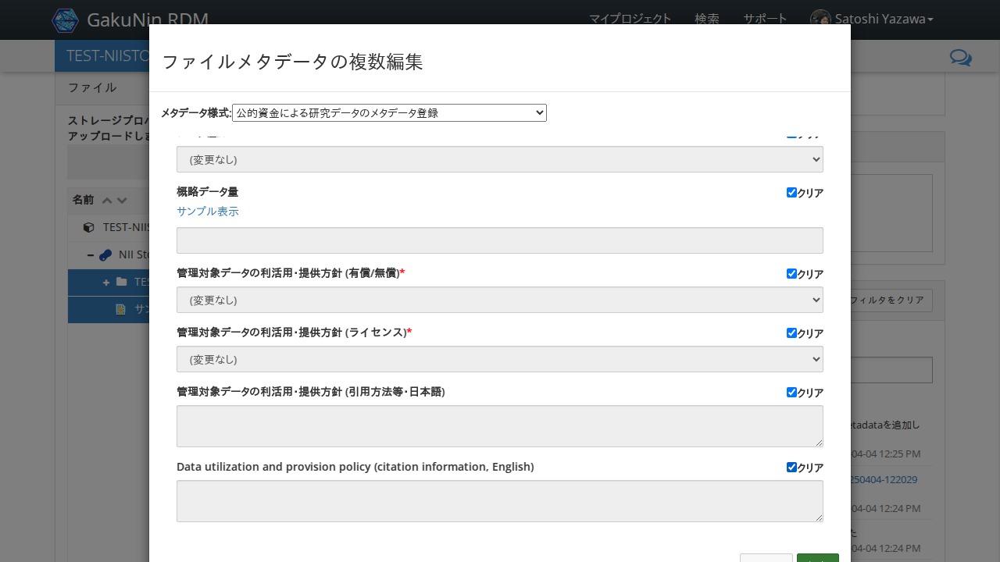

In [106]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('Data utilization and provision policy (citation information, English)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('Data utilization and provision policy (citation information, English)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「アクセス権」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769918.2269228 seconds


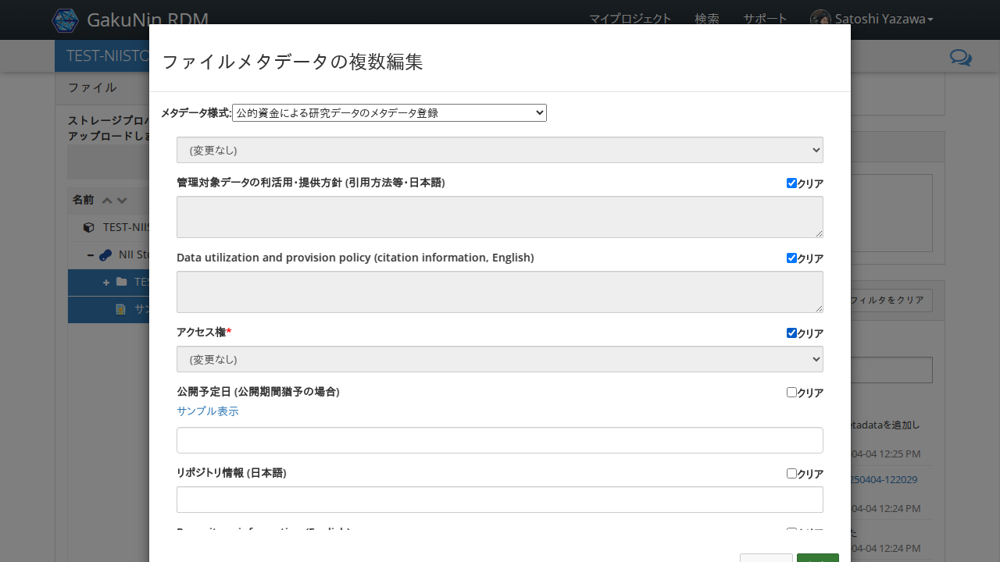

In [107]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('アクセス権')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('アクセス権', expect, timeout=transition_timeout)

await run_pw(_step)

##  「公開予定日 (公開期間猶予の場合)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769918.4521298 seconds


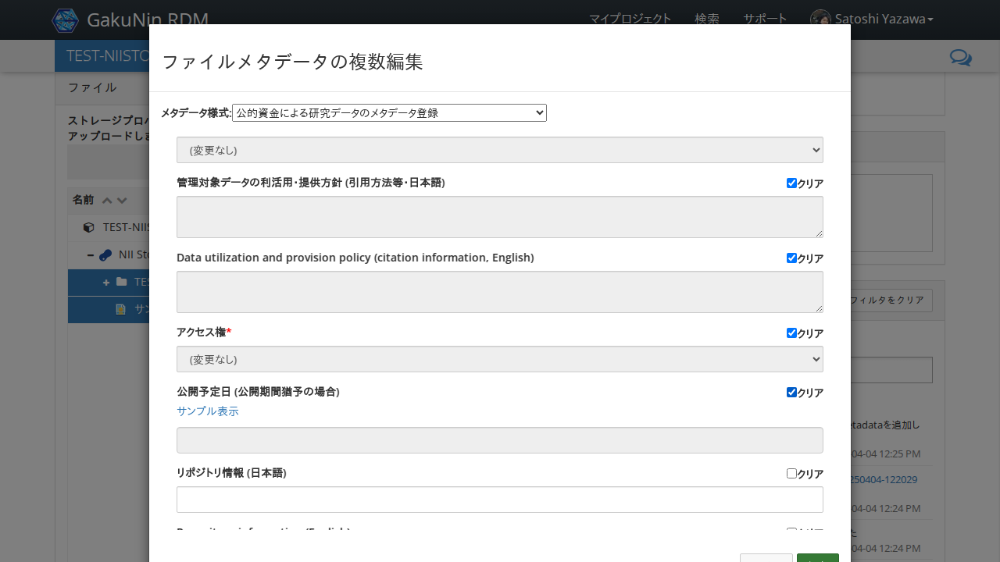

In [108]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('公開予定日')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('公開予定日', expect, timeout=transition_timeout)

await run_pw(_step)

##  「リポジトリ情報 (日本語)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769918.6873426 seconds


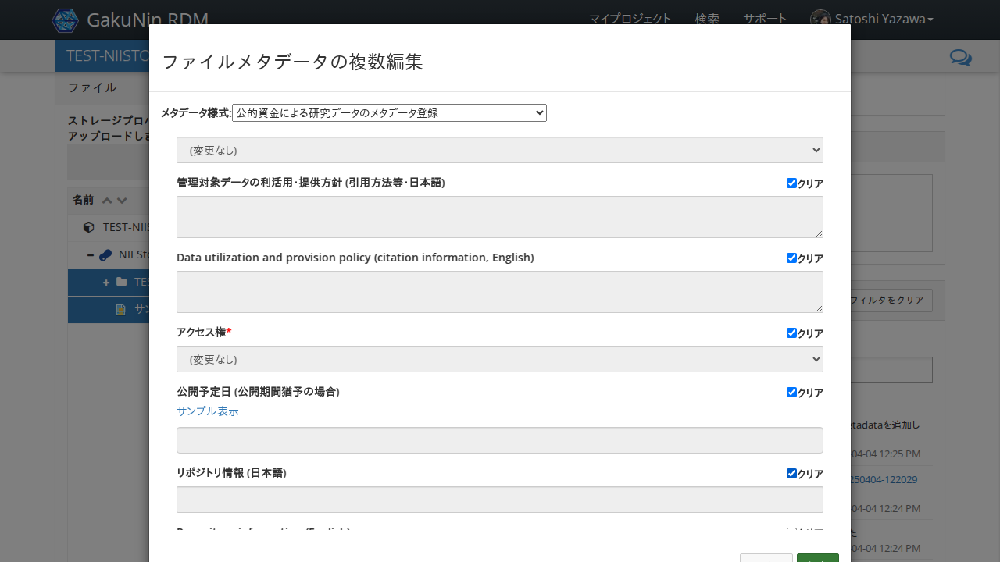

In [109]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('リポジトリ情報 (日本語)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('リポジトリ情報 (日本語)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「Repository information (English)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769918.937552 seconds


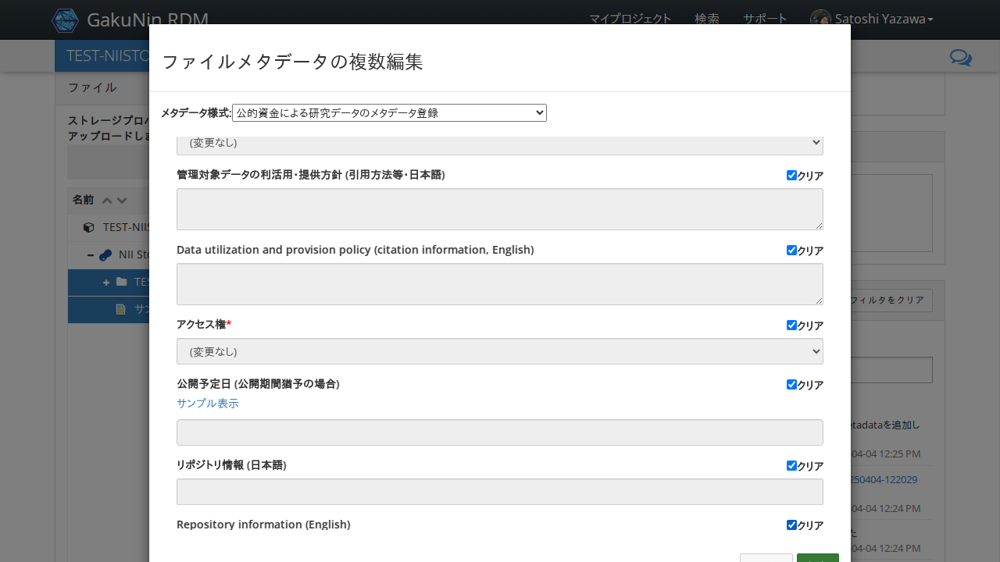

In [110]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('Repository information (English)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('Repository information (English)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「リポジトリURL・DOIリンク」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769919.1644619 seconds


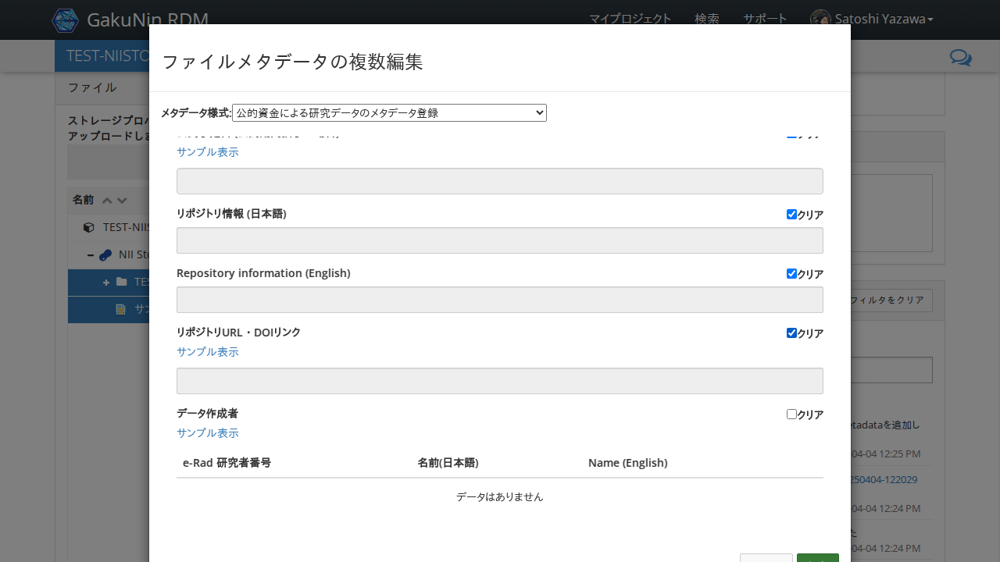

In [111]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('リポジトリURL・DOIリンク')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('リポジトリURL・DOIリンク', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データ作成者」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769967.1659079 seconds


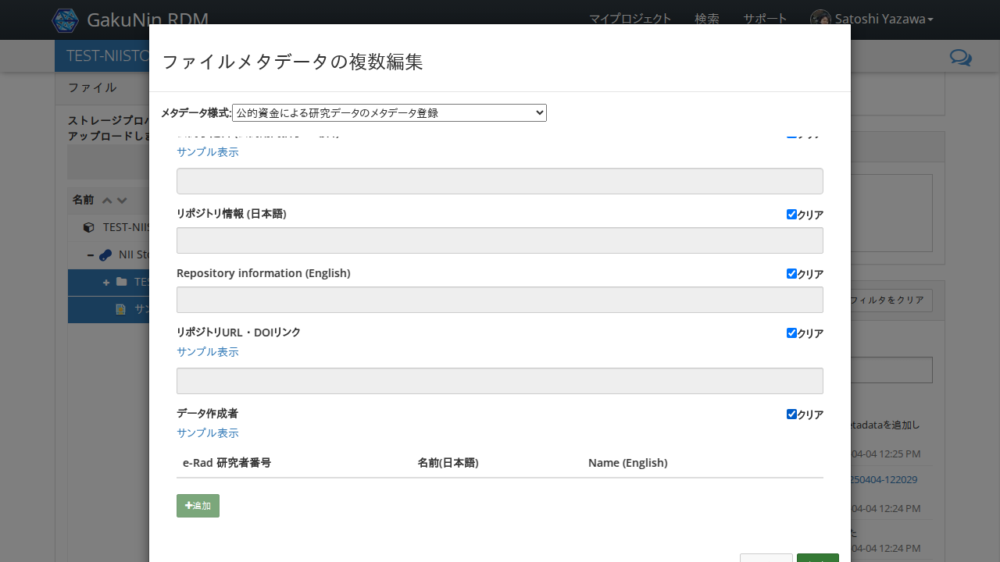

In [114]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ作成者')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ作成者', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データ管理機関 (日本語)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769978.964655 seconds


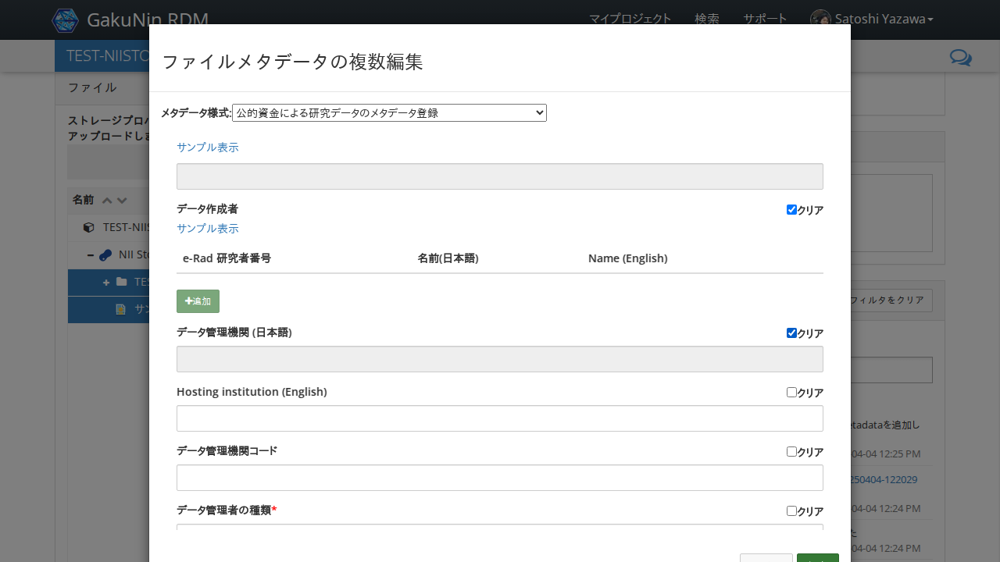

In [115]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ管理機関 (日本語)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ管理機関 (日本語)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「Hosting institution (English)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769979.204392 seconds


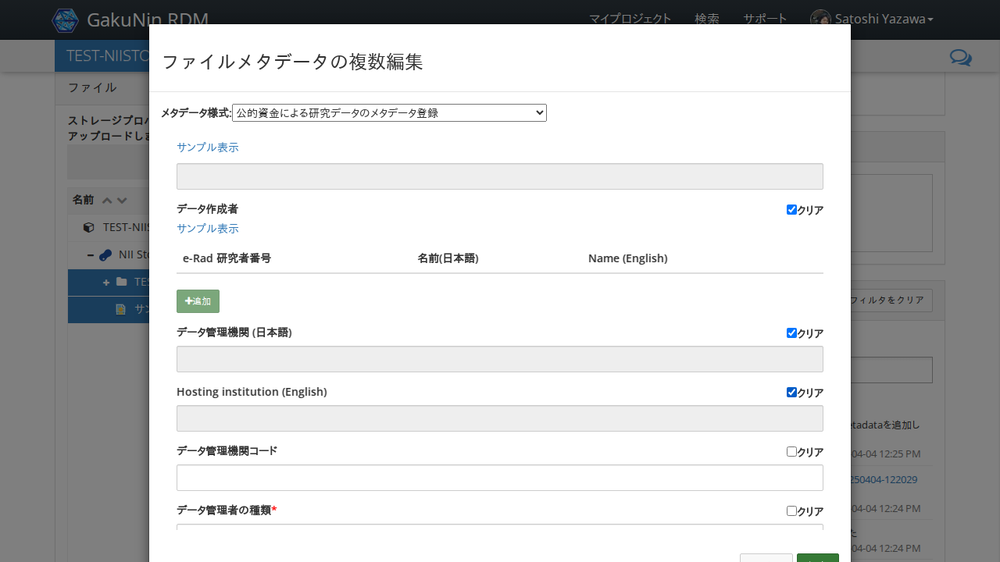

In [116]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('Hosting institution (English)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('Hosting institution (English)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データ管理機関コード」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769979.4435287 seconds


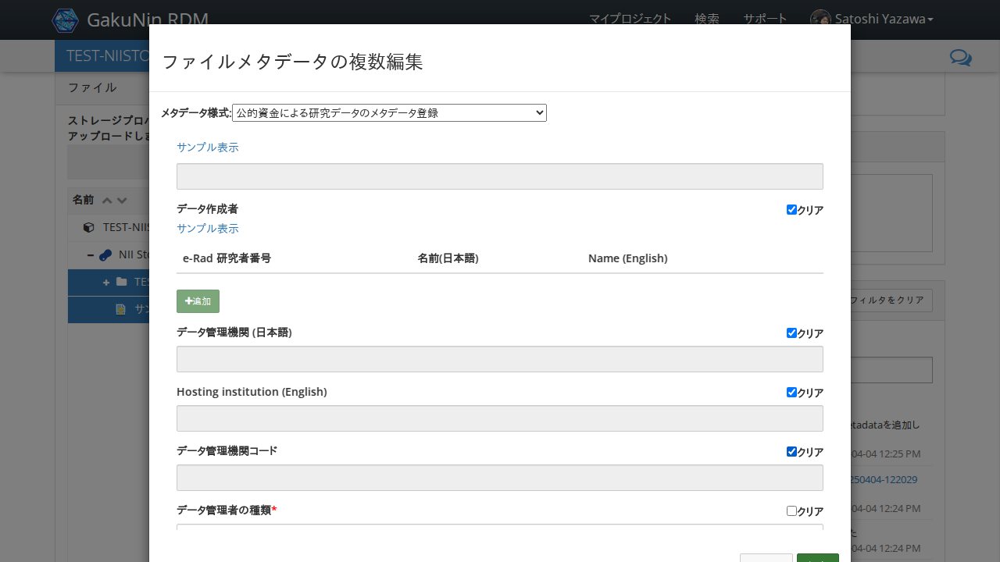

In [117]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ管理機関コード')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ管理機関コード', expect, timeout=transition_timeout)

await run_pw(_step)

## 「データ管理者の種類」にて「個人」を選択する

値が表示されること

Start epoch: 1743769979.693531 seconds


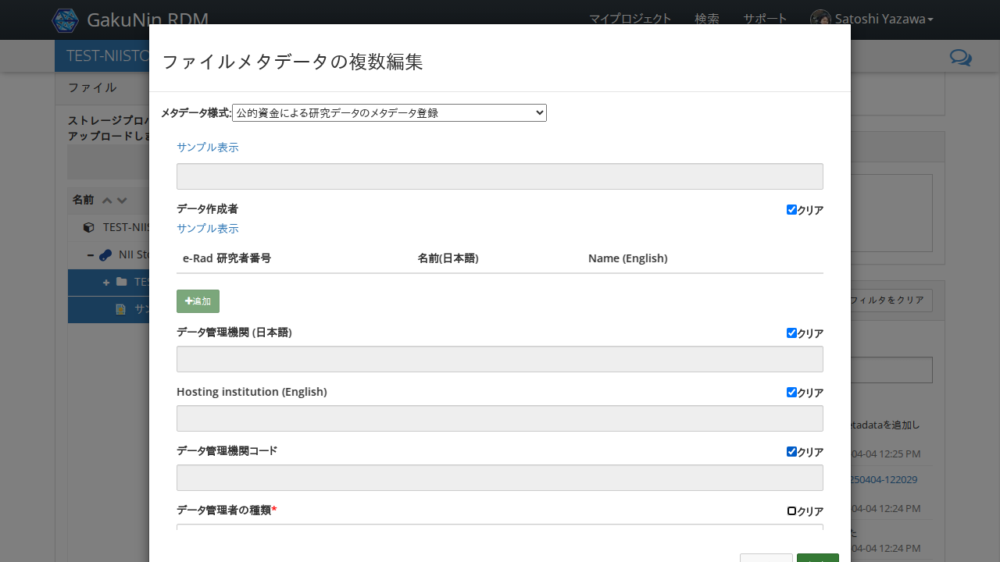

In [118]:
async def _step(page):
    locator = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..//label[contains(text(), "データ管理者の種類")]/../following-sibling::div[1]')
    value = '個人'
    await locator.locator('label:has-text("個人") input[type="radio"]').click()
    await page.keyboard.press('Tab')

    await expect(locator.locator('input[type="radio"]:checked')).to_have_value('individual', timeout=transition_timeout)

await run_pw(_step)

##  「データ管理者の種類」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769979.8998218 seconds


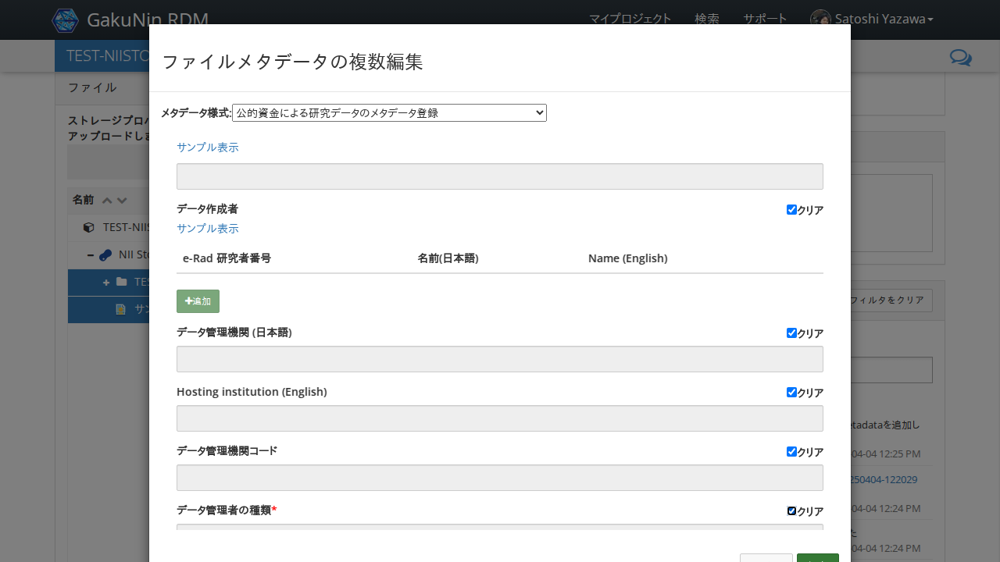

In [119]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ管理者の種類')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ管理者の種類', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データ管理者の e-Rad 研究者番号」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769980.1455867 seconds


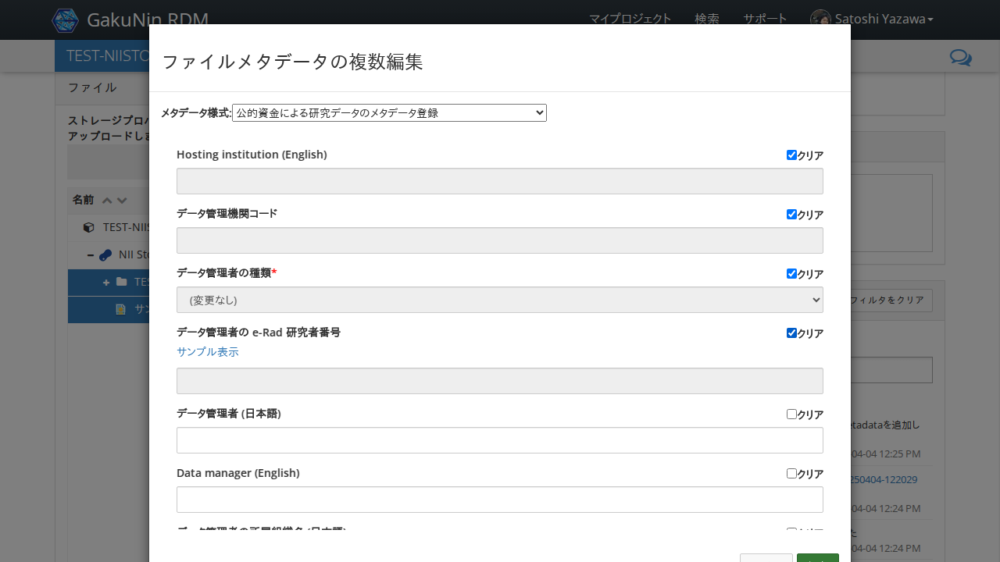

In [120]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ管理者の e-Rad 研究者番号')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ管理者の e-Rad 研究者番号', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データ管理者 (日本語)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769980.386836 seconds


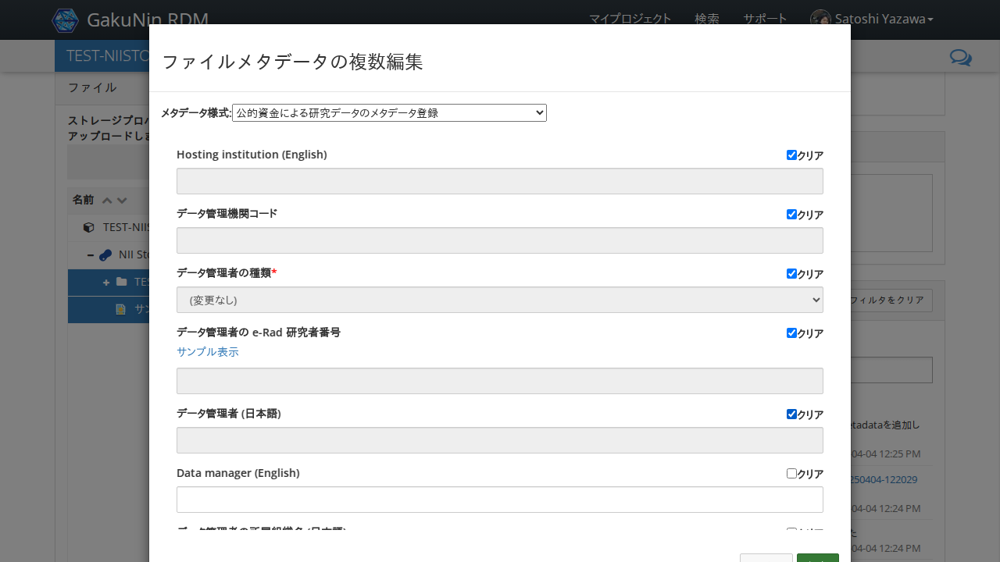

In [121]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ管理者 (日本語)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ管理者 (日本語)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「Data manager (English)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769980.619669 seconds


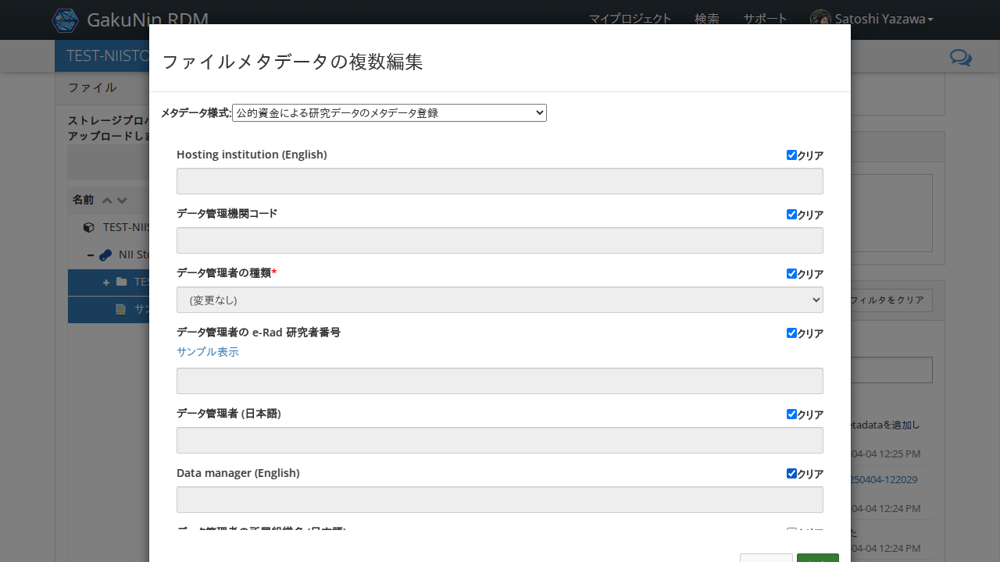

In [122]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('Data manager (English)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('Data manager (English)', expect, timeout=transition_timeout)

await run_pw(_step)

## 「データ管理者の所属組織名(日本語)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769980.8521762 seconds


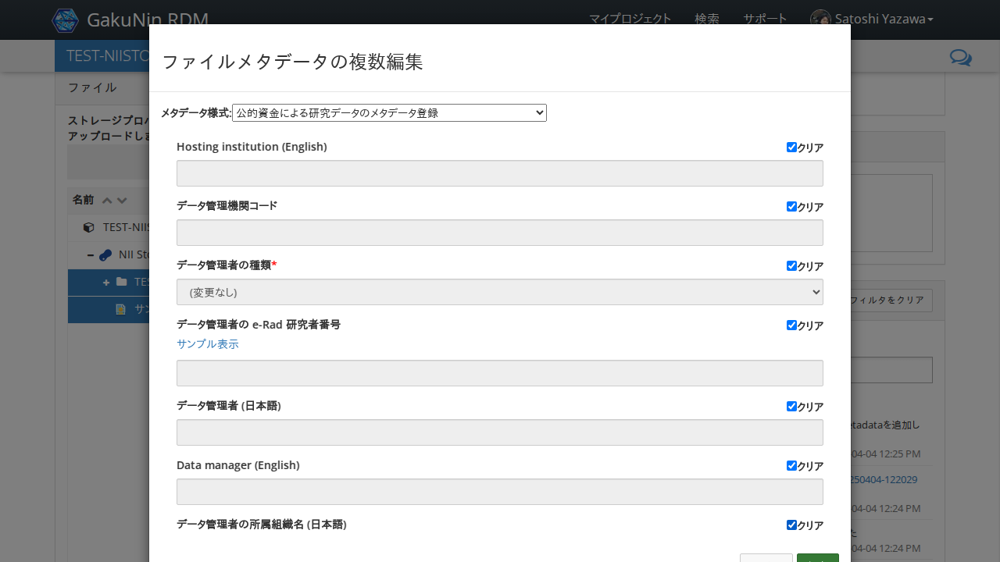

In [123]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ管理者の所属組織名 (日本語)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ管理者の所属組織名 (日本語)', expect, timeout=transition_timeout)

await run_pw(_step)

## 「Contact organization of data manager (English)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769981.0856647 seconds


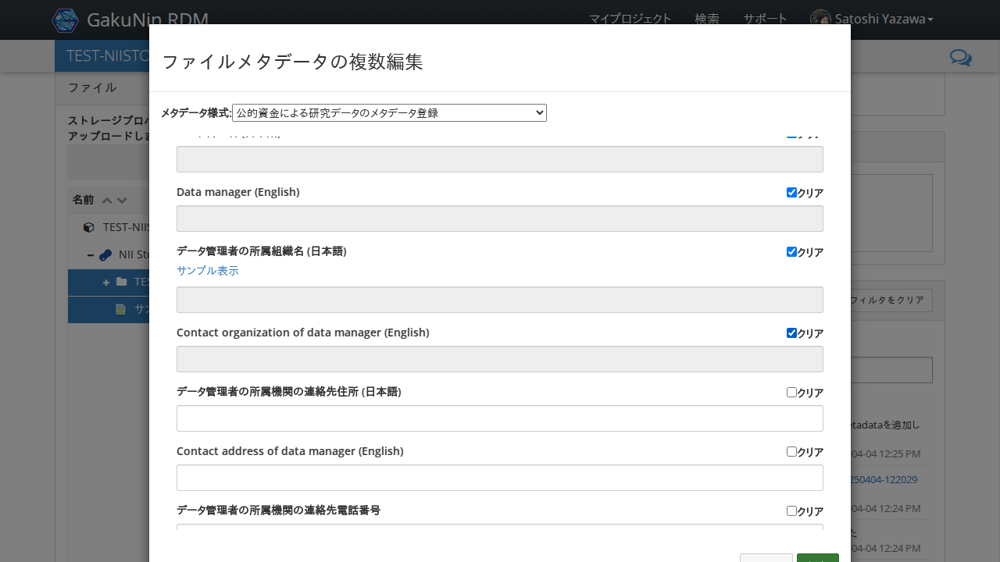

In [124]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('Contact organization of data manager (English)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('Contact organization of data manager (English)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データ管理者の所属機関の連絡先住所 (日本語)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769981.31767 seconds


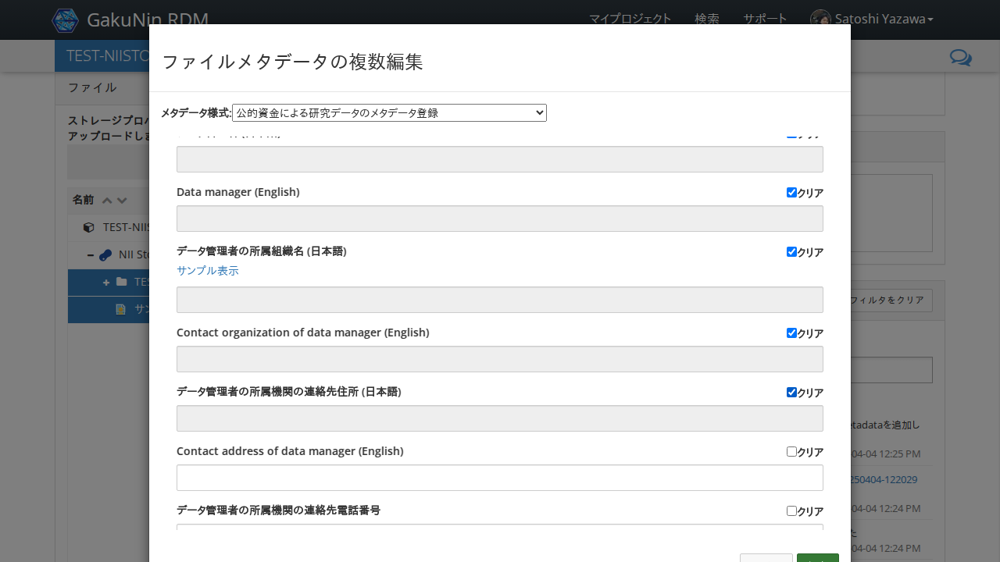

In [125]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ管理者の所属機関の連絡先住所 (日本語)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ管理者の所属機関の連絡先住所 (日本語)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「Contact address of data manager (English)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769981.5597882 seconds


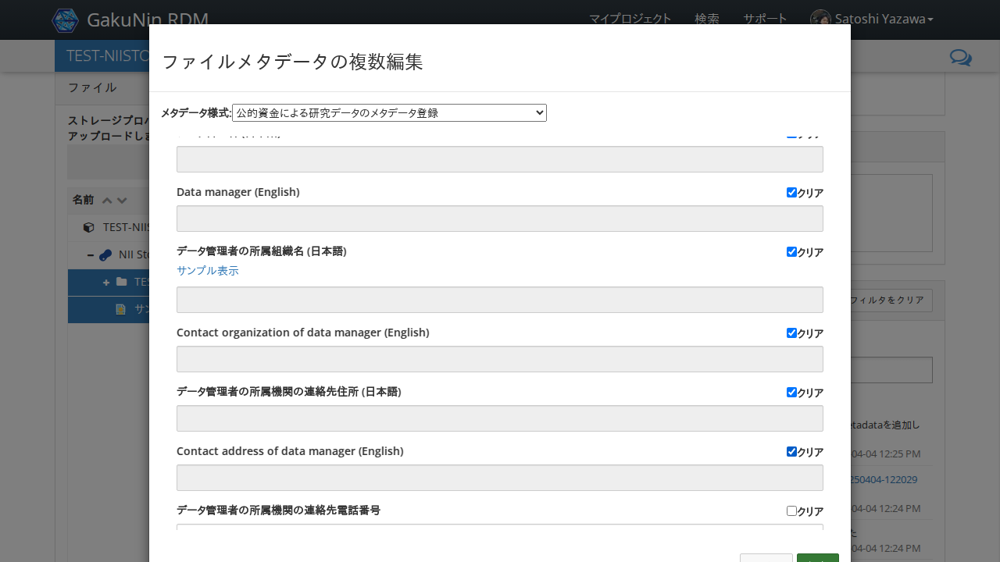

In [126]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('Contact address of data manager (English)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('Contact address of data manager (English)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データ管理者の所属機関の連絡先電話番号」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769981.8013933 seconds


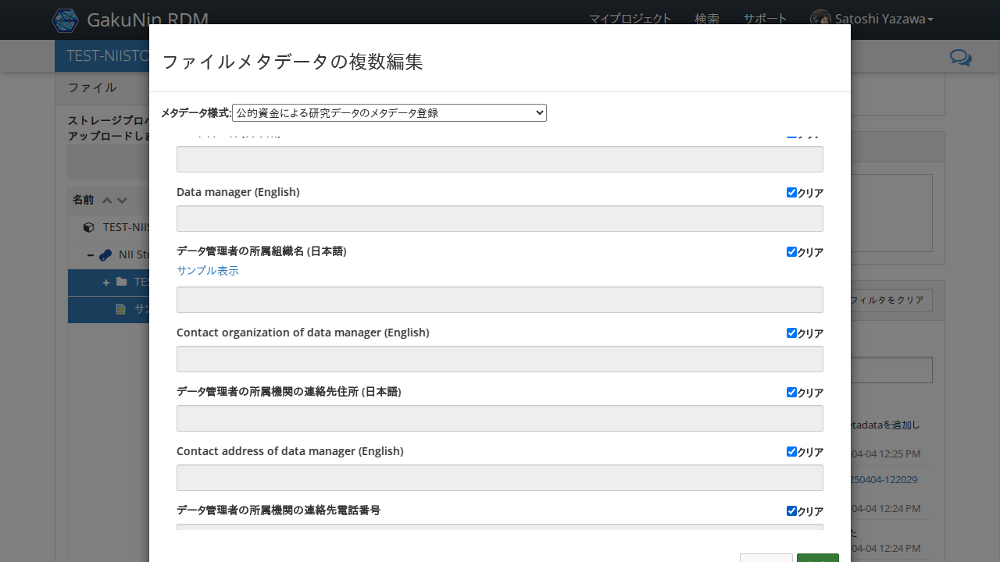

In [127]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ管理者の所属機関の連絡先電話番号')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ管理者の所属機関の連絡先電話番号', expect, timeout=transition_timeout)

await run_pw(_step)

##  「データ管理者の所属機関の連絡先メールアドレス」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769982.043749 seconds


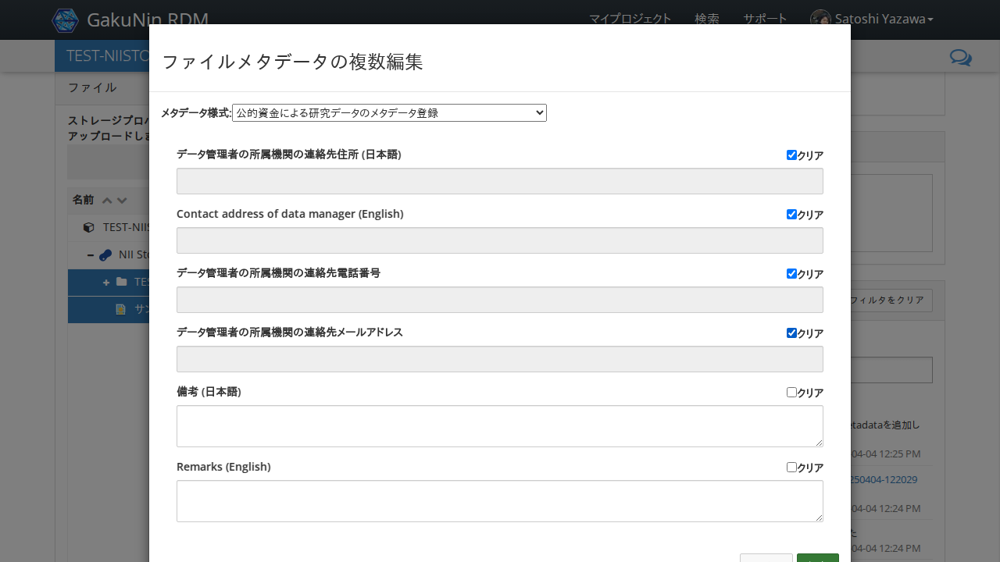

In [128]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('データ管理者の所属機関の連絡先メールアドレス')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('データ管理者の所属機関の連絡先メールアドレス', expect, timeout=transition_timeout)

await run_pw(_step)

##  「備考 (日本語)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769982.283541 seconds


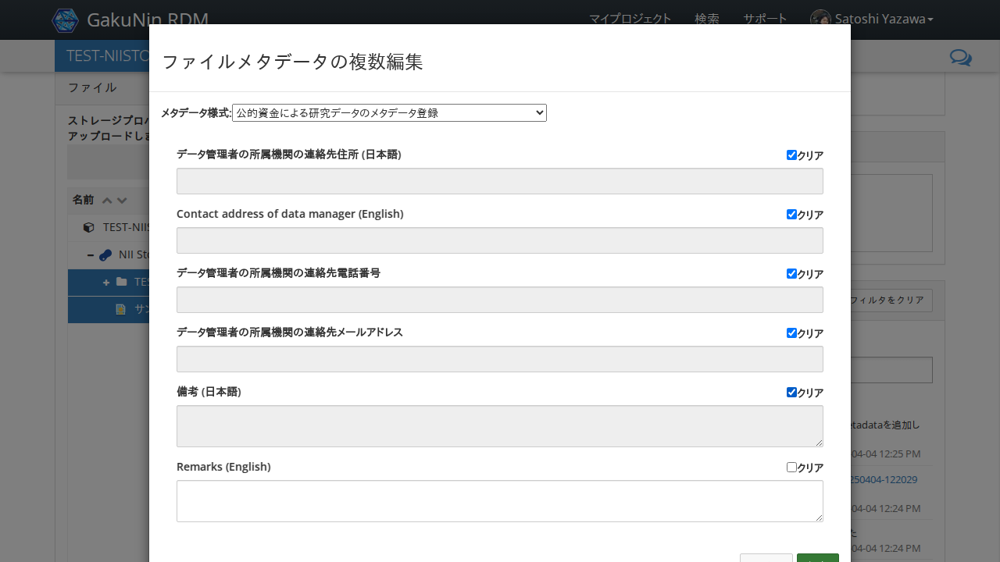

In [129]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('備考 (日本語)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('備考 (日本語)', expect, timeout=transition_timeout)

await run_pw(_step)

##  「Remarks (English)」の「クリア」をチェックする

直下の入力欄が入力不可になること

Start epoch: 1743769982.5184062 seconds


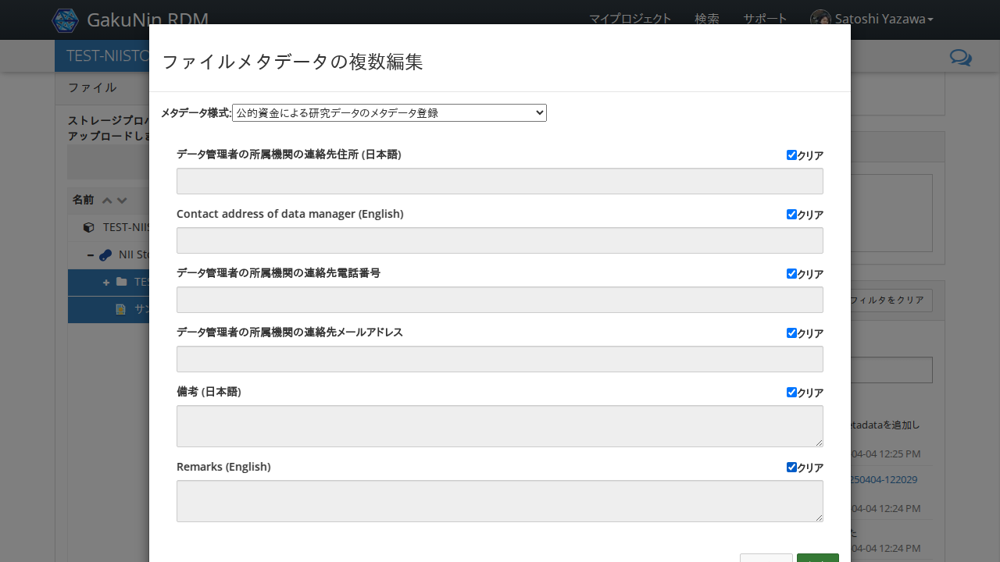

In [130]:
async def _step(page):
    dialog = page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    clear_cb = form.get_clear_checkbox('Remarks (English)')
    await clear_cb.click()

    await expect(clear_cb).to_be_checked(timeout=transition_timeout)
    await form.expect_cleared('Remarks (English)', expect, timeout=transition_timeout)

await run_pw(_step)

## 「保存」をクリックする

ダイアログが非表示になること

Start epoch: 1743769982.9808924 seconds


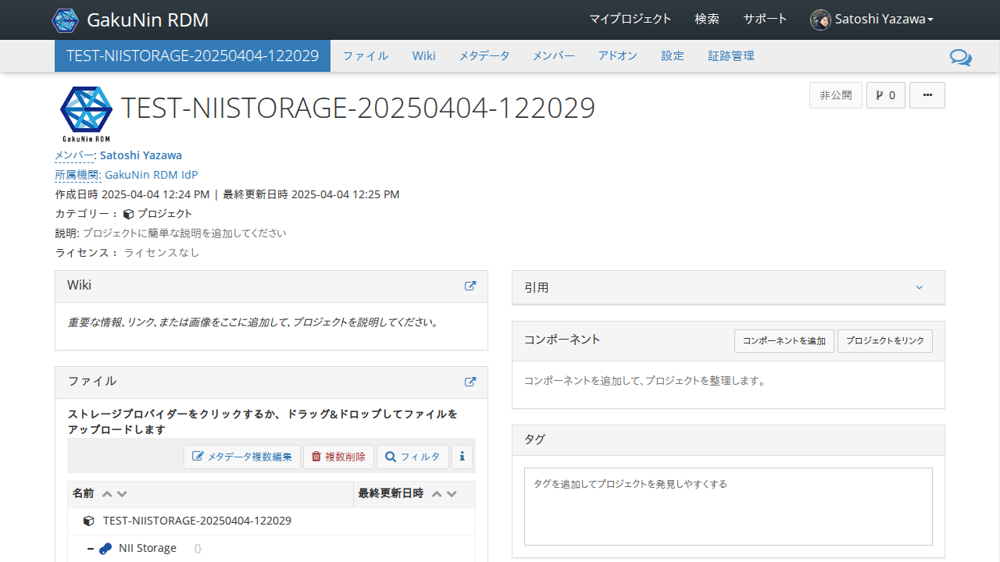

In [132]:
async def _step(page):
    await page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..//a[text() = "保存"]').click()
    await expect(page.locator('//h3[text() = "ファイルメタデータの複数編集"]/../../..//label[contains(text(), "Remarks (English)")]/../following-sibling::textarea[1]')).not_to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## 「TESTMULTIPLE」をクリックする

「メタデータ編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769985.0903978 seconds


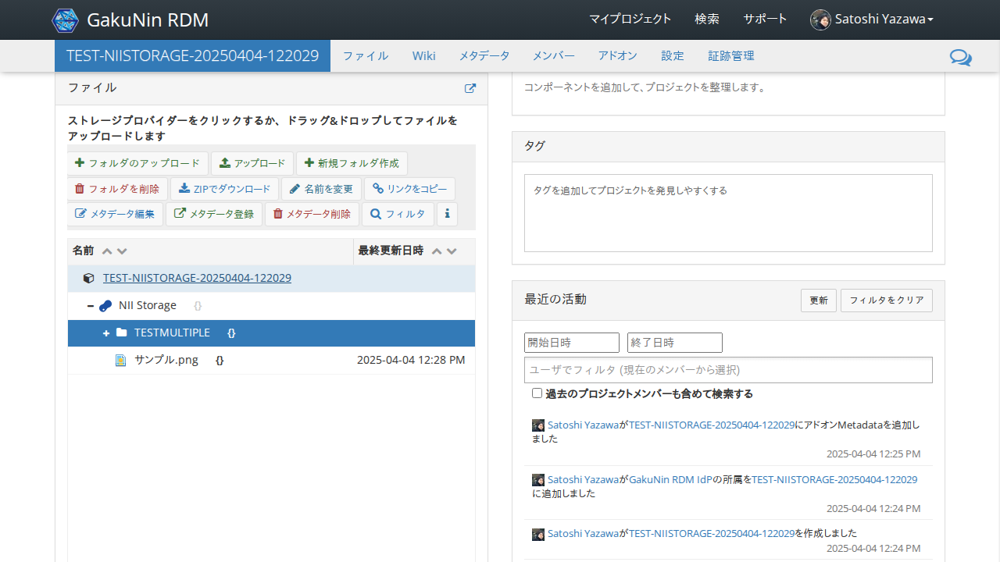

In [133]:
async def _step(page):
    await grdm.get_select_folder_title_locator(page, 'TESTMULTIPLE').click()
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

##  「メタデータ編集」をクリックする

「メタデータ編集」ダイアログが表示され、以下の内容が表示されること。

- データNo. :
- データの名称 (日本語) :
- Data title (English) :
- 掲載日・掲載更新日 :
- データの説明 (日本語) :
- Description (English) :
- データの分野 : プロジェクトの研究分野
- データ種別 : データセット
- 概略データ量 :
- 管理対象データの利活用・提供方針 (有償/無償) : 
- 管理対象データの利活用・提供方針 (ライセンス) : 
- 管理対象データの利活用・提供方針 (引用方法等・日本語) :
- Data utilization and provision policy (citation information, English) :
- アクセス権 : 
- リポジトリ情報 (日本語) :
- Repository information (English) :
- リポジトリURL・DOIリンク :
- データ作成者 :
- データ管理機関 (日本語) :
- Hosting institution (English) :
- データ管理機関コード : 
- データ管理者の e-Rad 研究者番号 :
- データ管理者 (日本語) :
- Data manager (English) :
- データ管理者の所属組織名(日本語):
- Contact organization of data manager (English):
- データ管理者の所属機関の連絡先住所 (日本語) :
- Contact address of data manager (English) :
- データ管理者の所属機関の連絡先電話番号 :
- データ管理者の所属機関の連絡先メールアドレス :
- 備考 (日本語) :
- Remarks (English) :


In [ ]:
async def _step(page):
    await page.locator('//*[text() = "メタデータ編集"]').click()

    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "メタデータ様式")]/following-sibling::select[1]')).to_be_editable(timeout=transition_timeout)
    
    # 値のチェック
    expected_texts = [{'name': 'データ No.', 'value': ''},
     {'name': 'データの名称 (日本語)', 'value': ''},
     {'name': 'Data title (English)', 'value': ''},
     {'name': '掲載日・掲載更新日', 'value': ''},
     {'name': 'データの説明 (日本語)', 'value': ''},
     {'name': 'Description (English)',
      'value': ''},
     {'name': 'データの分野', 'value': 'project'}, # プロジェクトの研究分野
     {'name': 'データ種別', 'value': 'dataset'}, # データセット
     {'name': '概略データ量', 'value': ''},
     {'name': '管理対象データの利活用・提供方針 (有償/無償)', 'value': ''},
     {'name': '管理対象データの利活用・提供方針 (ライセンス)', 'value': ''},
     {'name': '管理対象データの利活用・提供方針 (引用方法等・日本語)', 'value': ''},
     {'name': 'Data utilization and provision policy (citation information, English)',
      'value': ''},
     {'name': 'アクセス権', 'value': ''},
     {'name': 'リポジトリ情報 (日本語)', 'value': ''},
     {'name': 'Repository information (English)', 'value': ''},
     {'name': 'リポジトリURL・DOIリンク', 'value': ''},
     {'name': 'データ作成者',
      'value': {
          (0, 0): None,
          (0, 1): None,
          (0, 2): None,
      }},
     {'name': 'データ管理機関 (日本語)', 'value': ''},
     {'name': 'Hosting institution (English)',
      'value': ''},
     {'name': 'データ管理機関コード', 'value': ''},
     {'name': 'データ管理者の e-Rad 研究者番号', 'value': ''},
     {'name': 'データ管理者 (日本語)', 'value': {'last': '', 'middle': '', 'first': ''}},
     {'name': 'Data manager (English)', 'value': {'last': '', 'middle': '', 'first': ''}},
     {'name': 'データ管理者の所属組織名 (日本語)', 'value': ''},
     {'name': 'Contact organization of data manager (English)', 'value': ''},
     {'name': 'データ管理者の所属機関の連絡先住所 (日本語)', 'value': ''},
     {'name': 'Contact address of data manager (English)',
      'value': ''},
     {'name': 'データ管理者の所属機関の連絡先電話番号', 'value': ''},
     {'name': 'データ管理者の所属機関の連絡先メールアドレス', 'value': ''},
     {'name': '備考 (日本語)', 'value': ''},
     {'name': 'Remarks (English)', 'value': ''}]

    dialog = page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    for t in expected_texts:
        name = t['name']
        value = t['value']
        print(name)
        await form.scroll_to(name)
        if isinstance(value, dict) and 'last' in value:
            actual = await form.get_name(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict) and 'number' in value:
            actual = await form.get_author(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict):
            for key in value.keys():
                if value[key] is None:
                    continue
                cell_value = await form.get_table_cell(name, key[0], key[1])
                assert cell_value == value[key], f'{name} {key}: expected {value[key]!r}, got {cell_value!r}'
            continue
        actual = await form.get(name)
        assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
    time.sleep(1)
    
await run_pw(_step)

## 「閉じる」をクリックする

ダイアログが非表示になること

Start epoch: 1743769987.3647418 seconds


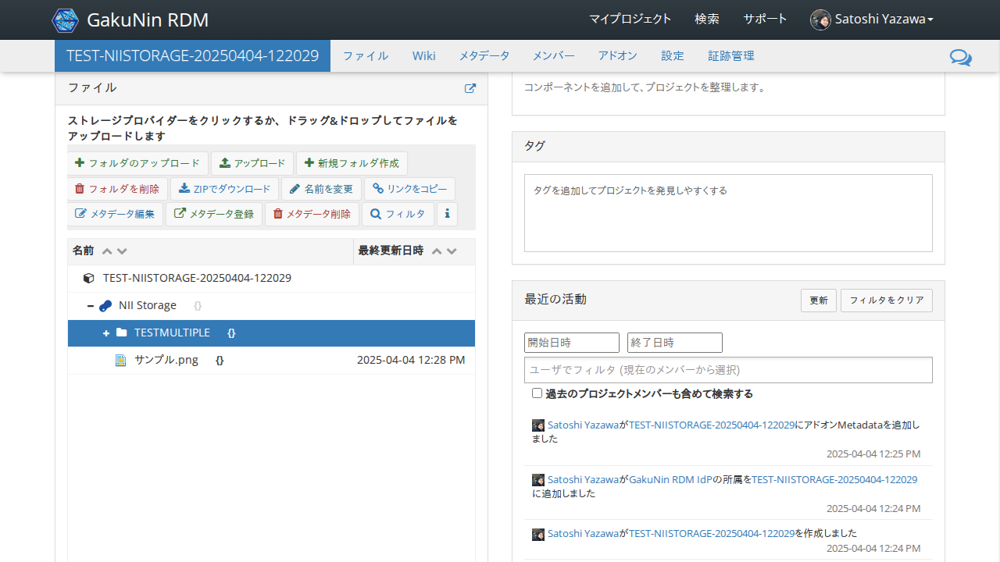

In [135]:
async def _step(page):
    await page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//a[text() = "閉じる"]').click()
    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "Remarks (English)")]/../following-sibling::textarea[1]')).not_to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## 「サンプル.png」のアイコンをクリックする

「メタデータ編集」ボタンが表示されること (表示まで数秒かかる可能性がある)

Start epoch: 1743769987.9667954 seconds


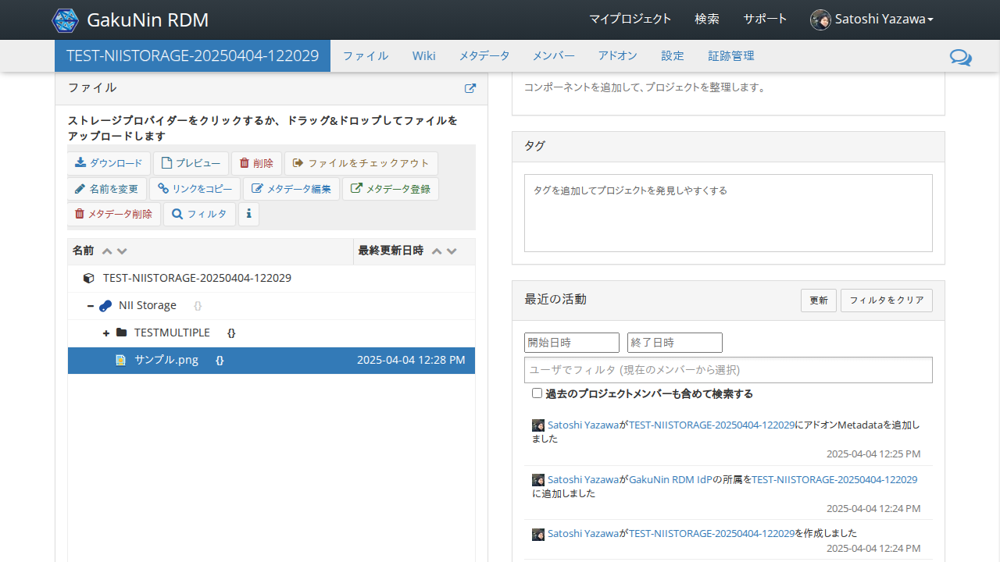

In [136]:
async def _step(page):
    await grdm.get_select_file_extension_locator(page, 'サンプル.png').click()
    await expect(page.locator('//*[text() = "メタデータ編集"]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

##  「メタデータ編集」をクリックする

「メタデータ編集」ダイアログが表示され、以下の内容が表示されること。

- データNo. :
- データの名称 (日本語) :
- Data title (English) :
- 掲載日・掲載更新日 :
- データの説明 (日本語) :
- Description (English) :
- データの分野 : プロジェクトの研究分野
- データ種別 : データセット
- 概略データ量 :
- 管理対象データの利活用・提供方針 (有償/無償) : 
- 管理対象データの利活用・提供方針 (ライセンス) : 
- 管理対象データの利活用・提供方針 (引用方法等・日本語) :
- Data utilization and provision policy (citation information, English) :
- アクセス権 : 
- リポジトリ情報 (日本語) :
- Repository information (English) :
- リポジトリURL・DOIリンク :
- データ作成者 :
- データ管理機関 (日本語) :
- Hosting institution (English) :
- データ管理機関コード : 
- データ管理者の e-Rad 研究者番号 :
- データ管理者 (日本語) :
- Data manager (English) :
- データ管理者の所属組織名(日本語):
- Contact organization of data manager (English):
- データ管理者の所属機関の連絡先住所 (日本語) :
- Contact address of data manager (English) :
- データ管理者の所属機関の連絡先電話番号 :
- データ管理者の所属機関の連絡先メールアドレス :
- 備考 (日本語) :
- Remarks (English) :


In [ ]:
async def _step(page):
    await page.locator('//*[text() = "メタデータ編集"]').click()

    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "メタデータ様式")]/following-sibling::select[1]')).to_be_editable(timeout=transition_timeout)
    
    # 値のチェック
    expected_texts = [{'name': 'データ No.', 'value': ''},
     {'name': 'データの名称 (日本語)', 'value': ''},
     {'name': 'Data title (English)', 'value': ''},
     {'name': '掲載日・掲載更新日', 'value': ''},
     {'name': 'データの説明 (日本語)', 'value': ''},
     {'name': 'Description (English)',
      'value': ''},
     {'name': 'データの分野', 'value': 'project'}, # プロジェクトの研究分野
     {'name': 'データ種別', 'value': 'dataset'}, # データセット
     {'name': '概略データ量', 'value': ''},
     {'name': '管理対象データの利活用・提供方針 (有償/無償)', 'value': ''},
     {'name': '管理対象データの利活用・提供方針 (ライセンス)', 'value': ''},
     {'name': '管理対象データの利活用・提供方針 (引用方法等・日本語)', 'value': ''},
     {'name': 'Data utilization and provision policy (citation information, English)',
      'value': ''},
     {'name': 'アクセス権', 'value': ''},
     {'name': 'リポジトリ情報 (日本語)', 'value': ''},
     {'name': 'Repository information (English)', 'value': ''},
     {'name': 'リポジトリURL・DOIリンク', 'value': ''},
     {'name': 'データ作成者',
      'value': {
          (0, 0): None,
          (0, 1): None,
          (0, 2): None,
      }},
     {'name': 'データ管理機関 (日本語)', 'value': ''},
     {'name': 'Hosting institution (English)',
      'value': ''},
     {'name': 'データ管理機関コード', 'value': ''},
     {'name': 'データ管理者の e-Rad 研究者番号', 'value': ''},
     {'name': 'データ管理者 (日本語)', 'value': {'last': '', 'middle': '', 'first': ''}},
     {'name': 'Data manager (English)', 'value': {'last': '', 'middle': '', 'first': ''}},
     {'name': 'データ管理者の所属組織名 (日本語)', 'value': ''},
     {'name': 'Contact organization of data manager (English)', 'value': ''},
     {'name': 'データ管理者の所属機関の連絡先住所 (日本語)', 'value': ''},
     {'name': 'Contact address of data manager (English)',
      'value': ''},
     {'name': 'データ管理者の所属機関の連絡先電話番号', 'value': ''},
     {'name': 'データ管理者の所属機関の連絡先メールアドレス', 'value': ''},
     {'name': '備考 (日本語)', 'value': ''},
     {'name': 'Remarks (English)', 'value': ''}]

    dialog = page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..')
    form = FileMetadataForm(page, parent_locator=dialog)
    for t in expected_texts:
        name = t['name']
        value = t['value']
        print(name)
        await form.scroll_to(name)
        if isinstance(value, dict) and 'last' in value:
            actual = await form.get_name(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict) and 'number' in value:
            actual = await form.get_author(name)
            assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
            continue
        if isinstance(value, dict):
            for key in value.keys():
                if value[key] is None:
                    continue
                cell_value = await form.get_table_cell(name, key[0], key[1])
                assert cell_value == value[key], f'{name} {key}: expected {value[key]!r}, got {cell_value!r}'
            continue
        actual = await form.get(name)
        assert actual == value, f'{name}: expected {value!r}, got {actual!r}'
    time.sleep(1)
    
await run_pw(_step)

## 「閉じる」をクリックする

ダイアログが非表示になること

Start epoch: 1743769990.229346 seconds


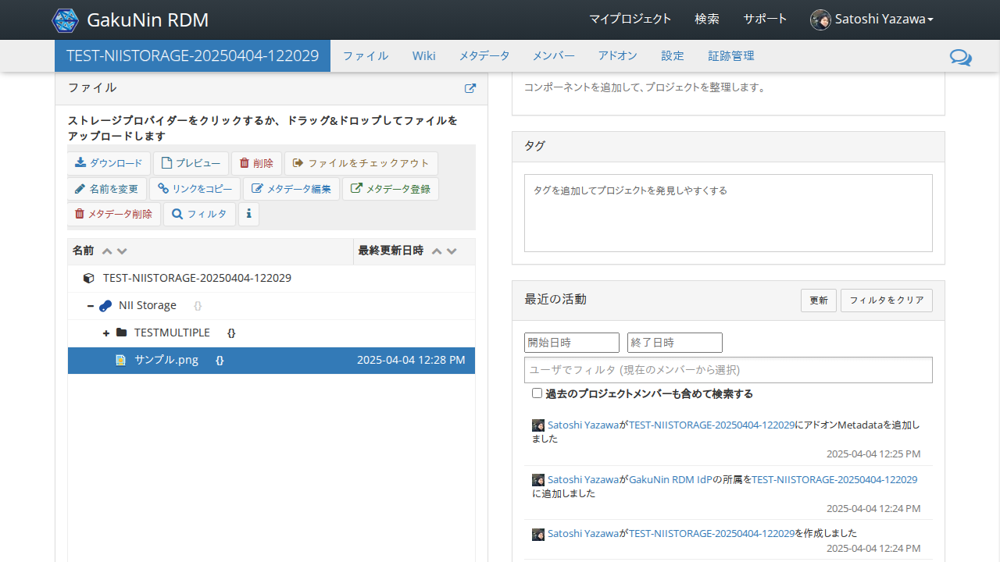

In [138]:
async def _step(page):
    await page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//a[text() = "閉じる"]').click()
    await expect(page.locator('//h3[text() = "ファイルメタデータの編集"]/../../..//label[contains(text(), "Remarks (English)")]/../following-sibling::textarea[1]')).not_to_be_visible(timeout=transition_timeout)

await run_pw(_step)

後始末

In [139]:
await finish_pw_context()

Video: /tmp/tmpbaeuofwa/video-1.webm
HAR: /tmp/tmpbaeuofwa/har.zip


In [140]:
!rm -fr {work_dir}